In [1]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import scipy.optimize
import asn1tools
import tempfile
import functools
import collections
import scapy.utils
from scapy.layers.inet import IP, UDP
import warnings

plt.rcParams['figure.facecolor'] = 'w'
plt.rcParams['figure.figsize'] = (7, 3.5)

## OFDM demodulation

In [2]:
fs = 30720000

T = 1
x = np.fromfile('LTE_downlink_806MHz_2022-04-09_30720ksps.sigmf-data', 'int16', count=int(T*fs*2))
t0 = np.datetime64('2022-04-09T11:09:33.123597')
dt_sample = 1e9 / fs * np.timedelta64(1, 'ns')

# Scale amplitude
x = (x[::2] + 1j*x[1::2])/2e6

delta_f = -1232
delta_phi = 2.03
samp_rate_error = 1 - 1.5e-6

x *= np.exp(1j*(2*np.pi*delta_f/fs*np.arange(x.size) + delta_phi))

In [3]:
# The units here are samples
Tu = 2048 # useful time of a symbol
cp_len = 144  # 4.7 usecs, used in symbols 1-6 in a slot
cp_len2 = 160  # 5.2 usecs, used in symbol 0 in a slot

In [4]:
# Sample of start of the PSS
a0 = 72056
# Sample of start of slot including PSS (not including 1st cyclic prefix)
a1 = a0 - 6 * cp_len - 6 * Tu
# Number of full slots before PSS subframe
samp_per_slot = int(0.5e-3 * fs)
n_full_slot = a1 // samp_per_slot
# Sample of start of first full slot (not including 1st cyclic prefix)
a2 = a1 - n_full_slot * samp_per_slot
a2

12824

In [5]:
# Total number of full slots in the recording
slots = (x.size - a2) // samp_per_slot
nsymbols = slots * 7

# Selection of subcarriers in use
NRB = 50  # Number of resource blocks for a 10 MHz cell
sel_syms = np.arange(Tu//2 - NRB//2 * 12, Tu//2 + NRB//2 * 12 + 1)
no_dc = np.concatenate((np.arange(0, NRB//2 * 12), np.arange(NRB//2 * 12 + 1, NRB * 12 + 1)))

freq_syms = np.fft.fftshift(np.fft.fftfreq(Tu, 1/fs))
freq_syms = freq_syms[sel_syms]

# Extract OFDM symbols
symbols = np.empty((nsymbols, sel_syms.size), 'complex64')
symbol_times = np.empty(nsymbols, 'datetime64[ns]')
for j in range(nsymbols):
    # For each slot, we need to advance cp_len2-cp_len because of the
    # longer cyclic prefix of the first symbol in each slot. delta counts
    # this.
    delta = (cp_len2 - cp_len) * (j//7)
    
    exact_sample = j*(Tu+cp_len)*samp_rate_error
    round_sample = round(exact_sample)
    error_sample = exact_sample - round_sample
    start_sample = a2 + round_sample + delta
    symbol_times[j] = t0 + ((start_sample + error_sample) * 1e9 / fs) * np.timedelta64(1, 'ns')
    syms = np.fft.fftshift(np.fft.fft(x[start_sample:][:Tu]))
    # Correct for fractional sample delay
    syms *= np.exp(1j*2*np.pi*error_sample*np.arange(-Tu//2, Tu//2)/Tu)
    symbols[j] = syms[sel_syms]

## CRS

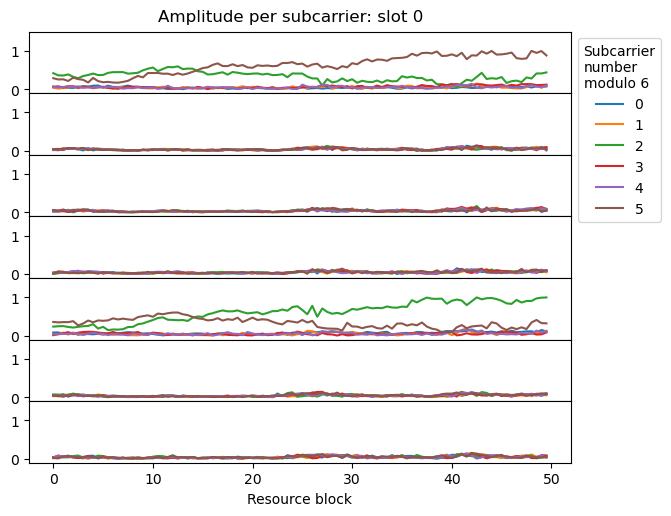

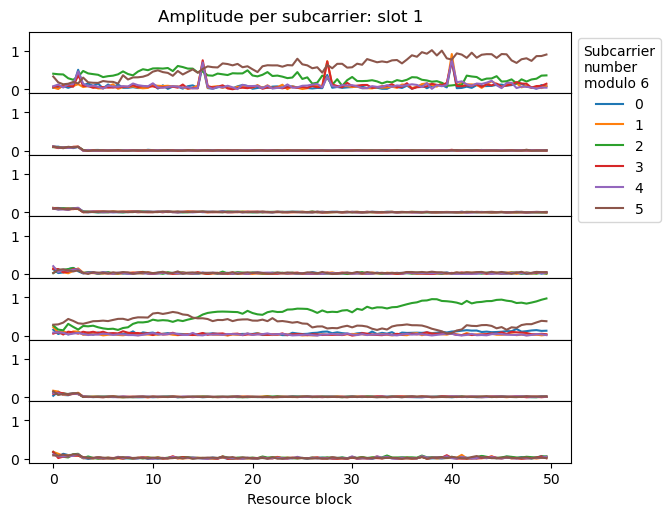

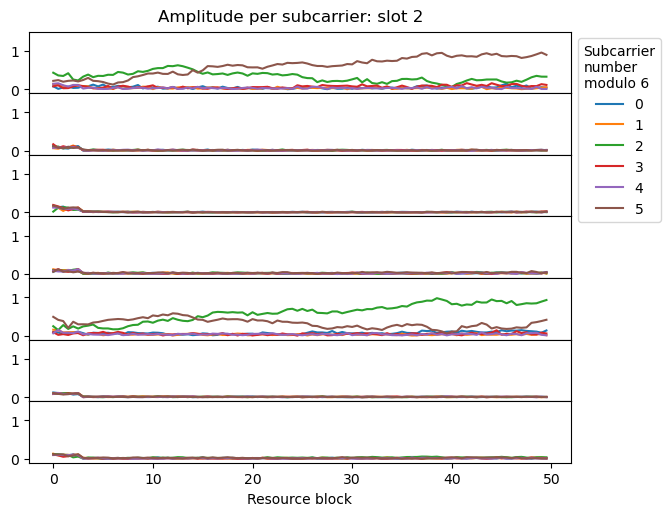

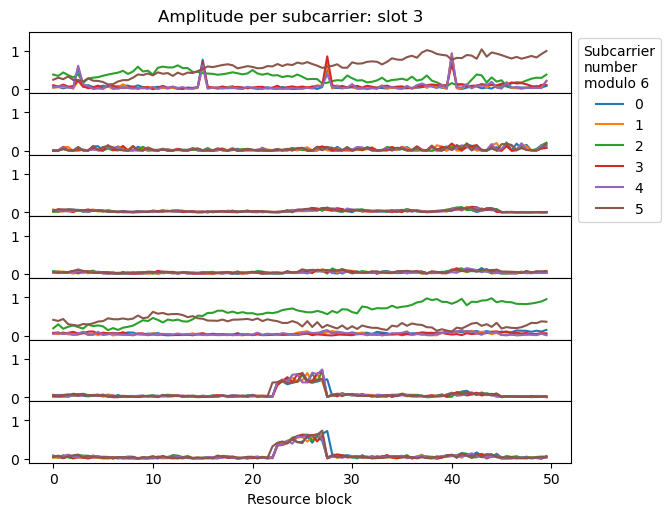

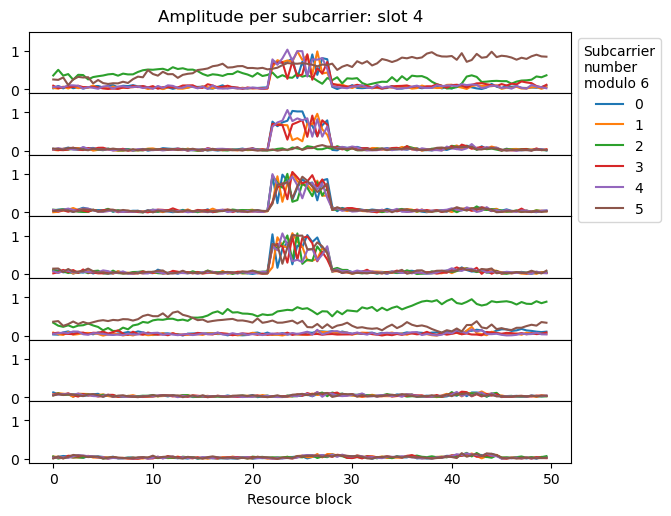

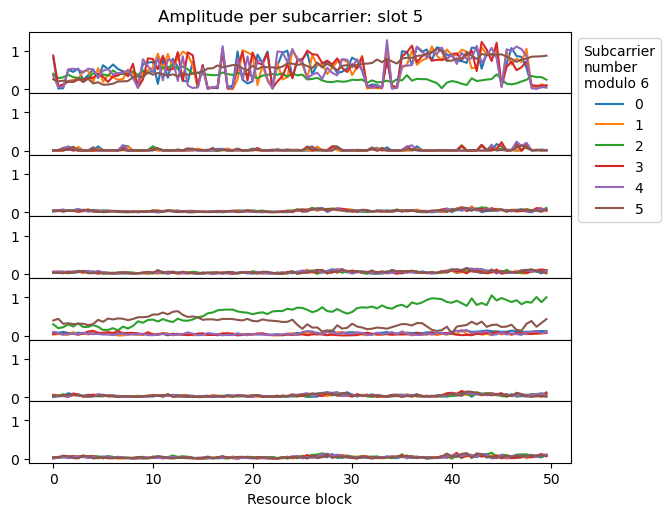

In [6]:
for slot in range(6):
    fig, axs = plt.subplots(7, 1, figsize=(7, 5.6), sharex=True, sharey=True)
    for j, ax in enumerate(axs):
        for k in range(6):
            n = np.arange(0, NRB, 0.5)
            ax.plot(n, np.abs(symbols[7 * slot + j, no_dc][k::6]),
                    label=f'{k}')
        ax.set_yticks([0, 1.0])
    plt.ylim((-0.1, 1.5))
    plt.xlabel('Resource block')
    plt.suptitle(f'Amplitude per subcarrier: slot {slot}', y=0.92)
    plt.legend(bbox_to_anchor=(1, 7), loc='upper left', title='Subcarrier\nnumber\nmodulo 6')
    plt.subplots_adjust(hspace=0)

In [7]:
# Psedurandom sequence following Section 7.2 in 3GPP TS 36.211
def c_seq(c_init, M_PN):
    x1 = 1
    x2 = c_init
    NC = 1600
    c = np.zeros(M_PN, 'uint8')
    # Drop the first NC terms
    for j in range(NC + M_PN):
        if j >= NC:
            c[j - NC] = (x1 ^ x2) & 1
        x1 = (((x1 ^ (x1 >> 3)) & 1) << 30) | (x1 >> 1)
        x2 = (((x2 ^ (x2 >> 1) ^ (x2 >> 2) ^ (x2 >> 3)) & 1) << 30) | (x2 >> 1)
    return c

# QPSK sequence for CRS
def r_seq(ns, l, pci=380):
    NCP = 1  # normal cyclic prefix
    NRBmaxDL = 110
    c_init_rs = 2**10 * (7 * (ns + 1) + l + 1) * (2 * pci + 1) + 2 * pci + NCP
    c = c_seq(c_init_rs, 4 * NRBmaxDL)
    cc = (1 - 2 * c.astype('float')) / np.sqrt(2)
    r = cc[::2] + 1j * cc[1::2]
    return r[NRBmaxDL-NRB:-(NRBmaxDL-NRB)]

In [8]:
# Wipe off QPSK sequence in CRS
# We also consider the CRS for cells in the same group, but they are too noisy
# to estimate a channel well.
ns0 = 17
r0_wipe = {}
r1_wipe = {}
for pci in [378, 379, 380]:
    r0w = np.empty((slots * 2, 2 * NRB), 'complex')
    r1w = np.empty_like(r0w)
    for j in range(2 *  slots):
        symidx = (j // 2) * 7 + 4 * (j % 2)
        nu = (pci + 3 * (j % 2)) % 6
        ns = (symidx // 7 + ns0) % 20
        r = r_seq(ns, symidx % 7, pci=pci)
        r0w[j] = symbols[symidx, no_dc][nu::6] * np.conjugate(r)
        r1w[j] = symbols[symidx, no_dc][(nu+3)%6::6] * np.conjugate(r)
    r0_wipe[pci] = r0w
    r1_wipe[pci] = r1w

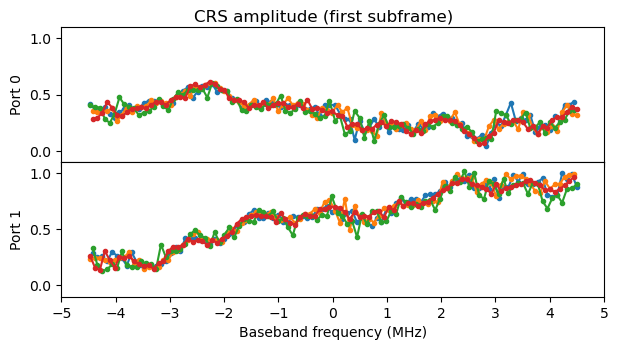

In [9]:
fig, axs = plt.subplots(2, 1, sharex=True, sharey=True)
for j in range(4):
    nu = (pci + (j % 2)*3) % 6
    f = freq_syms[no_dc][nu::6] * 1e-6
    axs[0].plot(f, np.abs(r0_wipe[380][j]), '.-')
    f = freq_syms[no_dc][(nu+3)%6::6] * 1e-6
    axs[1].plot(f, np.abs(r1_wipe[380][j]), '.-')
plt.ylim((-0.1, 1.1))
plt.subplots_adjust(hspace=0)
plt.xticks(np.arange(-5, 6))
for j in range(2):
    axs[j].set_ylabel(f'Port {j}')
plt.xlabel('Baseband frequency (MHz)')
plt.suptitle('CRS amplitude (first subframe)', y=0.93);

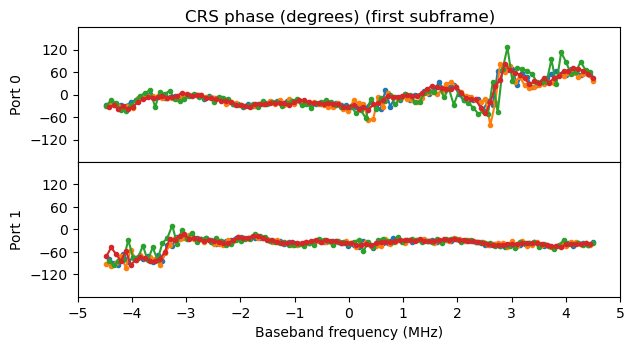

In [10]:
fig, axs = plt.subplots(2, 1, sharex=True, sharey=True)
for j in range(4):
    nu = (pci + (j % 2)*3) % 6
    f = freq_syms[no_dc][nu::6] * 1e-6
    axs[0].plot(f, np.rad2deg(np.angle(r0_wipe[380][j])), '.-')
    f = freq_syms[no_dc][(nu+3)%6::6] * 1e-6
    axs[1].plot(f, np.rad2deg(np.angle(r1_wipe[380][j])), '.-')
plt.ylim((-180, 180))
plt.subplots_adjust(hspace=0)
plt.yticks(np.arange(-180 + 60, 180, 60))
plt.xticks(np.arange(-5, 6))
for j in range(2):
    axs[j].set_ylabel(f'Port {j}')
plt.xlabel('Baseband frequency (MHz)')
plt.suptitle('CRS phase (degrees) (first subframe)', y=0.93);

## Channel estimation

In [11]:
# Calculation of cubic spline in terms of it coefficients.
# This is used to fit a cubic spline to the channel.
def cubic_spline(coeffs):
    coeffs = coeffs.reshape(-1, 2)
    values = np.empty(NRB * 12, 'complex')
    values = values.reshape(coeffs.shape[0] - 1, -1)
    for j in range(values.shape[0]):
        # p(x) = ax^3 + bx^2 + cx + d
        # a = 2p(0) + p'(0) - 2p(1) + p'(1)
        # b = -3p(0) - 2p'(0) + 3p(1) - p'(1)
        # c = p'(0)
        # d = p(0)
        cf = coeffs[j:j+2].ravel()
        p = np.array([2*cf[0] + cf[1] - 2*cf[2] + cf[3],
                      -3*cf[0] - 2*cf[1] + 3*cf[2] - cf[3],
                      cf[1],
                      cf[0]])
        t = (np.arange(values.shape[1]) + 1) / (values.shape[1] + 1)
        values[j] = np.polyval(p, t)
    # Add central subcarrier (copying the values of the two neighbouring subcarriers)
    values = values.reshape(2, -1)
    return np.concatenate((values[0], [values[0, -1]], values[1]))

ncoeffs = 22
# Matrix for solving the linear least squares fit of the cubic spline
A_cubic_spline = np.array([cubic_spline(np.eye(1, ncoeffs, j)) for j in range(ncoeffs)]).T

In [12]:
# Least squares fit of the cubic spline to the CRS complex amplitudes
r0_fit = {}
r1_fit = {}
for pci in [378, 380]:
    r0f = np.empty((slots * 2, ncoeffs), 'complex')
    r1f = np.empty_like(r0f)
    for j in range(slots * 2):
        nu = pci % 6
        r0f[j] = np.linalg.lstsq(A_cubic_spline[no_dc][nu::6],
                                 r0_wipe[pci][j], rcond=None)[0]
        r1f[j] = np.linalg.lstsq(A_cubic_spline[no_dc][(nu+3)%6::6],
                                 r1_wipe[pci][j], rcond=None)[0]
    r0_fit[pci] = r0f
    r1_fit[pci] = r1f

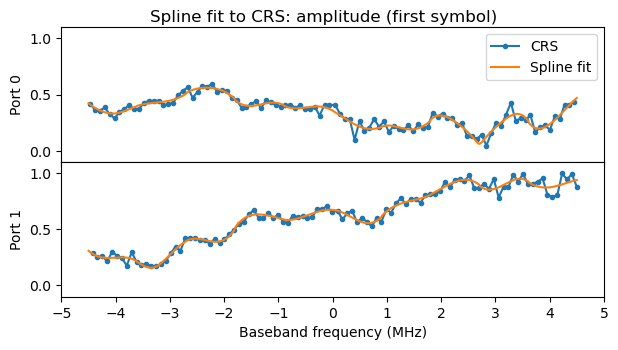

In [13]:
fig, axs = plt.subplots(2, 1, sharex=True, sharey=True)
nu = pci % 6
f = freq_syms[no_dc][nu::6] * 1e-6
axs[0].plot(f, np.abs(r0_wipe[380][0]), '.-',
            label='CRS')
axs[0].plot(freq_syms * 1e-6, np.abs(cubic_spline(r0_fit[380][0])),
            label='Spline fit')
axs[0].legend()
f = freq_syms[no_dc][(nu+3)%6::6] * 1e-6
axs[1].plot(f, np.abs(r1_wipe[380][0]), '.-')
axs[1].plot(freq_syms * 1e-6, np.abs(cubic_spline(r1_fit[380][0])))
plt.ylim((-0.1, 1.1))
plt.subplots_adjust(hspace=0)
plt.xticks(np.arange(-5, 6))
for j in range(2):
    axs[j].set_ylabel(f'Port {j}')
plt.xlabel('Baseband frequency (MHz)')
plt.suptitle('Spline fit to CRS: amplitude (first symbol)', y=0.93);

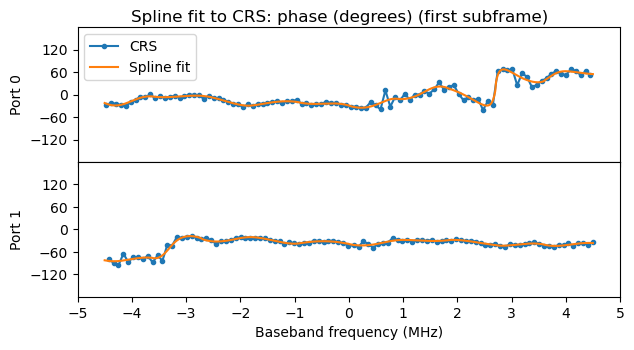

In [14]:
fig, axs = plt.subplots(2, 1, sharex=True, sharey=True)
nu = pci % 6
f = freq_syms[no_dc][nu::6] * 1e-6
axs[0].plot(f, np.rad2deg(np.angle(r0_wipe[380][0])), '.-',
            label='CRS')
axs[0].plot(freq_syms * 1e-6, np.rad2deg(np.angle(cubic_spline(r0_fit[380][0]))),
            label='Spline fit')
axs[0].legend()
f = freq_syms[no_dc][(nu+3)%6::6] * 1e-6
axs[1].plot(f, np.rad2deg(np.angle(r1_wipe[380][0])), '.-')
axs[1].plot(freq_syms * 1e-6, np.rad2deg(np.angle(cubic_spline(r1_fit[380][0]))))
plt.ylim((-180, 180))
plt.subplots_adjust(hspace=0)
plt.yticks(np.arange(-180 + 60, 180, 60))
plt.xticks(np.arange(-5, 6))
for j in range(2):
    axs[j].set_ylabel(f'Port {j}')
plt.xlabel('Baseband frequency (MHz)')
plt.suptitle('Spline fit to CRS: phase (degrees) (first subframe)', y=0.93);

In [15]:
# Calculation of channel by linear interpolation of cubic splines fitted to adjacent CRS
def channel(nsymbol, pci=380):
    nslot = nsymbol // 7
    left, adv, dist = (
        (2 * nslot, nsymbol - 7 * nslot, 4)
        if nsymbol % 7 < 4
        else (2 * nslot + 1, nsymbol - 7 * nslot - 4, 3))
    r0 = r0_fit[pci][left] * (1-adv/dist) + r0_fit[pci][left+1] * adv/dist
    r1 = r1_fit[pci][left] * (1-adv/dist) + r1_fit[pci][left+1] * adv/dist
    return (cubic_spline(r0), cubic_spline(r1))

# Removes the resource elements corresponding to CRS in one OFDM symbol
def remove_ref_signals(nsymbol, syms, pci=380, pbch=False):
    extra = [1] if pbch else []
    if nsymbol % 7 not in [0, 4] + extra:
        return syms
    sel = [j for j in range(6) if j not in [pci % 6, (pci + 3) % 6]]
    return syms.reshape(-1, 6)[:, sel].ravel()

# Extracts only the resource elements corresponding to CRS in one OFDM symbol
def ref_signals(nsymbol, syms, port, pci=380):
    if nsymbol % 7 not in [0, 4]:
        return np.array([])
    nu = (pci + (port * 3) + (nsymbol % 7 == 4) * 3) % 6
    return syms.reshape(-1, 6)[:, nu::6].ravel()

# Transmit diversity equalization
def diversity(syms, r0, r1):
    y = np.empty_like(syms)
    y[::2] = ((np.conjugate(r0[::2]) * syms[::2] + r1[1::2] * np.conjugate(syms[1::2])) 
              / (np.abs(r0[::2])**2 + np.abs(r1[1::2])**2))
    y[1::2] = ((-r1[::2] * np.conjugate(syms[::2]) + np.conjugate(r0[1::2]) * syms[1::2])
               / (np.abs(r0[1::2])**2 + np.abs(r1[::2])**2))
    return y

# TM4
def tm4(syms, r0, r1, precoding=3, scale=1):
    if precoding == 1:
        # [1, 1]/sqrt(2)
        return syms / (r0 + r1) * scale
    if precoding == 2:
        # [1, -1]/sqrt(2)
        return syms / (r0 - r1) * scale
    if precoding == 3:
        # [1, 1j]/sqrt(2)
        return syms / (r0 + 1j * r1) * scale
    if precoding == 4:
        # [1, -1j]/sqrt(2)
        return syms / (r0 - 1j * r1) * scale
    raise ValueError(f'precoding {precoding} not supported by TM4')

## Transmit diversity equalization

In [16]:
def diversity_plot(nsyms, subcarrier_sel, transmit_port='diversity', pbch=False, precoding=3):
    sel = no_dc[subcarrier_sel]
    nrows = (nsyms.stop - 1) // 7 - nsyms.start // 7 + 1
    width = 7
    height = width * nrows / 7
    fig, axs = plt.subplots(nrows, 7, figsize=(width, height), facecolor='w', sharex=True, sharey=True)
    axs = axs.reshape(nrows, 7)
    markersize = 3
    for nsym in nsyms:
        row = nsym // 7 - nsyms.start // 7
        col = nsym % 7
        ax = axs[row, col]
    
        r0, r1 = channel(nsym)
        r0d, r1d = (remove_ref_signals(nsym, r[sel], pbch=pbch) for r in (r0, r1))
        d = remove_ref_signals(nsym, symbols[nsym, sel], pbch=pbch)
        if transmit_port == 'diversity':
            x = diversity(d, r0d, r1d)
        elif transmit_port == 'tm4':
            x = tm4(d, r0d, r1d, precoding)
        elif transmit_port == 0:
            x = d / r0d
        else:
            x = d / r1d
        ax.plot(x.real, x.imag, '.', markersize=markersize)
    for row in range(nrows):
        for col in range(7):
            ax = axs[row, col]
            nsym = nsyms.start//7 * 7 + row * 7 + col
            r0, r1 = channel(nsym)
            ax.plot([], [], '.', label='Non-reference', color='C0', markersize=markersize)
            for port in range(2):
                ref = r0 if port == 0 else r1
                r = ref_signals(nsym, symbols[nsym, sel] / ref[sel], port)
                if r.size:
                    ax.plot(r.real, r.imag, '.', label=f'R{port}', color=f'C{port+1}',
                            markersize=markersize)
                  
            ax.plot(np.array([1, 1, -1, -1])/np.sqrt(2),
                     np.array([1, -1, 1, -1])/np.sqrt(2), '.',
                     color='red', markersize=2)

            ax.set_xlim((-2, 2))
            ax.set_ylim((-2, 2))
            ax.set_xticks([])
            ax.set_yticks([])
    for row in range(nrows):
        axs[row, 0].set_ylabel(f'Slot {row + nsyms.start // 7}')
    for col in range(7):
        axs[-1, col].set_xlabel(f'Symbol {col}', rotation=45)
        
    fig.subplots_adjust(hspace=0, wspace=0)
    axs[0, 0].legend(bbox_to_anchor=(7, 1), loc='upper left')
    if transmit_port == 'diversity':
        using = 'transmit diversity'
    elif transmit_port == 'tm4':
        using = 'TM4 (closed-loop spatial multiplexing)'
    else:
        using = f'antenna port {transmit_port}'
    rbs = np.arange(NRB*12)[subcarrier_sel]
    rb0 = rbs[0] // 12
    rb1 = rbs[-1] // 12
    fig.suptitle(f'Symbols equalized using {using} (RBs {rb0}-{rb1})', y=1.05);

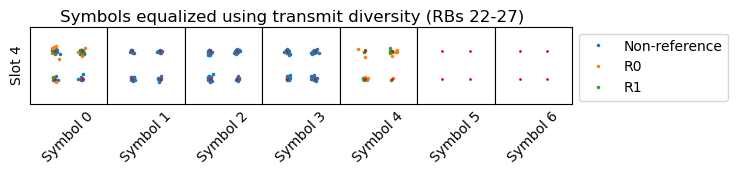

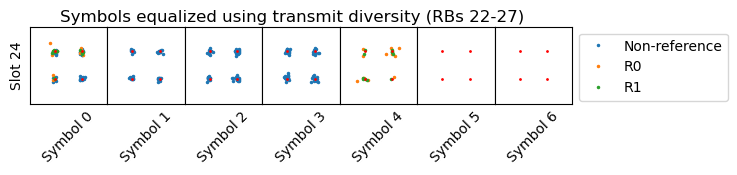

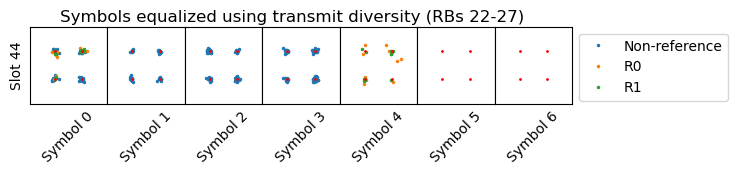

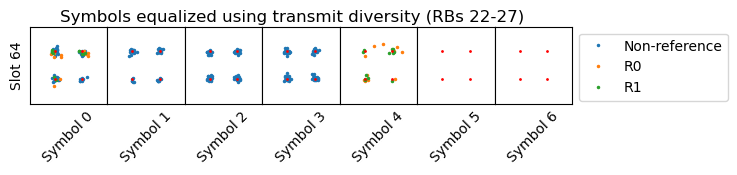

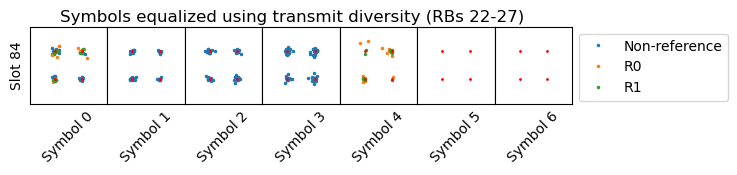

In [17]:
# Plots of the demodulation of a few PBCH transmissions
for start in range(28, nsymbols, 140)[:5]:
    diversity_plot(range(start, start+4), slice(22*12, 28*12), pbch=True)

## PBCH

In [18]:
# Demodulate all the PBCH transmissions
pbch = [diversity(
            remove_ref_signals(k, symbols[j+k, no_dc][22*12:28*12], pbch=True),
            remove_ref_signals(k, channel(j+k)[0][22*12:28*12], pbch=True),
            remove_ref_signals(k, channel(j+k)[1][22*12:28*12], pbch=True))
        for j in range(4*7, symbols.shape[0], 140) for k in range(4)]

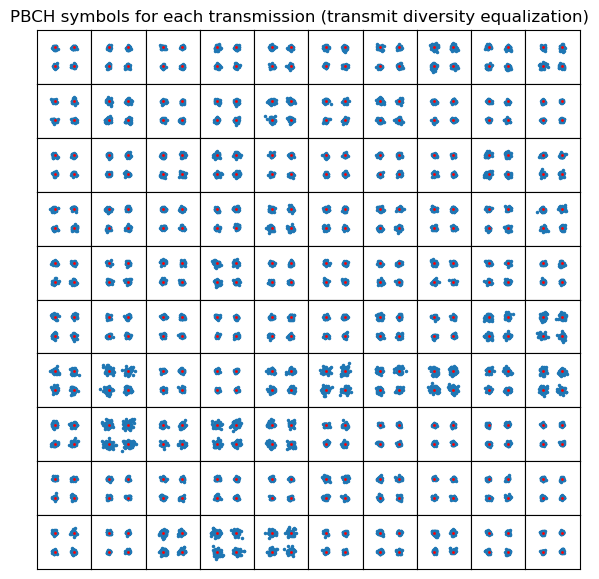

In [19]:
n = 10
fig, axs = plt.subplots(n, n, figsize=(7, 7), facecolor='w', sharex=True, sharey=True)
for j in range(n):
    for k in range(n):
        ax = axs[j, k]
        idx = n * j + k
        syms = np.concatenate(pbch[4*idx:4*(idx+1)])
        ax.plot(syms.real, syms.imag, '.', markersize=3)
        ax.plot(np.array([1, 1, -1, -1])/np.sqrt(2),
                np.array([1, -1, 1, -1])/np.sqrt(2), '.',
                color='red', markersize=2)
        ax.set_xlim((-2, 2))
        ax.set_ylim((-2, 2))
        ax.set_xticks([])
        ax.set_yticks([])
fig.subplots_adjust(hspace=0, wspace=0)
fig.suptitle('PBCH symbols for each transmission (transmit diversity equalization)', y=0.91);

## PDSCH equalization

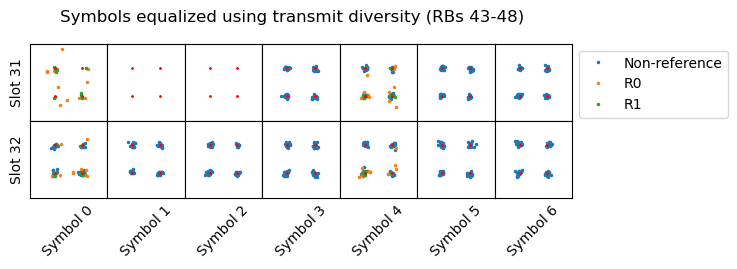

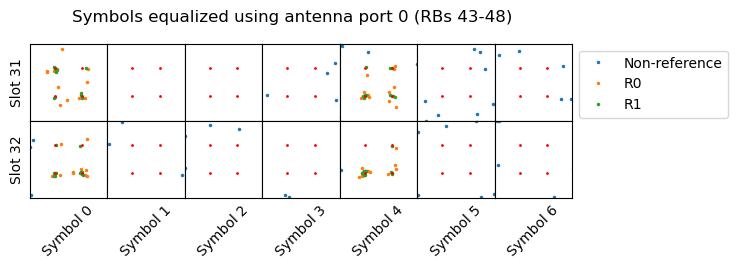

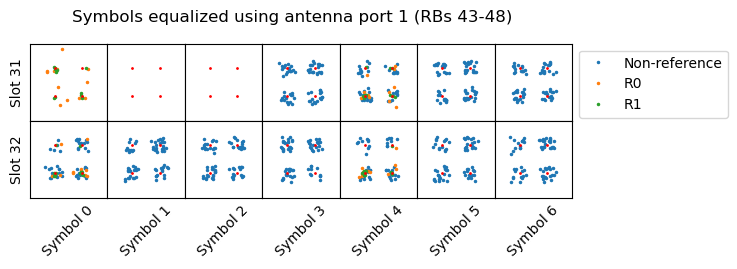

In [20]:
# Comparison of equalization of a PDSCH transmission using transmit diversity and only one antenna port
diversity_plot(range(220, 231), slice(-7*12, -12))
diversity_plot(range(220, 231), slice(-7*12, -12), transmit_port=0)
diversity_plot(range(220, 231), slice(-7*12, -12), transmit_port=1)

## TM4: closed-loop spatial multiplexing

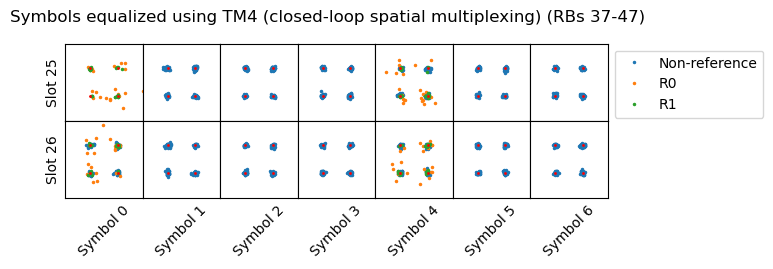

In [21]:
diversity_plot(range(176, 189), slice(-13*12, -2*12), transmit_port='tm4')

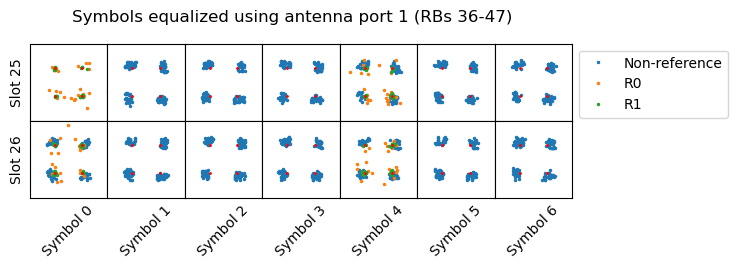

In [22]:
diversity_plot(range(176, 189), slice(-14*12, -2*12), transmit_port=1)

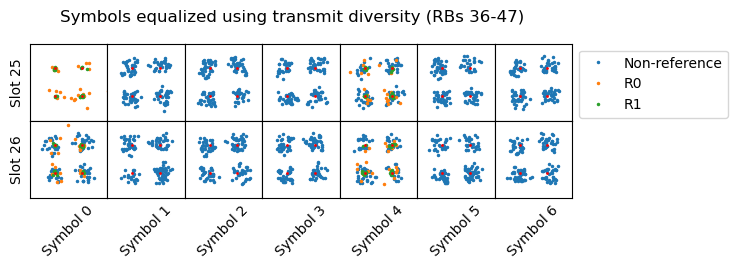

In [23]:
diversity_plot(range(176, 189), slice(-14*12, -2*12), transmit_port='diversity')

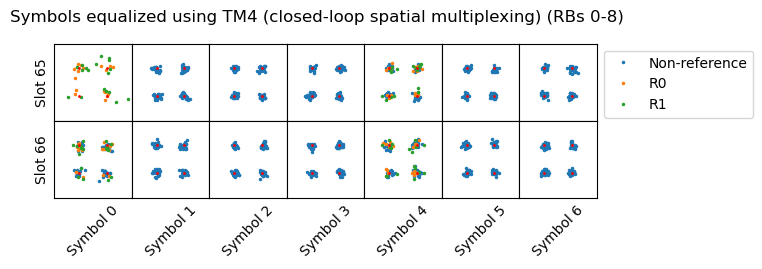

In [24]:
diversity_plot(range(456, 469), slice(0, 9*12), transmit_port='tm4')

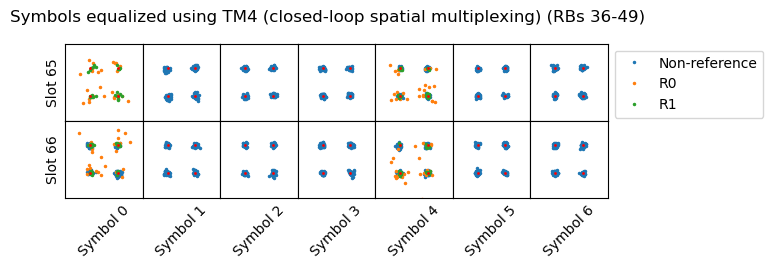

In [25]:
diversity_plot(range(456, 469), slice(-14*12, None), transmit_port='tm4')

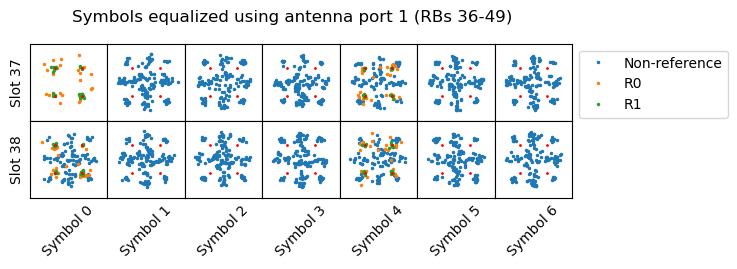

In [26]:
diversity_plot(range(260, 273), slice(-14*12, None), transmit_port=1)

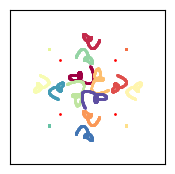

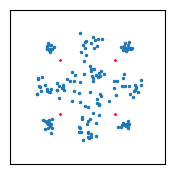

In [27]:
nsym = 261
subcarrier_sel = slice(-14*12, None)
sel = no_dc[subcarrier_sel]
r0, r1 = channel(261)
r0d, r1d = (remove_ref_signals(nsym, r[sel]) for r in (r0, r1))
d = remove_ref_signals(nsym, symbols[nsym, sel])

bits = [(a, b, c, d) for a in [0, 1] for b in [0, 1] for c in [0, 1] for d  in [0, 1]]
const = [(((1 - 2 * b[0]) + 1j * (1 - 2 * b[1]))/ np.sqrt(2),
          ((1 - 2 * b[2]) + 1j * (1 - 2 * b[3]))/ np.sqrt(2))
         for b in bits]
const = np.array([(r0d * (c[0] + c[1]) / np.sqrt(2) + r1d * (c[0] - c[1]) / np.sqrt(2)) / r1d
                 for c in const])
plt.figure(figsize=(2, 2))
plt.gca().set_prop_cycle('color', plt.cm.Spectral(np.linspace(0, 1, 16)))
for j, c in enumerate(const):
    plt.plot(c.real, c.imag, '.', markersize=2)
    
plt.plot(np.array([1, 1, -1, -1])/np.sqrt(2),
         np.array([1, -1, 1, -1])/np.sqrt(2), '.',
         color='red', markersize=2)
plt.xlim((-2, 2))
plt.ylim((-2, 2))
plt.xticks([])
plt.yticks([]);

plt.figure(figsize=(2, 2))
s = d / r1d
plt.plot(s.real, s.imag, '.', markersize=3, color='C0')
plt.plot(np.array([1, 1, -1, -1])/np.sqrt(2),
         np.array([1, -1, 1, -1])/np.sqrt(2), '.',
         color='red', markersize=2)
plt.xlim((-2, 2))
plt.ylim((-2, 2))
plt.xticks([])
plt.yticks([]);

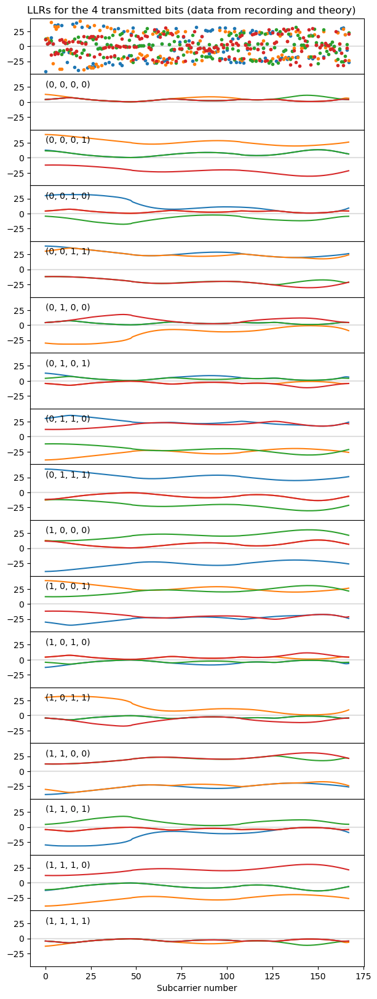

In [28]:
noise_variance = 0.15**2

def maxss(a, b):
    d = np.abs(a - b)
    c = np.zeros(a.shape)
    c[d < 37] = np.exp(-d[d < 37])
    c[d < 9] = np.log1p(c[d < 9])
    return np.maximum(a, b) + c

fig, axs = plt.subplots(17, 1, figsize=(7, 20), sharex=True, sharey=True)
for k, syms in enumerate([s] + list(const)):
    dists = -np.abs(syms - const)**2 / (2 * noise_variance)
    llrs = np.empty((4, s.size))
    for j in range(4):
        llrs[j] = (
            functools.reduce(maxss, (c for b, c in zip(bits, dists) if b[j] == 0))
            - functools.reduce(maxss, (c for b, c in zip(bits, dists) if b[j] == 1)))
    axs[k].axhline(y=0, color='grey', alpha=0.25)
    axs[k].plot(llrs.T, '.' if k == 0 else '-')
    if k >= 1:
        axs[k].text(0, 25, str(bits[k-1]))
plt.subplots_adjust(hspace=0)
axs[-1].set_xlabel('Subcarrier number')
plt.suptitle('LLRs for the 4 transmitted bits (data from recording and theory)', y=0.89);

## PCFICH

In [29]:
# PCFICH demodulation
symidx0 = 7
npcfich = (nsymbols - symidx0)//14
pcfich = np.empty((npcfich, 16), 'complex')
symidx_pcfich = np.arange(symidx0, nsymbols, 14)
ns_pcfich = (symidx_pcfich // 7 + ns0) % 20
kbar = 6 * (pci % (2 * NRB))
for j, symidx in enumerate(symidx_pcfich):
    r0, r1 = channel(symidx)
    pcfich[j] = np.concatenate([
        diversity(
            remove_ref_signals(0, symbols[symidx, no_dc][(kbar+offset)%(12*NRB):][:6], pbch=True),
            remove_ref_signals(0, r0[no_dc][(kbar+offset)%(12*NRB):][:6], pbch=True),
            remove_ref_signals(0, r1[no_dc][(kbar+offset)%(12*NRB):][:6], pbch=True))
        for offset in [0, 6 * (NRB//2), 6 * (2*NRB//2), 6 * (3*NRB//2)]])

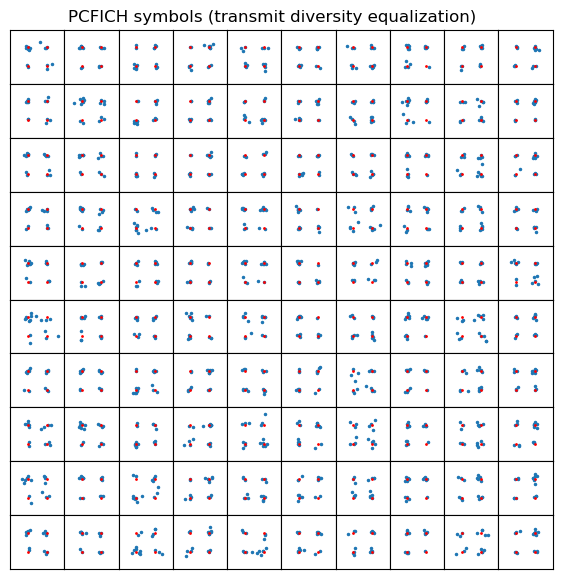

In [30]:
n = 10
fig, axs = plt.subplots(n, n, figsize=(7, 7), facecolor='w', sharex=True, sharey=True)
for j in range(n):
    for k in range(n):
        ax = axs[j, k]
        idx = n * j + k
        syms = pcfich[idx]
        ax.plot(syms.real, syms.imag, '.', markersize=3)
        ax.plot(np.array([1, 1, -1, -1])/np.sqrt(2),
                np.array([1, -1, 1, -1])/np.sqrt(2), '.',
                color='red', markersize=2)
        ax.set_xlim((-2, 2))
        ax.set_ylim((-2, 2))
        ax.set_xticks([])
        ax.set_yticks([])
fig.subplots_adjust(hspace=0, wspace=0)
fig.suptitle('PCFICH symbols (transmit diversity equalization)', y=0.91);

In [31]:
# PCFICH decoding using hard decision
pcfich_bits = 1 * (pcfich.astype('complex64').view('float32') < 0)
scramble = np.array([c_seq((ns//2 + 1) * (2 * pci + 1) * 2**9 + pci, 32)
                     for ns in ns_pcfich])
pcfich_descramble = pcfich_bits ^ scramble

In [32]:
# Table 5.3.4-1: CFI code words from 3GPP 36.212
cfi_codings = np.array(
    [[0,1,1,0,1,1,0,1,1,0,1,1,0,1,1,0,1,1,0,1,1,0,1,1,0,1,1,0,1,1,0,1],
     [1,0,1,1,0,1,1,0,1,1,0,1,1,0,1,1,0,1,1,0,1,1,0,1,1,0,1,1,0,1,1,0],
     [1,1,0,1,1,0,1,1,0,1,1,0,1,1,0,1,1,0,1,1,0,1,1,0,1,1,0,1,1,0,1,1]])

In [33]:
pcfich_bit_errors = np.sum(pcfich_descramble[:, np.newaxis, :] ^ cfi_codings, axis=-1)
pcfich_values = 1 + np.argmin(pcfich_bit_errors, axis=1)
pcfich_bit_errors = np.min(pcfich_bit_errors, axis=1)

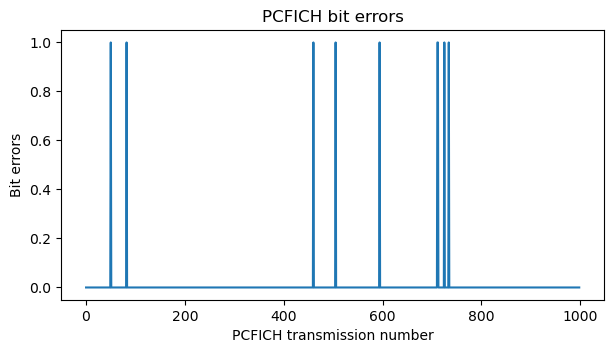

In [34]:
plt.plot(pcfich_bit_errors)
plt.title('PCFICH bit errors')
plt.ylabel('Bit errors')
plt.xlabel('PCFICH transmission number');

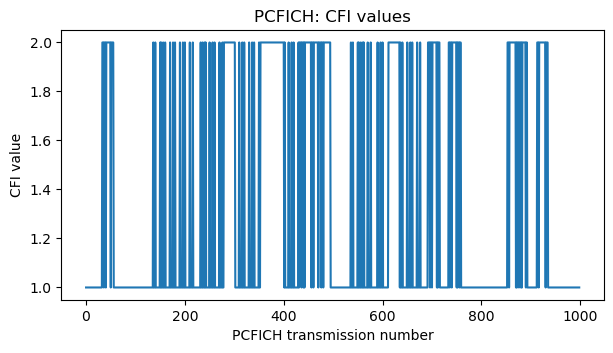

In [35]:
plt.plot(pcfich_values)
plt.title('PCFICH: CFI values')
plt.ylabel('CFI value')
plt.xlabel('PCFICH transmission number');

## PDSCH

In [36]:
# Compute PDSCH power in order to power-detect PDSCH allocations

rb_power = (np.abs(symbols[:, no_dc])**2)
# Blank PCFICH
kbar = 6 * (pci % (2 * NRB))
for offset in [0, 6 * (NRB//2), 6 * (2*NRB//2), 6 * (3*NRB//2)]:
    rb_power[7::14, (kbar+offset)%(NRB*12):][:, :6] = np.nan
rb_power = rb_power.reshape((-1, NRB, 12))
# Blank CRS
rb_power[::7, :, (pci%3)::3] = np.nan
rb_power[4::7, :, (pci%3)::3] = np.nan
# Blank PSS and SSS
rb_power[3*7+5::70, NRB//2-3:NRB//2+3] = 0
rb_power[3*7+6::70, NRB//2-3:NRB//2+3] = 0

# Blank PBCH
for j in range(4):
    rb_power[4*7+j::140, NRB//2-3:NRB//2+3] = 0
rb_power = np.nanmean(rb_power, axis=-1)

pdsch_power = rb_power.copy()
pdsch_power = pdsch_power[7:]  # Align to start of subframe
pdsch_power = pdsch_power.reshape(-1, 14, NRB)
# Blank control symbols according to CFI
pdsch_power[:, ::7] = np.nan
pdsch_power[pcfich_values == 2, 1::7] = np.nan
pdsch_power = np.nanmean(pdsch_power, axis=1)

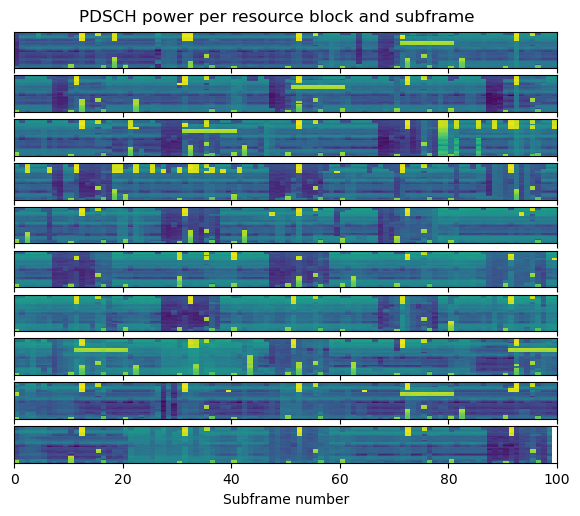

In [37]:
per_row = 100
fig, axs = plt.subplots(int(np.ceil(pdsch_power.shape[0]/per_row)), 1, 
                        figsize=(7, 5.6),
                        sharex=True, sharey=True)
for j, ax in enumerate(axs):
    a = pdsch_power[j*per_row:(j+1)*per_row, ::-1]
    ax.imshow(10*np.log10(a.T),
              aspect='auto', interpolation='none',
              extent=[0, a.shape[0], 0, NRB],
              vmin=10*np.log10(np.min(pdsch_power)),
              vmax=10*np.log10(np.max(pdsch_power)))
    ax.set_xlim((0, per_row))
    ax.set_yticks([])
axs[-1].set_xlabel('Subframe number');
plt.suptitle('PDSCH power per resource block and subframe', y=0.92);

In [38]:
cutoff = 0.03
pdsch_detect = pdsch_power >= cutoff

In [39]:
# Cluster PDSCH allocations in adjacent resource blocks in the same subframe

def cluster(x):
    clusters = []
    start = None
    for j, a in enumerate(x):
        if not a:
            if start is not None:
                clusters.append((start, j))
                start = None
        elif start is None:
            start = j
    if start is not None:
        clusters.append((start, j+1))
    return clusters

pdsch_allocations = []
for j, x in enumerate(pdsch_detect):
    for y in cluster(x):
        pdsch_allocations.append((j, y))

/tmp/ipykernel_633585/3642100727.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(nrows, 7, figsize=(width, height), facecolor='w', sharex=True, sharey=True)


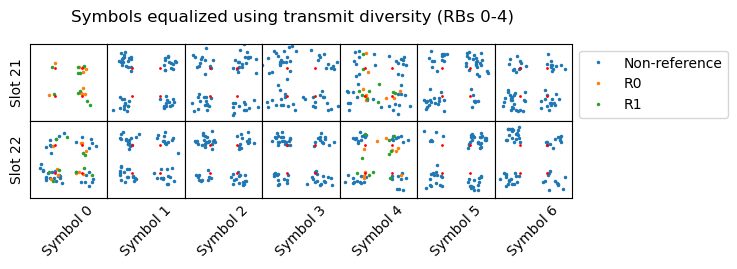

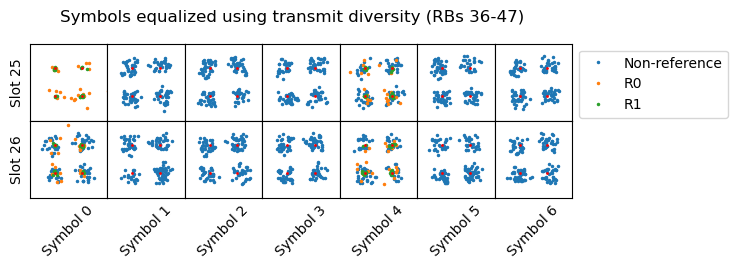

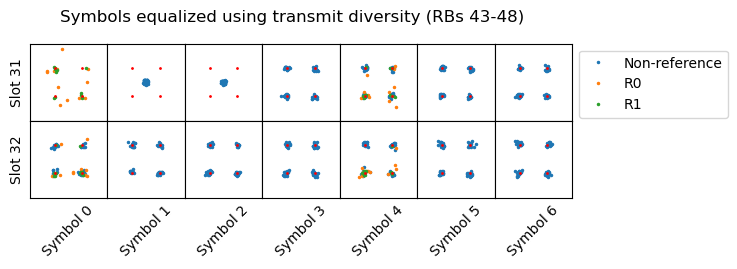

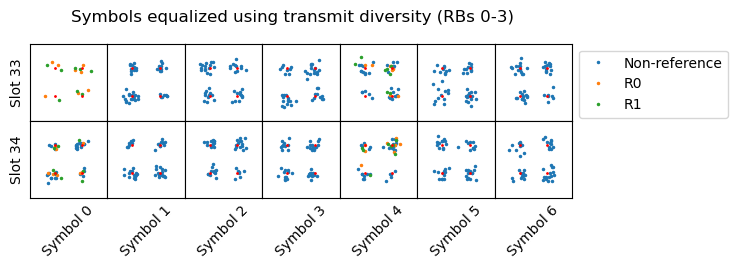

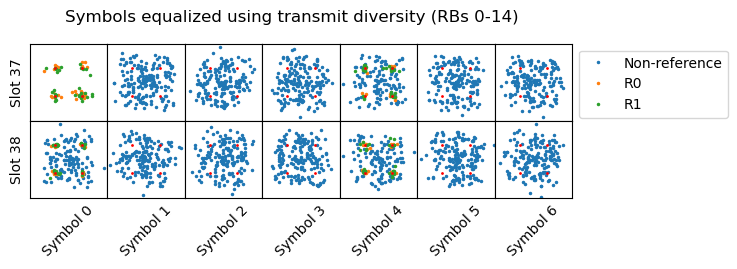

...

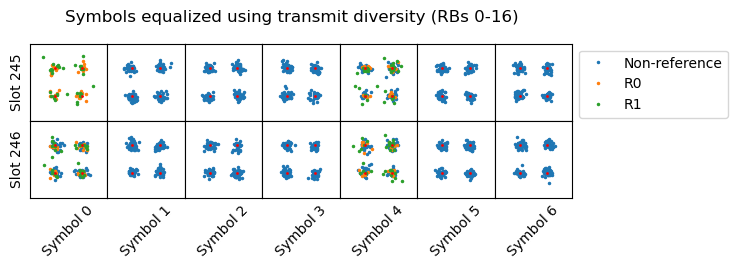

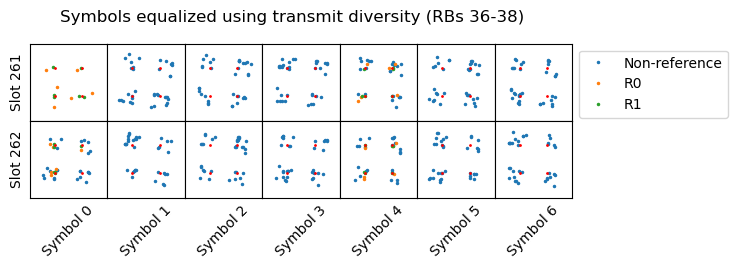

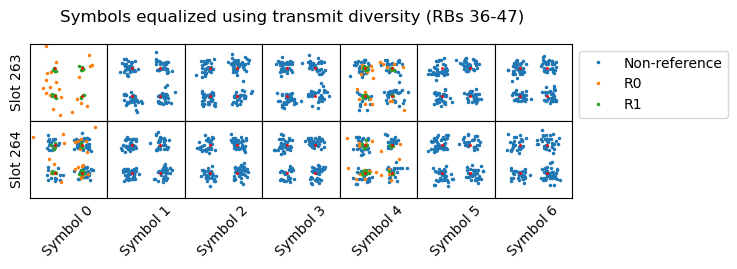

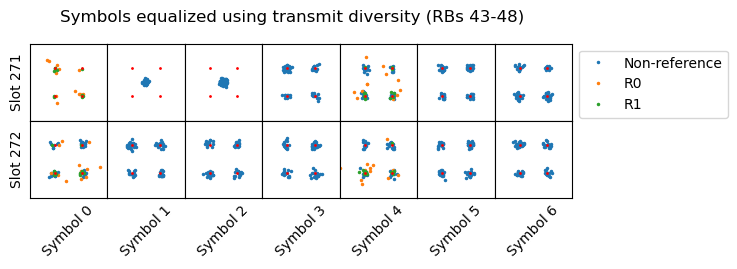

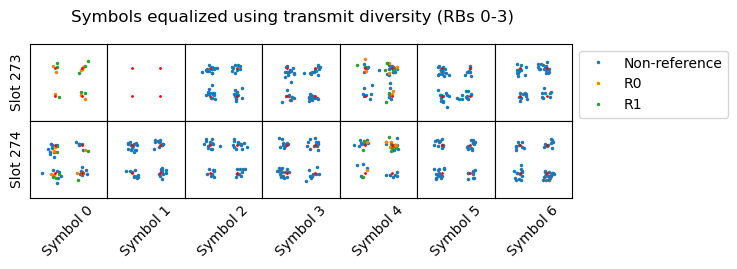

In [40]:
# Plot the demodulation of the first 50 PDSCH transmissions
for alloc in pdsch_allocations[:50]:
    sym0 = 7 + alloc[0] * 14 + pcfich_values[alloc[0]]
    sym_end = 7 + alloc[0] * 14 + 14 
    syms = range(sym0, sym_end)
    subcarriers = slice(alloc[1][0]*12, alloc[1][1]*12)
    diversity_plot(syms, subcarriers)

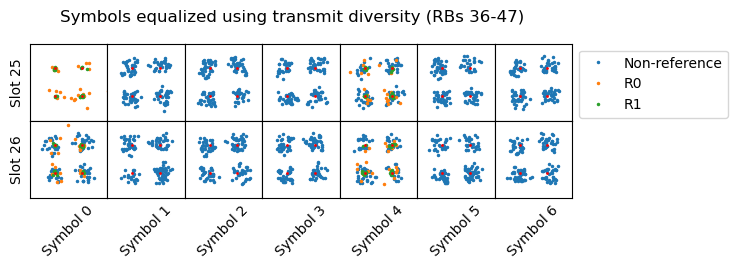

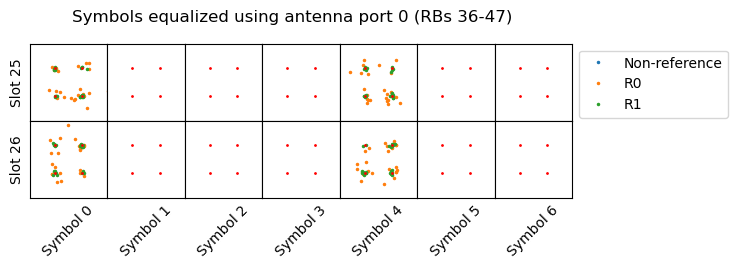

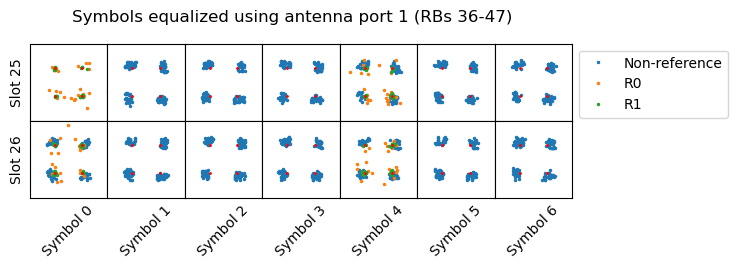

In [41]:
# Comparison of different equalizations for some transmissions
diversity_plot(range(176, 189), slice(-14*12, -2*12))
diversity_plot(range(176, 189), slice(-14*12, -2*12), transmit_port=0)
diversity_plot(range(176, 189), slice(-14*12, -2*12), transmit_port=1)

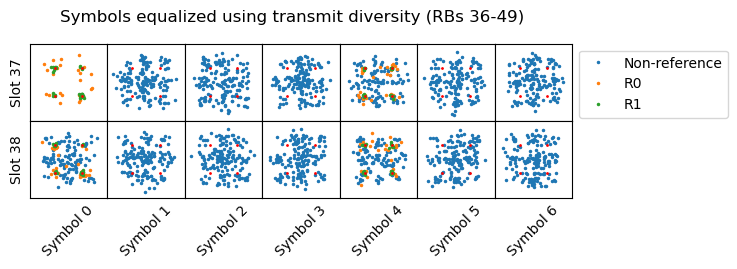

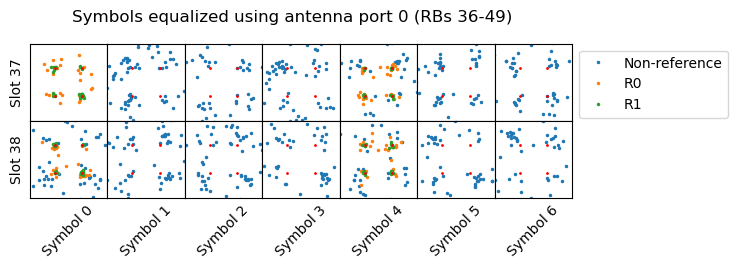

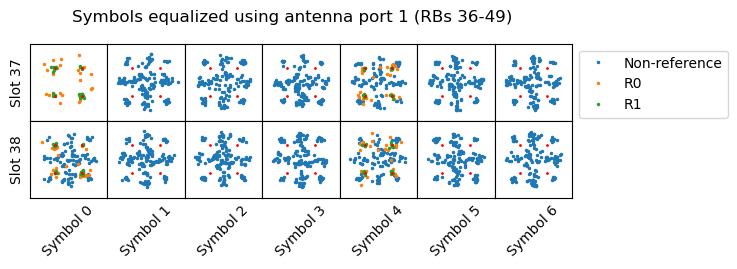

In [42]:
diversity_plot(range(260, 273), slice(-14*12, None))
diversity_plot(range(260, 273), slice(-14*12, None), transmit_port=0)
diversity_plot(range(260, 273), slice(-14*12, None), transmit_port=1)

## PHICH

In [43]:
n0 = 2 * NRB - 4  # number of REGs not allocated to PCFICH
Ng = 1
n_phich_groups = int(np.ceil(Ng * NRB / 8))
phich_offset = pci % n0
(n_phich_groups, phich_offset)

(7, 92)

In [44]:
pcfich_regs = (np.arange(4) * NRB // 2 + pci) % (2 * NRB)
avail_regs = np.array([reg for reg in np.arange(2 * NRB) if reg not in pcfich_regs])
phich_regs = np.array([avail_regs[(phich_offset + j + np.arange(3)*n0//3) % n0] for j in range(n_phich_groups)])
phich_regs

array([[96, 29, 63],
       [97, 31, 64],
       [98, 32, 65],
       [99, 33, 66],
       [ 0, 34, 67],
       [ 1, 35, 68],
       [ 2, 36, 69]])

In [45]:
reg_nsymbols = np.arange(7, symbols.shape[0], 14)
reg_symbols = np.empty((reg_nsymbols.size, 4 * 2 * NRB), 'complex')
for j, symidx in enumerate(reg_nsymbols):
    r0, r1 = channel(symidx)
    reg_symbols[j] = diversity(
        remove_ref_signals(0, symbols[symidx, no_dc], pbch=True),
        remove_ref_signals(0, r0[no_dc], pbch=True),
        remove_ref_signals(0, r1[no_dc], pbch=True))

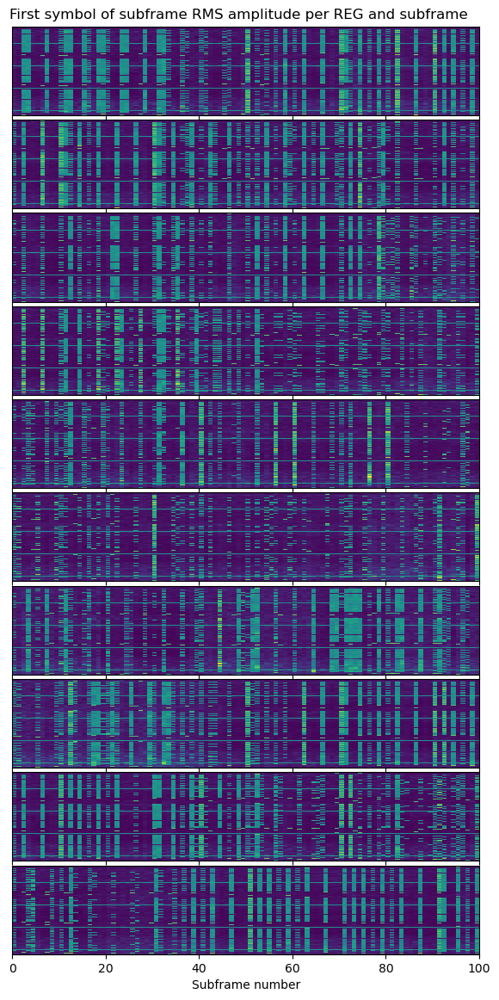

In [46]:
reg_rms = np.sqrt(np.average(np.abs(reg_symbols.reshape(-1, 2 * NRB, 4)**2), axis=-1))

fig, axs = plt.subplots(10, 1, figsize=(7, 14), sharex=True, sharey=True)
for j, ax in enumerate(axs):
    a = reg_rms[100*j:100*(j+1)].T[::-1]
    ax.imshow(a, vmin=0, vmax=2, aspect='auto', interpolation='none',
              extent=[0, a.shape[0], 0, 2*NRB])
    ax.set_xlim((0, 100))
    ax.set_yticks([])
axs[-1].set_xlabel('Subframe number');
fig.subplots_adjust(hspace=0.05)
plt.suptitle('First symbol of subframe RMS amplitude per REG and subframe', y=0.895);

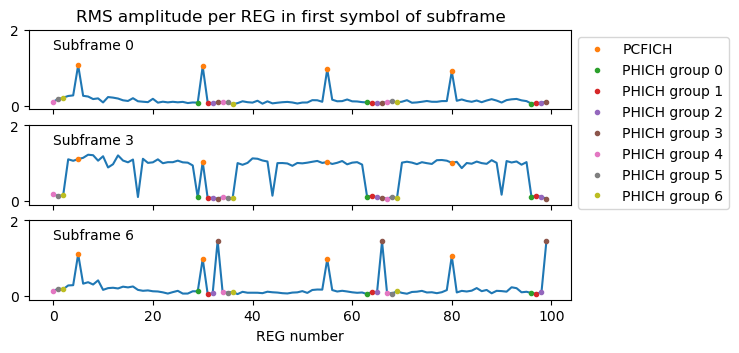

In [47]:
sfidxs = [0, 3, 6]
fig, axs = plt.subplots(len(sfidxs), 1, sharex=True, sharey=True)
for j, sfidx in enumerate(sfidxs):
    axs[j].plot(reg_rms[sfidx]);
    axs[j].plot(pcfich_regs, reg_rms[sfidx][pcfich_regs], '.',
                label='PCFICH')
    for k, phich_r in enumerate(phich_regs):
        axs[j].plot(phich_r, reg_rms[sfidx][phich_r], '.',
                    label=f'PHICH group {k}')
    axs[j].set_ylim((-0.1, 2))
    axs[j].text(0, 1.5, f'Subframe {sfidx}')
axs[0].legend(bbox_to_anchor=(1, 1), loc='upper left')
axs[-1].set_xlabel('REG number')
plt.suptitle('RMS amplitude per REG in first symbol of subframe', y=0.94);

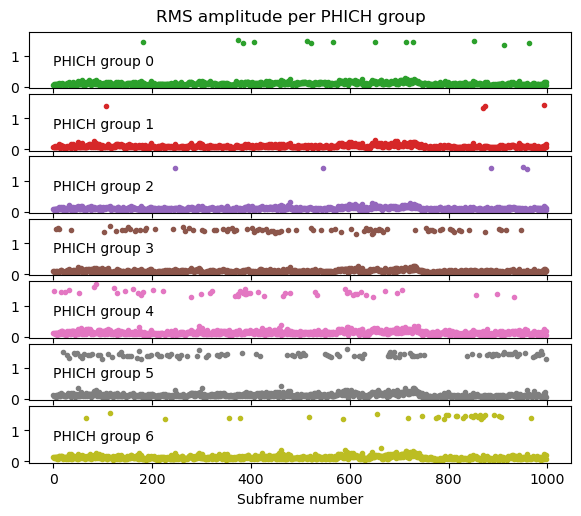

In [48]:
phich_rms = np.sqrt(np.average(reg_rms[:, phich_regs]**2, axis=-1))
fig, axs = plt.subplots(n_phich_groups, 1, sharex=True, sharey=True, figsize=(7, 5.6))
for j in range(n_phich_groups):
    axs[j].plot(phich_rms[:, j], '.', color=f'C{2+j}')
    axs[j].text(0, 0.7, f'PHICH group {j}')
fig.subplots_adjust(hspace=0.1)
axs[-1].set_xlabel('Subframe number')
plt.suptitle('RMS amplitude per PHICH group', y=0.92);

In [49]:
phich_active = phich_rms >= 0.7
np.sum(phich_active, axis=0) # number of PHICH transmissions per group

array([ 13,   4,   5,  87,  52, 114,  31])

In [50]:
W = np.array([[1, 1, 1, 1],
              [1, -1, 1, -1],
              [1, 1, -1, -1],
              [1, -1, -1, 1]]).T

phich_despread = np.empty((reg_rms.shape[0], n_phich_groups,  4), 'complex')
for sfidx, symidx in enumerate(reg_nsymbols):
    ns = (symidx // 7 + ns0) % 20
    scramble = c_seq((ns//2 + 1) * (2 * pci + 1) * 2**9 + pci, 12)
    scramble = 1 - 2 * scramble.astype('float')
    
    z = reg_symbols[sfidx].reshape(-1, 4)[phich_regs]
    z = (z.reshape(-1, 12) * scramble).reshape(-1, 3, 4)
    w = 0.25 * np.einsum('ij,kli->klj', W, z)
    phich_despread[sfidx] = np.average(w, axis=1)

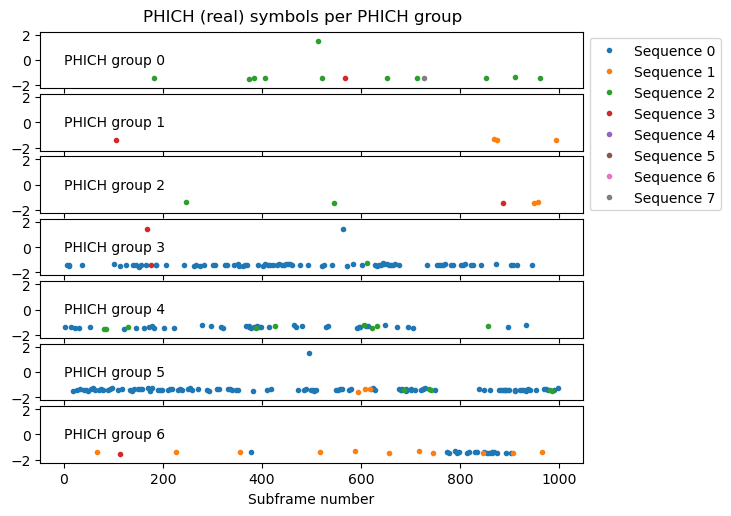

In [51]:
metric = np.real(phich_despread * np.exp(-1j*np.pi/4))
metric_imag = np.imag(phich_despread * np.exp(-1j*np.pi/4))
metric[np.abs(metric) < 0.5] = np.nan
metric_imag[np.abs(metric_imag) < 0.5] = np.nan
fig, axs = plt.subplots(n_phich_groups, 1, sharex=True, sharey=True, figsize=(7, 5.6))
for j in range(n_phich_groups):
    axs[j].plot(metric[:, j], '.')
    axs[j].plot(metric_imag[:, j], '.')
    axs[j].text(0, 0, f'PHICH group {j}',
                verticalalignment='center')
    axs[j].set_ylim((-2.25, 2.25))
fig.subplots_adjust(hspace=0.1)
axs[-1].set_xlabel('Subframe number')
axs[0].legend([f'Sequence {j}' for j in range(8)],
              bbox_to_anchor=(1, 1), loc='upper left')
plt.suptitle('PHICH (real) symbols per PHICH group', y=0.92);

In [52]:
np.sum(~np.isnan(metric) & (metric < 0), axis=0)

array([[  0,   0,  10,   1],
       [  0,   3,   0,   1],
       [  0,   2,   2,   1],
       [ 83,   0,   1,   1],
       [ 43,   0,   9,   0],
       [105,   3,   5,   0],
       [ 19,  11,   0,   1]])

In [53]:
np.sum(~np.isnan(metric) & (metric > 0), axis=0)

array([[0, 0, 1, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [1, 0, 0, 1],
       [0, 0, 0, 0],
       [1, 0, 0, 0],
       [0, 0, 0, 0]])

In [54]:
np.sum(~np.isnan(metric_imag) & (metric_imag < 0), axis=0)

array([[0, 0, 0, 1],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0]])

In [55]:
np.sum(~np.isnan(metric_imag) & (metric_imag > 0), axis=0)

array([[0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0]])

In [56]:
np.where(~np.isnan(metric_imag))[0]

array([727])

In [57]:
# Positions where two sequence numbers are used in the same group
np.where(np.sum((~np.isnan(metric)).astype('int')
                + (~np.isnan(metric_imag)).astype('int'), axis=-1)  > 1)

(array([], dtype=int64), array([], dtype=int64))

In [58]:
# Subframes where two groups are used at the same time
coincident_groups = np.where(np.sum((~np.isnan(metric)).astype('int')
                + (~np.isnan(metric_imag)).astype('int'), axis=(-1, -2))  > 1)[0]
coincident_groups

array([114, 182, 373, 378, 383, 407, 628, 652, 869, 874, 907, 912])

In [59]:
np.sum(~np.isnan(metric[coincident_groups]), axis=(-1, -2))

array([2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2])

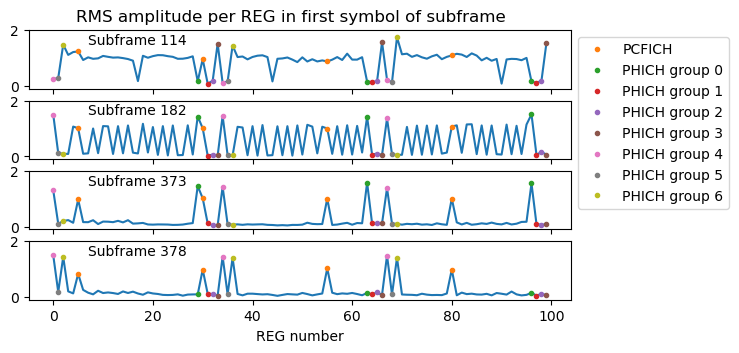

In [60]:
sfidxs = [114, 182, 373, 378]
fig, axs = plt.subplots(len(sfidxs), 1, sharex=True, sharey=True)
for j, sfidx in enumerate(sfidxs):
    axs[j].plot(reg_rms[sfidx]);
    axs[j].plot(pcfich_regs, reg_rms[sfidx][pcfich_regs], '.',
                label='PCFICH')
    for k, phich_r in enumerate(phich_regs):
        axs[j].plot(phich_r, reg_rms[sfidx][phich_r], '.',
                    label=f'PHICH group {k}')
    axs[j].set_ylim((-0.1, 2))
    axs[j].text(7, 1.5, f'Subframe {sfidx}')
axs[0].legend(bbox_to_anchor=(1, 1), loc='upper left')
axs[-1].set_xlabel('REG number')
plt.suptitle('RMS amplitude per REG in first symbol of subframe', y=0.94);

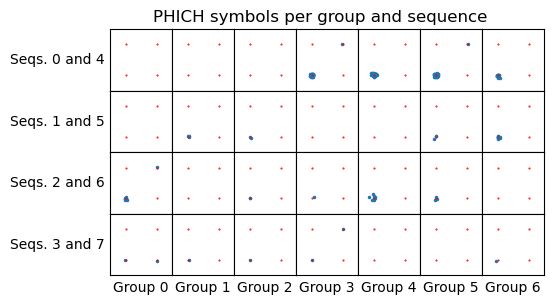

In [61]:
fig, axs = plt.subplots(4, n_phich_groups, figsize=(5.6, 5.6*4/n_phich_groups),
                        facecolor='w', sharex=True, sharey=True)
for j in range(4):
    for k in range(n_phich_groups):
        ax = axs[j, k]
        z = phich_despread[:, k, j].copy()
        z[np.abs(z) < 0.5] = np.nan
        ax.plot(z.real, z.imag, '.', markersize=3)
        ax.plot(np.array([1, 1, -1, -1]),
                np.array([1, -1, 1, -1]), '.',
                color='red', markersize=1)
        ax.set_xlim((-2, 2))
        ax.set_ylim((-2, 2))
        ax.set_xticks([])
        ax.set_yticks([])
for j in range(4):
    axs[j, 0].set_ylabel(f'Seqs. {j} and {j+4}', rotation=0,
                         horizontalalignment='right', verticalalignment='center')
for j in range(n_phich_groups):
    axs[-1, j].set_xlabel(f'Group {j}')
fig.subplots_adjust(hspace=0, wspace=0)
fig.suptitle('PHICH symbols per group and sequence', y=0.94);

## PBCH decoding

In [62]:
# Organize PBCH transmissions by subframe/radio frame. Each subframe carriers 240 QPSK symbols.
pbch_sf = np.array([np.concatenate(pbch[j:j+4]) for j in range(0, len(pbch), 4)])
pbch_sf.shape

(100, 240)

In [63]:
# Make a sliding window of 4 consecutive radio frames. Every 4 windows we will be correctly
# aligned to the 40 ms transmission interval for the PBCH.
pbch_windows = np.array([pbch_sf[j:j+4].ravel() for j in range(0, pbch_sf.shape[0] - 3)])
pbch_windows.shape

(97, 960)

In [64]:
# Soft symbol descrambling of the 1920 bits of each MIB sliding window
pbch_softbits = -np.sqrt(2)*np.stack((pbch_windows.real, pbch_windows.imag), axis=-1).reshape(-1, 1920)
scramble = c_seq(pci, 1920)
pbch_descrambled = pbch_softbits * (1 - 2*scramble.astype('float'))

In [65]:
def block_interleaver(x):
    NC = 32
    NR = int(np.ceil(len(x) / NC))
    x = [None] * (NC * NR - len(x)) + x
    # If x has no None's (which happens when 32 divides len(x)), then
    # the transformation to np.array will break tuples as another dimension
    # of the array. We add and remove a None entry just to prevent this.
    x = np.array(x + [None], dtype='object')[:-1].reshape(NR, NC)
    column_permutation = np.array([
        1, 17, 9, 25, 5, 21, 13, 29, 3, 19, 11, 27, 7, 23, 15, 31,
        0, 16, 8, 24, 4, 20, 12, 28, 2, 18, 10, 26, 6, 22, 14, 30,
    ])
    return x[:, column_permutation].T.ravel()

# Calculations for input->output mapping of the rate matching block
# D - number of input bits
# E - number of output bits
def rate_matching(D, E):
    rate_matching_input_idx = [[(j, k) for k in range(D)] for j in range(3)]
    buffer = np.concatenate([block_interleaver(x) for x in rate_matching_input_idx])
    rate_matching_output_idx = []
    k = 0
    for j in range(E):
        while True:
            element = buffer[k % len(buffer)]
            k += 1
            if element is not None:
                rate_matching_output_idx.append(element)
                break
    return rate_matching_input_idx, rate_matching_output_idx

# Collect soft symbols according to rate matching (soft combining)
def rate_matching_collect(symbols, D):
    rate_matching_input_idx, rate_matching_output_idx = rate_matching(D, symbols.size)
    collect = {b: [] for a in rate_matching_input_idx for b in a}
    for j, bit in enumerate(symbols):
        collect[rate_matching_output_idx[j]].append(bit)
    return collect

def codewords_rate_matching(symbols, D):
    collect = rate_matching_collect(symbols, D)
    rate_matching_input_idx, _ = rate_matching(D, symbols.size)
    codewords = np.array([[np.average(collect[idx]) for idx in r]
                          for r in rate_matching_input_idx])
    # average of an empty list returns nan. replace nan's by
    # zeros
    codewords[np.isnan(codewords)] = 0
    return codewords

In [66]:
rate_matching_collected = [rate_matching_collect(a, 24 + 16) for a in pbch_descrambled]

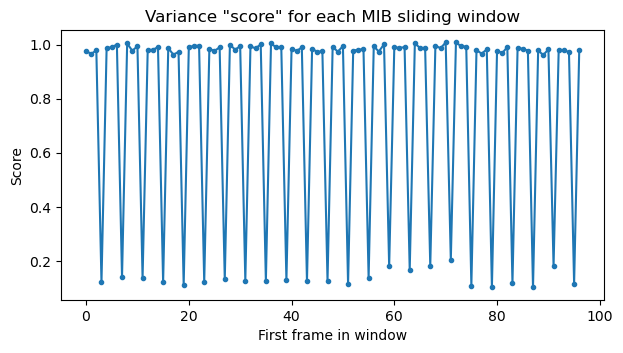

In [67]:
scores = [np.sqrt(np.average([(a - np.average(a))**2 for a in r.values()]))
          for r in rate_matching_collected]
plt.plot(scores, '.-')
plt.title('Variance "score" for each MIB sliding window')
plt.ylabel('Score')
plt.xlabel('First frame in window');

In [68]:
window_offset = 3
pbch_codewords = np.array([codewords_rate_matching(a, 24 + 16)
                           for a in pbch_descrambled[window_offset::4]])

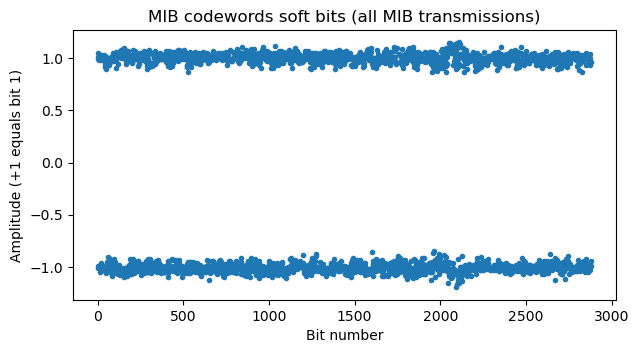

In [69]:
plt.plot(pbch_codewords.ravel(), '.')
plt.title('MIB codewords soft bits (all MIB transmissions)')
plt.xlabel('Bit number')
plt.ylabel('Amplitude (+1 equals bit 1)');

In [70]:
# Viterbi algorithm
def viterbi(y, s0=0):
    nu = 6
    # States are encoded a nu-bit numbers, where the new bits are feed into the MSB
    M = np.full(2**nu, np.infty)
    M[s0] = 0
    paths = [[] for _ in range(2**nu)]
    for t in range(y.shape[1]):
        yt = y[:, t]
        M_prev = M
        paths_prev = paths.copy()
        M = np.full(2**nu, np.infty)
        for r in range(2**nu):
            for bit in [0, 1]:
                s = (r >> 1) | (bit << (nu-1))
                d0 = (bit ^ r ^ (r >> 1) ^ (r >> 3) ^ (r >> 4)) & 1
                d1 = (bit ^ r ^ (r >> 3) ^ (r >> 4) ^ (r >> 5)) & 1
                d2 = (bit ^ r ^ (r >> 2) ^ (r >> 4) ^ (r >> 5)) & 1
                d0 = 2*d0 - 1
                d1 = 2*d1 - 1
                d2 = 2*d2 - 1
                Brs = -(d0 * yt[0] + d1 * yt[1] + d2 * yt[2])
                new = M_prev[r] + Brs
                if new < M[s]:
                    M[s] = new
                    paths[s] = paths_prev[r] + [bit]
    return M[s0], paths[s0]

def viterbi_tailbiting(y):
    viterbi_out = [viterbi(y, s0=s0) for s0 in range(2**6)]
    viterbi_M = [x[0] for x in viterbi_out]
    s0 = np.argmin(viterbi_M)
    return viterbi_out[s0][1]

In [71]:
def convencoder(u):
    s = u[-6] | (u[-5] << 1) | (u[-4] << 2) | (u[-3] << 3) | (u[-2] << 4) | (u[-1] << 5)
    d0 = []
    d1 = []
    d2 = []
    for b in u:
        d0.append((b ^ s ^ (s >> 1) ^ (s >> 3) ^ (s >> 4)) & 1)
        d1.append((b ^ s ^ (s >> 3) ^ (s >> 4) ^ (s >> 5)) & 1)
        d2.append((b ^ s ^ (s >> 2) ^ (s >> 4) ^ (s >> 5)) & 1)
        s = (s >> 1) | (b << 5)
    return [d0, d1, d2]

In [72]:
# Check that the viterbi decoder is working. We re-encode the decode of the
# first PBCH codeword.

codeword = pbch_codewords[0]
decoded = viterbi_tailbiting(codeword)
assert np.all(codeword * (2 * np.array(convencoder(decoded)) - 1) > 0)

In [73]:
pbch_decode = np.array([viterbi_tailbiting(c) for c in pbch_codewords])

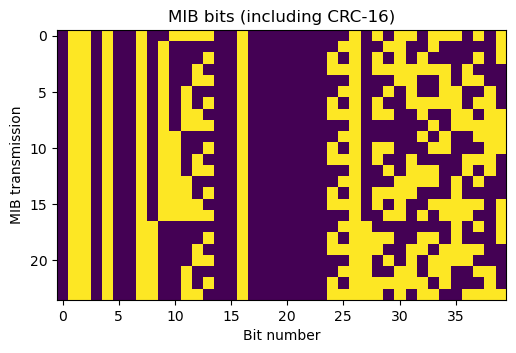

In [74]:
plt.imshow(pbch_decode)
plt.ylabel('MIB transmission')
plt.xlabel('Bit number')
plt.title('MIB bits (including CRC-16)');

In [75]:
crc_table = [0x0000, 0x1021, 0x2042, 0x3063, 0x4084, 0x50a5, 0x60c6, 0x70e7,
    0x8108, 0x9129, 0xa14a, 0xb16b, 0xc18c, 0xd1ad, 0xe1ce, 0xf1ef,
    0x1231, 0x0210, 0x3273, 0x2252, 0x52b5, 0x4294, 0x72f7, 0x62d6,
    0x9339, 0x8318, 0xb37b, 0xa35a, 0xd3bd, 0xc39c, 0xf3ff, 0xe3de,
    0x2462, 0x3443, 0x0420, 0x1401, 0x64e6, 0x74c7, 0x44a4, 0x5485,
    0xa56a, 0xb54b, 0x8528, 0x9509, 0xe5ee, 0xf5cf, 0xc5ac, 0xd58d,
    0x3653, 0x2672, 0x1611, 0x0630, 0x76d7, 0x66f6, 0x5695, 0x46b4,
    0xb75b, 0xa77a, 0x9719, 0x8738, 0xf7df, 0xe7fe, 0xd79d, 0xc7bc,
    0x48c4, 0x58e5, 0x6886, 0x78a7, 0x0840, 0x1861, 0x2802, 0x3823,
    0xc9cc, 0xd9ed, 0xe98e, 0xf9af, 0x8948, 0x9969, 0xa90a, 0xb92b,
    0x5af5, 0x4ad4, 0x7ab7, 0x6a96, 0x1a71, 0x0a50, 0x3a33, 0x2a12,
    0xdbfd, 0xcbdc, 0xfbbf, 0xeb9e, 0x9b79, 0x8b58, 0xbb3b, 0xab1a,
    0x6ca6, 0x7c87, 0x4ce4, 0x5cc5, 0x2c22, 0x3c03, 0x0c60, 0x1c41,
    0xedae, 0xfd8f, 0xcdec, 0xddcd, 0xad2a, 0xbd0b, 0x8d68, 0x9d49,
    0x7e97, 0x6eb6, 0x5ed5, 0x4ef4, 0x3e13, 0x2e32, 0x1e51, 0x0e70,
    0xff9f, 0xefbe, 0xdfdd, 0xcffc, 0xbf1b, 0xaf3a, 0x9f59, 0x8f78,
    0x9188, 0x81a9, 0xb1ca, 0xa1eb, 0xd10c, 0xc12d, 0xf14e, 0xe16f,
    0x1080, 0x00a1, 0x30c2, 0x20e3, 0x5004, 0x4025, 0x7046, 0x6067,
    0x83b9, 0x9398, 0xa3fb, 0xb3da, 0xc33d, 0xd31c, 0xe37f, 0xf35e,
    0x02b1, 0x1290, 0x22f3, 0x32d2, 0x4235, 0x5214, 0x6277, 0x7256,
    0xb5ea, 0xa5cb, 0x95a8, 0x8589, 0xf56e, 0xe54f, 0xd52c, 0xc50d,
    0x34e2, 0x24c3, 0x14a0, 0x0481, 0x7466, 0x6447, 0x5424, 0x4405,
    0xa7db, 0xb7fa, 0x8799, 0x97b8, 0xe75f, 0xf77e, 0xc71d, 0xd73c,
    0x26d3, 0x36f2, 0x0691, 0x16b0, 0x6657, 0x7676, 0x4615, 0x5634,
    0xd94c, 0xc96d, 0xf90e, 0xe92f, 0x99c8, 0x89e9, 0xb98a, 0xa9ab,
    0x5844, 0x4865, 0x7806, 0x6827, 0x18c0, 0x08e1, 0x3882, 0x28a3,
    0xcb7d, 0xdb5c, 0xeb3f, 0xfb1e, 0x8bf9, 0x9bd8, 0xabbb, 0xbb9a,
    0x4a75, 0x5a54, 0x6a37, 0x7a16, 0x0af1, 0x1ad0, 0x2ab3, 0x3a92,
    0xfd2e, 0xed0f, 0xdd6c, 0xcd4d, 0xbdaa, 0xad8b, 0x9de8, 0x8dc9,
    0x7c26, 0x6c07, 0x5c64, 0x4c45, 0x3ca2, 0x2c83, 0x1ce0, 0x0cc1,
    0xef1f, 0xff3e, 0xcf5d, 0xdf7c, 0xaf9b, 0xbfba, 0x8fd9, 0x9ff8,
    0x6e17, 0x7e36, 0x4e55, 0x5e74, 0x2e93, 0x3eb2, 0x0ed1, 0x1ef0]

def crc16_ccitt_zero(data):
    crc = 0
    for d in data:
        tbl_idx = ((crc >> 8) ^ d) & 0xff
        crc = (crc_table[tbl_idx] ^ (crc << 8)) & 0xffff
    return crc & 0xffff

In [76]:
mask = np.array([0, 0, 0, 0xff, 0xff])  # CRC mask for 2 antenna ports
crc_ok = [crc16_ccitt_zero(np.packbits(dec) ^ mask) == 0 for dec in pbch_decode]
np.all(crc_ok)

True

In [77]:
# ASN1 file downloaded from
# https://gitlab.eurecom.fr/oai/openairinterface5g/-/blob/master/openair2/RRC/LTE/MESSAGES/ASN.1/lte-rrc-15.6.0.asn1
asn1_file = 'lte-rrc-15.6.0.asn1'
asn1 = asn1tools.compile_files(asn1_file, 'uper')

In [78]:
pbch_data = [asn1.decode('MasterInformationBlock', bytes(np.packbits(dec[:24])))
             for dec in pbch_decode]

In [79]:
sfn = np.array([list(d['systemFrameNumber'][0])[0] for d in pbch_data])
sfn

array([ 79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,
        92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102])

In [80]:
pbch_data[0]

{'dl-Bandwidth': 'n50',
 'phich-Config': {'phich-Duration': 'normal', 'phich-Resource': 'one'},
 'systemFrameNumber': (b'O', 8),
 'schedulingInfoSIB1-BR-r13': 4,
 'systemInfoUnchanged-BR-r15': False,
 'spare': (b'\x00', 4)}

In [81]:
# Format as UDP frame for wireshark
def mac_pdu_to_udp(subframe, mac_pdu, rnti):
    udp_mac_pdu = b'mac-lte'
    radio_type = 1  # FDD
    direction = 1  # downlink
    if rnti == None:
        rnti_type = 0  # PBCH (NO_RNTI)
    elif rnti == 0xffff:
        rnti_type = 4  # SI-RNTI
    elif rnti == 0xfffe:
        rnti_type = 1  # P-RNTI
    else:
        rnti_type = 3  # C-RNTI
    # The -1 is because subframe=0 corresponds
    # to the subframe imediately before of the first
    # PBCH.
    s = subframe + sfn[0] * 40 - 1 - window_offset * 10
    s = (((s // 10) << 4) | (s % 10)) & 0xffff
    payload_tag = 0x1    
    rnti_tag = 0x2
    ueid_tag = 0x3
    subframe_tag = 0x4
    udp_mac_pdu += bytes([radio_type, direction, rnti_type])
    if rnti is not None:
        udp_mac_pdu += bytes([rnti_tag, rnti >> 8, rnti & 0xff])
    if rnti_type == 3:
        # use C-RNTI as UE ID, since we don't have anything better
        udp_mac_pdu += bytes([ueid_tag, rnti >> 8, rnti & 0xff])
    udp_mac_pdu += bytes([subframe_tag, s >> 8, s & 0xff, payload_tag])
    udp_mac_pdu += mac_pdu
    return udp_mac_pdu

wireshark_udp_packets = []

def store_mac_pdu(subframe, mac_pdu, rnti):
    packet = IP(src='127.0.0.1', dst='127.0.0.1') / UDP(sport=9999, dport=9999) / mac_pdu_to_udp(subframe, mac_pdu, rnti)
    packet.time = (symbol_times[symidx0 + subframe * 14] - np.datetime64('1970-01-01T00:00:00')) / np.timedelta64(1, 's')
    wireshark_udp_packets.append(packet)

In [82]:
for j in range(pbch_decode.shape[0]):
    store_mac_pdu(1 + 10 * window_offset + 40 * j, bytes(np.packbits(pbch_decode[j])), None)

## PDCCH

PDCCH REG configuration for CFI = 1.

In [83]:
pdcch_regs = np.array([j for j in range(2*NRB)
                       if j not in np.concatenate((phich_regs.ravel(), pcfich_regs))])
pdcch_regs

array([ 3,  4,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20,
       21, 22, 23, 24, 25, 26, 27, 28, 37, 38, 39, 40, 41, 42, 43, 44, 45,
       46, 47, 48, 49, 50, 51, 52, 53, 54, 56, 57, 58, 59, 60, 61, 62, 70,
       71, 72, 73, 74, 75, 76, 77, 78, 79, 81, 82, 83, 84, 85, 86, 87, 88,
       89, 90, 91, 92, 93, 94, 95])

In [84]:
pdcch_regs_shifted = np.roll(pdcch_regs, pci)
pdcch_regs_shifted

array([91, 92, 93, 94, 95,  3,  4,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15,
       16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 37, 38, 39, 40,
       41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 56, 57, 58,
       59, 60, 61, 62, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 81, 82, 83,
       84, 85, 86, 87, 88, 89, 90])

In [85]:
pdcch_reg_interleaving = [a for a in block_interleaver([a for a in range(pdcch_regs.size)])
     if a is not None]
pdcch_reg_interleaving_inv = np.array(
    [pdcch_reg_interleaving.index(j) for j in range(pdcch_regs.size)])
pdcch_reg_interleaving_inv

array([11, 67, 30, 44,  6, 62, 25, 53, 16, 72, 35, 38,  0, 56, 19, 47,  9,
       65, 28, 42,  4, 60, 23, 51, 14, 70, 33, 40,  2, 58, 21, 49, 12, 68,
       31, 45,  7, 63, 26, 54, 17, 73, 36, 39,  1, 57, 20, 48, 10, 66, 29,
       43,  5, 61, 24, 52, 15, 71, 34, 41,  3, 59, 22, 50, 13, 69, 32, 46,
        8, 64, 27, 55, 18, 74, 37])

In [86]:
pdcch_sorted = reg_symbols.reshape(-1, 2*NRB, 4)[:, pdcch_regs_shifted[pdcch_reg_interleaving_inv]]

PDCCH REG configuration for CFI = 2.

In [87]:
# First subcarrier for each of the PDCCH regs of the 1st symbol
regs_1st_symbol_subc = pdcch_regs * 6 + (1 if pci % 3 == 0 else 0)
regs_1st_symbol_subc

array([ 18,  24,  36,  42,  48,  54,  60,  66,  72,  78,  84,  90,  96,
       102, 108, 114, 120, 126, 132, 138, 144, 150, 156, 162, 168, 222,
       228, 234, 240, 246, 252, 258, 264, 270, 276, 282, 288, 294, 300,
       306, 312, 318, 324, 336, 342, 348, 354, 360, 366, 372, 420, 426,
       432, 438, 444, 450, 456, 462, 468, 474, 486, 492, 498, 504, 510,
       516, 522, 528, 534, 540, 546, 552, 558, 564, 570])

In [88]:
# First subcarrier for each of the PDCCH regs of the 2nd symbol
# (only valid for 2 CRS ports)
regs_2nd_symbol_subc = np.arange(NRB * 3) * 4
regs_2nd_symbol_subc

array([  0,   4,   8,  12,  16,  20,  24,  28,  32,  36,  40,  44,  48,
        52,  56,  60,  64,  68,  72,  76,  80,  84,  88,  92,  96, 100,
       104, 108, 112, 116, 120, 124, 128, 132, 136, 140, 144, 148, 152,
       156, 160, 164, 168, 172, 176, 180, 184, 188, 192, 196, 200, 204,
       208, 212, 216, 220, 224, 228, 232, 236, 240, 244, 248, 252, 256,
       260, 264, 268, 272, 276, 280, 284, 288, 292, 296, 300, 304, 308,
       312, 316, 320, 324, 328, 332, 336, 340, 344, 348, 352, 356, 360,
       364, 368, 372, 376, 380, 384, 388, 392, 396, 400, 404, 408, 412,
       416, 420, 424, 428, 432, 436, 440, 444, 448, 452, 456, 460, 464,
       468, 472, 476, 480, 484, 488, 492, 496, 500, 504, 508, 512, 516,
       520, 524, 528, 532, 536, 540, 544, 548, 552, 556, 560, 564, 568,
       572, 576, 580, 584, 588, 592, 596])

In [89]:
# (symbol, REG index) pairs ordered by PDCCH REG number
cfi2_regs = (
    [(0, j, k) for j, k in zip(pdcch_regs, regs_1st_symbol_subc)]
    + [(1, j, k) for j, k in enumerate(regs_2nd_symbol_subc)])
cfi2_regs = [a[:2] for a in sorted(cfi2_regs, key=lambda x: (x[2], x[0]))]
len(cfi2_regs)

225

In [90]:
cfi2_regs_shifted = np.roll(cfi2_regs, pci, axis=0)
cfi2_reg_interleaving = [a for a in block_interleaver([a for a in range(len(cfi2_regs))])
     if a is not None]
cfi2_reg_interleaving_inv = np.array(
    [cfi2_reg_interleaving.index(j) for j in range(len(cfi2_regs))])
cfi2_permutation = cfi2_regs_shifted[cfi2_reg_interleaving_inv]

In [91]:
reg_symbols_sym2 = np.empty((reg_nsymbols.size, 4 * 3 * NRB), 'complex')
for j, symidx in enumerate(reg_nsymbols + 1):
    r0, r1 = channel(symidx)
    reg_symbols_sym2[j] = diversity(symbols[symidx, no_dc], r0[no_dc], r1[no_dc])

In [92]:
pdcch_sorted_cfi2 = np.empty((reg_nsymbols.size, len(cfi2_regs), 4), 'complex')
symbol0_sel = cfi2_permutation[:, 0] == 0
pdcch_sorted_cfi2[:, symbol0_sel] = reg_symbols.reshape(-1, 2*NRB, 4)[:, cfi2_permutation[symbol0_sel, 1]]
pdcch_sorted_cfi2[:, ~symbol0_sel] = reg_symbols_sym2.reshape(-1, 3*NRB, 4)[:, cfi2_permutation[~symbol0_sel, 1]]

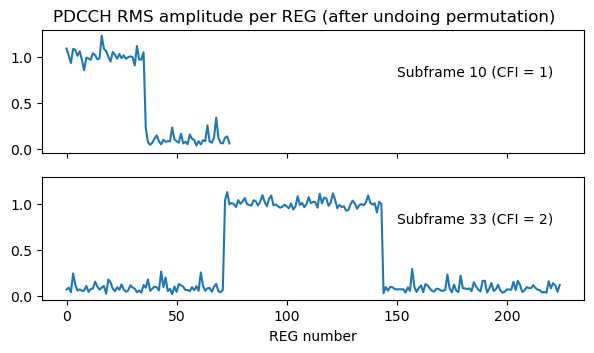

In [93]:
fig, axs = plt.subplots(2, 1, sharex=True, sharey=True)
axs[0].plot(np.sqrt(np.average(np.abs(pdcch_sorted[10])**2, axis=-1)))
axs[0].text(150, 0.8, 'Subframe 10 (CFI = 1)')
axs[1].plot(np.sqrt(np.average(np.abs(pdcch_sorted_cfi2[33])**2, axis=-1)))
axs[1].text(150, 0.8, 'Subframe 33 (CFI = 2)')
axs[1].set_xlabel('REG number')
plt.suptitle('PDCCH RMS amplitude per REG (after undoing permutation)', y=0.94);

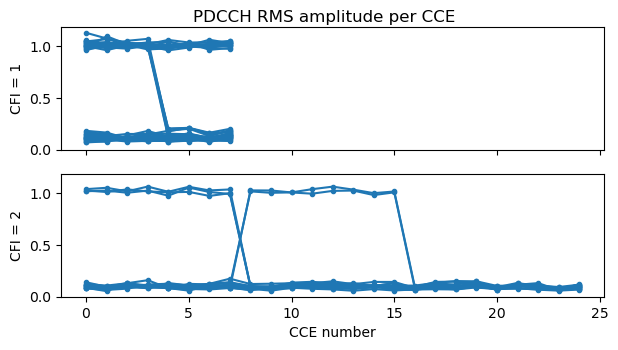

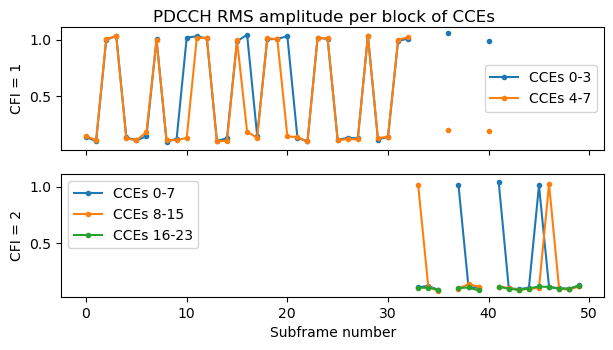

In [94]:
ncces = pdcch_sorted.shape[1] // 9
ncces_cfi2 = pdcch_sorted_cfi2.shape[1] // 9
cce_rms = np.sqrt(np.average(np.abs(
    pdcch_sorted[:, :9*ncces].reshape(-1, ncces, 36))**2,
    axis=-1))
cce_rms_cfi2 = np.sqrt(np.average(np.abs(
    pdcch_sorted_cfi2[:, :9*ncces_cfi2].reshape(-1, ncces_cfi2, 36))**2,
    axis=-1))

def plot_cce_amplitudes(time_sel):
    fig, axs = plt.subplots(2, 1, sharex=True, sharey=True)
    y = cce_rms[time_sel].copy()
    y[pcfich_values[time_sel] != 1] = np.nan
    axs[0].plot(y.T, '.-', color='C0')
    axs[0].set_ylabel('CFI = 1')
    y = cce_rms_cfi2[time_sel].copy()
    y[pcfich_values[time_sel] != 2] = np.nan
    axs[1].plot(y.T, '.-', color='C0')
    axs[1].set_xlabel('CCE number')
    axs[1].set_ylabel('CFI = 2')
    plt.suptitle('PDCCH RMS amplitude per CCE', y=0.93);

    fig, axs = plt.subplots(2, 1, sharex=True, sharey=True)
    sfnum = np.arange(cce_rms.size)[time_sel]
    y = cce_rms[time_sel].copy()
    y[pcfich_values[time_sel] != 1] = np.nan
    y = np.sqrt(np.average(y.reshape(y.shape[0], -1, 4)**2, axis=-1))
    axs[0].plot(sfnum, y, '.-')
    axs[0].legend(['CCEs 0-3', 'CCEs 4-7'])
    axs[0].set_ylabel('CFI = 1')
    y = cce_rms_cfi2[time_sel].copy()
    y[pcfich_values[time_sel] != 2] = np.nan
    y = np.sqrt(np.average(y[:, :24].reshape(y.shape[0], -1, 8)**2, axis=-1))
    axs[1].plot(sfnum, y, '.-')
    axs[1].legend(['CCEs 0-7', 'CCEs 8-15', 'CCEs 16-23'])
    axs[1].set_xlabel('Subframe number')
    axs[1].set_ylabel('CFI = 2')
    plt.suptitle('PDCCH RMS amplitude per block of CCEs', y=0.93)

plot_cce_amplitudes(slice(0, 50))

In [95]:
pdcch_descrambled = np.empty((pdcch_sorted.shape[0], 2 * 4 * 9 * ncces))
pdcch_descrambled_cfi2 = np.empty((pdcch_sorted_cfi2.shape[0], 2 * 4 * 9 * ncces_cfi2))
for j in range(pdcch_sorted.shape[0]):
    pdcch_transmission = pdcch_sorted[j, :9*ncces].ravel()
    pdcch_transmission_cfi2 = pdcch_sorted_cfi2[j, :9*ncces_cfi2].ravel()
    symidx = reg_nsymbols[j]
    ns = (symidx // 7 + ns0) % 20
    softbits = -np.sqrt(2) * np.stack((pdcch_transmission.real, pdcch_transmission.imag), axis=-1).ravel()
    softbits_cfi2 = -np.sqrt(2) * np.stack((pdcch_transmission_cfi2.real,
                                            pdcch_transmission_cfi2.imag), axis=-1).ravel()
    scramble = c_seq((ns // 2) * 2**9 + pci, softbits_cfi2.size)
    pdcch_descrambled[j] = softbits * (1 - 2*scramble[:softbits.size].astype('float'))
    pdcch_descrambled_cfi2[j] = softbits_cfi2 * (1 - 2*scramble.astype('float'))

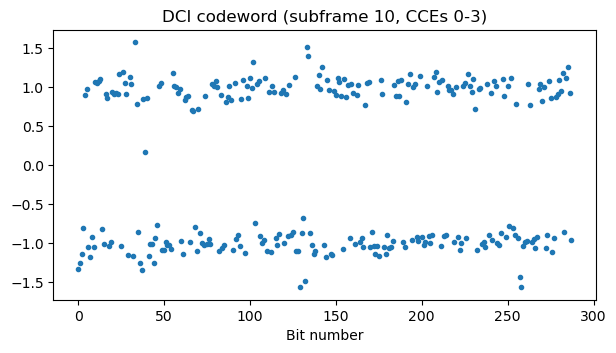

In [96]:
bits_per_cce = 2 * 4 * 9
plt.plot(pdcch_descrambled[10, :4 * bits_per_cce], '.')
plt.title('DCI codeword (subframe 10, CCEs 0-3)')
plt.xlabel('Bit number');

In [97]:
def compute_scores(symbols, max_input_bits=128):
    input_bits = np.arange(16, max_input_bits)
    scores = np.empty(input_bits.size)
    for j, nbits in enumerate(input_bits):
        collect = rate_matching_collect(symbols, nbits)
        score = np.max([np.max(a) - np.min(a) if len(a) != 0 else 0 for a in collect.values()])
        scores[j] = score
    return input_bits, scores

Text(0, 0.5, 'Score')

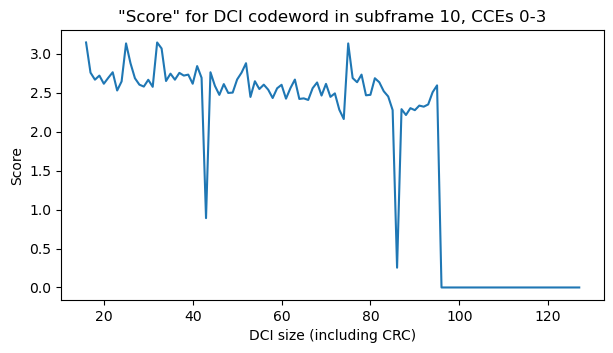

In [98]:
plt.plot(*compute_scores(pdcch_descrambled[10, :4 * bits_per_cce]))
plt.title('"Score" for DCI codeword in subframe 10, CCEs 0-3')
plt.xlabel('DCI size (including CRC)')
plt.ylabel('Score')

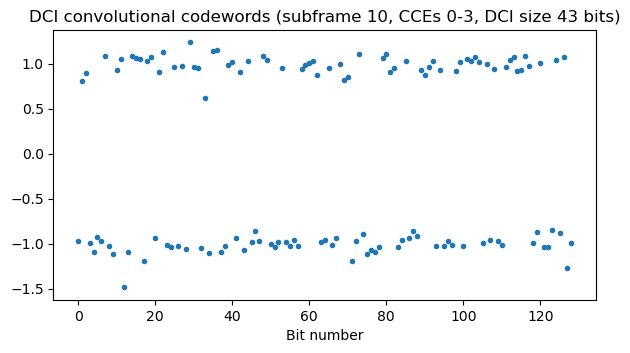

In [99]:
codewords = codewords_rate_matching(pdcch_descrambled[10, :4 * bits_per_cce], 43)

plt.plot(codewords.ravel(), '.')
plt.title('DCI convolutional codewords (subframe 10, CCEs 0-3, DCI size 43 bits)')
plt.xlabel('Bit number');

In [100]:
decoded = viterbi_tailbiting(codewords)
decoded_packed = np.packbits([0] * (8 - (len(decoded) % 8)) + decoded)
crc16_calc = crc16_ccitt_zero(decoded_packed[:-2])
crc16_recv = (decoded_packed[-2].astype('int') << 8) | decoded_packed[-1].astype('int')
crc16_mask = crc16_calc ^ crc16_recv
hex(crc16_mask)

'0xfffe'

In [101]:
bytes(np.packbits(decoded[:-16])).hex()

'86408040'

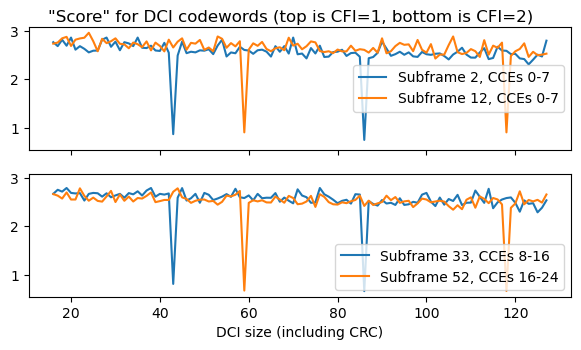

In [102]:
fig, axs = plt.subplots(2, 1, sharex=True, sharey=True)
axs[0].plot(*compute_scores(pdcch_descrambled[2, :8 * bits_per_cce]),
            label='Subframe 2, CCEs 0-7')
axs[0].plot(*compute_scores(pdcch_descrambled[12, :8 * bits_per_cce]),
            label='Subframe 12, CCEs 0-7')
axs[1].plot(*compute_scores(pdcch_descrambled_cfi2[33, 8*bits_per_cce:16*bits_per_cce]),
            label='Subframe 33, CCEs 8-16')
axs[1].plot(*compute_scores(pdcch_descrambled_cfi2[52, 16*bits_per_cce:24*bits_per_cce]),
            label='Subframe 52, CCEs 16-24')
axs[0].legend()
axs[1].legend()
axs[1].set_xlabel('DCI size (including CRC)')
plt.suptitle('"Score" for DCI codewords (top is CFI=1, bottom is CFI=2)', y=0.93);

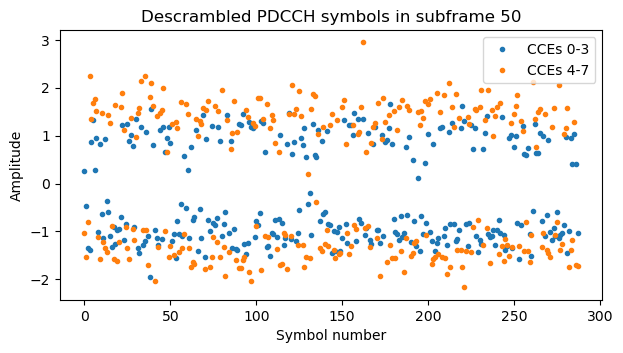

In [103]:
plt.plot(pdcch_descrambled[50, 0*bits_per_cce:4*bits_per_cce], '.', label='CCEs 0-3')
plt.plot(pdcch_descrambled[50, 4*bits_per_cce:8*bits_per_cce], '.', label='CCEs 4-7')
plt.legend()
plt.ylabel('Amplitude')
plt.xlabel('Symbol number')
plt.title('Descrambled PDCCH symbols in subframe 50');

In [104]:
dci_parameters = [(2, 8, 43), (3, 8, 43), (7, 8, 43), (10, 4, 43), (11, 8, 43), (12, 8, 59),
                  (15, 8, 43), (16, 4, 43), (18, 8, 59), (19, 8, 43), (20, 4, 43),
                  (23, 8, 43), (24, 8, 43), (28, 8, 43), (31, 8, 59), (32, 8, 59),
                  (33, (8, 16), 43), (36, 4, 43), (37, 8, 43), (40, 4, 43),
                  (41, 8, 43), (45, 8, 43), (46, (8, 16), 43),
                  (50, 4, 43), (50, (4, 8), 43),
                  (52, (16, 24), 59), (54, (8, 16), 43), (56, 4, 43), (58, 8, 43),
                  (60, 4, 43), (62, 8, 43), (66, 8, 43),
                  (70, 4, 43), (70, (4, 8), 43), (71, 8, 59), (72, 4, 43),
                  (74, 8, 43), (76, 4, 43), (78, 8, 43),
                  (80, 4, 43), (82, 4, 43), (82, (4, 8), 43), (86, 8, 43),
                  (90, 4, 43), (90, (4, 8), 43), (92, 8, 59), (94, 8, 43), (96, 4, 43), (98, 8, 43),
                  (100, 4, 43), (102, 8, 43), (106, 4, 43), (106, (4, 8), 43),
                  (110, 4, 43), (110, (4, 8), 43), (111, 8, 59), (112, 4, 43), (114, 8, 43), (116, 4, 43), (118, 8, 43),
                  (122, 4, 43), (122, (4, 8), 43), (126, 8, 43),
                  (130, 4, 43), (130, (4, 8), 59), (131, 8, 59), (132, (4, 8), 43),
                  (134, 8, 43), (136, 4, 43), (137, (4, 8), 43), (138, 8, 43),
                  (140, 4, 43), (142, 8, 43), (143, 4, 43), (146, 8, 43), (148, (4, 8), 43),
                  (150, 4, 43), (150, (16, 24), 43), (152, 4, 43), (152, (16, 24), 59), (154, 8, 43),
                  (156, 4, 43), (158, 8, 43), (159, 4, 43),
                  (160, 4, 43), (162, 8, 43), (164, 4, 43), (166, 8, 43), (169, 4, 43),
                  (170, 4, 43), (170, (16, 24), 43), (172, 8, 59), (174, 4, 43), (174, (4, 8), 43),
                  (176, 4, 43), (178, (4, 8), 43), (179, 8, 43),
                  (180, 4, 43), (182, 4, 43), (186, 4, 43),
                  (190, 4, 43), (190, (20, 24), 43), (192, 8, 59), (194, 4, 43), (196, 4, 43), (198, (4, 8), 43),
                  (202, 4, 43), (206, 4, 43),
                  (210, 4, 43), (210, (20, 24), 43), (212, 8, 59), (214, 4, 43), (216, 4, 43), (218, (4, 8), 43),
                  (221, 8, 59), (222, 4, 43), (222, (4, 8), 59), (226, 4, 43),
                  (230, (4, 8), 43), (231, 8, 59), (232, 4, 43), (234, 4, 43), (235, 8, 59), (236, 4, 43), (238, (4, 8), 43),
                  (240, 4, 43), (242, 4, 43), (242, (8, 12), 43), (246, 4, 43),
                  (250, 4, 43), (250, (20, 24), 43), (252, 8, 59), (254, 4, 43), (256, 4, 43), (258, 8, 43),
                  (260, 4, 43), (262, 8, 43), (266, 8, 43),
                  (270, 4, 43), (270, (16, 24), 43), (272, 8, 59), (274, 8, 43), (276, 4, 43), (278, 8, 59), (279, (16, 24), 59),
                  (280, 4, 43), (281, 8, 59), (282, (16, 24), 43), (285, (16, 24), 59), (286, (8, 16), 43), (288, (10, 12), 59),
                  (290, 4, 43), (290, (16, 24), 43), (291, 8, 59), (292, (18, 20), 59), (294, (8, 16), 43), (295, (10, 12), 59),
                  (296, 4, 43), (298, (8, 16), 43), (299, (4, 6), 59),
                  (302, (2, 4), 59), (302, (4, 8), 43), (306, (2, 4), 59), (306, (4, 8), 43),                  
                  (310, 4, 43), (310, (16, 24), 43), (311, 8, 59), (314, 8, 43), (316, 4, 43),
                  (318, (2, 4), 59), (318, (4, 8), 43), (319, (4, 6), 59),
                  (320, 4, 43), (322, (2, 4), 59), (322, (4, 8), 43), (323, 8, 43), (325, (2, 4), 59), (327, 4, 43), (327, (4, 6), 59),
                  (330, 4, 43), (330, (20, 22), 59), (331, 8, 43), (332, 8, 59), (333, (6, 8), 59),
                  (335, (2, 4), 59), (335, (4, 8), 43), (336, 4, 43), (336, (18, 20), 59), (338, (2, 4), 59), (339, 8, 43),
                  (340, 4, 43), (341, 2, 59), (343, 4, 43), (344, 4, 43), (346, (4, 8), 43), (348, (4, 8), 43),
                  (350, 4, 43), (352, 8, 59), (353, (16, 20), 43), (356, 4, 43), (357, 4, 43), (359, (8, 12), 59),
                  (360, 4, 43), (360, (12, 16), 43), (361, 4, 43), (365, (12, 16), 43), (365, (16, 20), 43), (366, (16, 20), 43),
                  (370, 4, 43), (370, (12, 16), 43), (370, (20, 24), 43), (371, 8, 59), (374, (8, 16), 43),
                  (375, 8, 43), (375, (12, 16), 43), (376, 4, 43), (379, (8, 16), 43),
                  (380, 4, 43), (380, (12, 16), 43), (383, (8, 16), 43), (385, (12, 16), 43), (387, 8, 43),
                  (391, 8, 59), (391, (8, 16), 43), (392, 4, 43), (395, 8, 43), (396, 4, 43), (399, (8, 12), 43), (399, (16, 24), 43),
                  (400, 4, 43), (402, 4, 43), (403, 4, 43), (404, 2, 43), (407, 4, 43), (409, 4, 43),
                  (410, 4, 43), (411, 4, 43), (412, 8, 59), (415, (4, 8), 43), (416, 4, 43), (419, (4, 8), 43),
                  (420, 4, 43), (423, 4, 43), (427, 4, 43),
                  (430, 4, 43), (431, 8, 59), (432, 4, 43), (432, (8, 12), 43), (436, 4, 43), (436, (4, 8), 43),
                  (440, 4, 43), (440, (4, 8), 43), (442, 4, 43), (444, (8, 16), 43), (447, (4, 6), 59), (448, (8, 16), 43),
                  (452, 8, 43), (452, (16, 24), 59), (456, 4, 43), (456, (4, 8), 43),
                  (460, 4, 43), (460, (4, 8), 43), (464, (8, 16), 43), (468, (8, 16), 43),
                  (470, 4, 43), (472, 8, 43), (472, (16, 24), 59), (476, 4, 43), (476, (4, 8), 43),
                  (480, 4, 43), (480, (4, 8), 43), (484, (8, 16), 43), (488, (14, 16), 43),
                  (492, (16, 18), 43), (493, (8, 10), 59), (496, 4, 43), (497, (4, 6), 43),
                 ]
for subframe_idx, cces, dci_len in dci_parameters:
    if isinstance(cces, int):
        start_cce = 0
        end_cce = cces
    else:
        start_cce = cces[0]
        end_cce = cces[1]
    print(f'Subframe index {subframe_idx}: CFI {pcfich_values[subframe_idx]}, '
          f'CCEs {start_cce}-{end_cce-1}, {dci_len} bit DCI')
    get_symbols = pdcch_descrambled if pcfich_values[subframe_idx] == 1 else pdcch_descrambled_cfi2
    codewords = codewords_rate_matching(
        get_symbols[subframe_idx, start_cce*bits_per_cce:end_cce*bits_per_cce],
        dci_len)
    decoded = viterbi_tailbiting(codewords)
    decoded_packed = np.packbits([0] * (8 - (len(decoded) % 8)) + decoded)
    crc16_calc = crc16_ccitt_zero(decoded_packed[:-2])
    crc16_recv = (decoded_packed[-2].astype('int') << 8) | decoded_packed[-1].astype('int')
    crc16_mask = crc16_calc ^ crc16_recv
    print('CRC-16 mask', hex(crc16_mask))
    print('DCI (hex, without CRC)', bytes(np.packbits(decoded[:-16])).hex())
    print()

Subframe index 2: CFI 1, CCEs 0-7, 43 bit DCI
CRC-16 mask 0xc33c
DCI (hex, without CRC) 04c84800

Subframe index 3: CFI 1, CCEs 0-7, 43 bit DCI
CRC-16 mask 0xc33c
DCI (hex, without CRC) 03384800

Subframe index 7: CFI 1, CCEs 0-7, 43 bit DCI
CRC-16 mask 0xc33c
DCI (hex, without CRC) 04d02800

Subframe index 10: CFI 1, CCEs 0-3, 43 bit DCI
CRC-16 mask 0xfffe
DCI (hex, without CRC) 86408040

Subframe index 11: CFI 1, CCEs 0-7, 43 bit DCI
CRC-16 mask 0xc33c
DCI (hex, without CRC) 03487000

Subframe index 12: CFI 1, CCEs 0-7, 59 bit DCI
CRC-16 mask 0xc33c
DCI (hex, without CRC) 00079e080160

Subframe index 15: CFI 1, CCEs 0-7, 43 bit DCI
CRC-16 mask 0xc33c
DCI (hex, without CRC) 04d00800

Subframe index 16: CFI 1, CCEs 0-3, 43 bit DCI
CRC-16 mask 0xffff
DCI (hex, without CRC) 84b0c240

Subframe index 18: CFI 1, CCEs 0-7, 59 bit DCI
CRC-16 mask 0xced8
DCI (hex, without CRC) 7c07ce101000

Subframe index 19: CFI 1, CCEs 0-7, 43 bit DCI
CRC-16 mask 0xc33c
DCI (hex, without CRC) 01bf6880

Subfr

/usr/lib/python3.11/site-packages/numpy/lib/function_base.py:520: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/usr/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


CRC-16 mask 0xcee3
DCI (hex, without CRC) 00078e708400

Subframe index 290: CFI 2, CCEs 0-3, 43 bit DCI
CRC-16 mask 0xfffe
DCI (hex, without CRC) 83200040

Subframe index 290: CFI 2, CCEs 16-23, 43 bit DCI
CRC-16 mask 0xc33c
DCI (hex, without CRC) 03404800

Subframe index 291: CFI 2, CCEs 0-7, 59 bit DCI
CRC-16 mask 0xc33c
DCI (hex, without CRC) 0007ae080160

Subframe index 292: CFI 2, CCEs 18-19, 59 bit DCI
CRC-16 mask 0xcee3
DCI (hex, without CRC) 00078c708400

Subframe index 294: CFI 2, CCEs 8-15, 43 bit DCI
CRC-16 mask 0xc33c
DCI (hex, without CRC) 04c84800

Subframe index 295: CFI 2, CCEs 10-11, 59 bit DCI
CRC-16 mask 0xcee3
DCI (hex, without CRC) 40060a98ac00

Subframe index 296: CFI 2, CCEs 0-3, 43 bit DCI
CRC-16 mask 0xffff
DCI (hex, without CRC) 84b0c140

Subframe index 298: CFI 2, CCEs 8-15, 43 bit DCI
CRC-16 mask 0xc33c
DCI (hex, without CRC) 04c82800

Subframe index 299: CFI 2, CCEs 4-5, 59 bit DCI
CRC-16 mask 0xcee3
DCI (hex, without CRC) 00078e748000

Subframe index 302: 

## TM4 theory

/tmp/ipykernel_633585/1006485022.py:3: RuntimeWarning: invalid value encountered in divide
  C1 = 4*(1+sigma0**2)*(1+sigma1**2)*sigma0**2*sigma1**2 / (4*sigma0**2*sigma1**2 + sigma0**2 - sigma1**2)


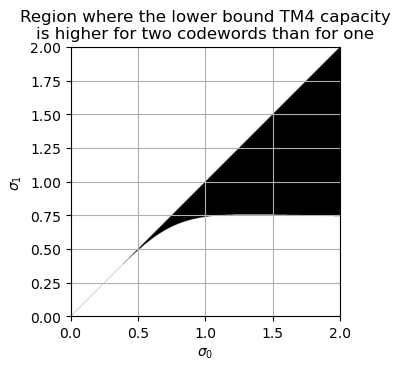

In [105]:
sigma0, sigma1 = np.meshgrid(*(np.linspace(0, 2, 1000) for _ in range(2)))
C0 = 1 + sigma0**2 + sigma1**2
C1 = 4*(1+sigma0**2)*(1+sigma1**2)*sigma0**2*sigma1**2 / (4*sigma0**2*sigma1**2 + sigma0**2 - sigma1**2)
plt.imshow(~((C1 >= C0) & (sigma0 >= sigma1)), extent=(sigma0[0, 0], sigma0[0, -1], sigma1[0, 0], sigma1[-1, 0]),
           origin='lower', cmap='grey')
plt.xlabel('$\\sigma_0$')
plt.ylabel('$\\sigma_1$')
plt.title('Region where the lower bound TM4 capacity\nis higher for two codewords than for one')
plt.grid();

## SIB1

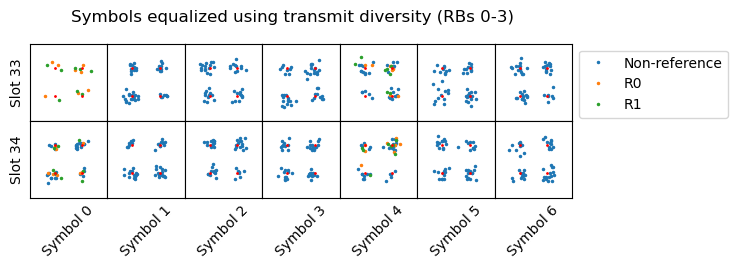

In [106]:
diversity_plot(range(232, 245), slice(0*12, 4*12))

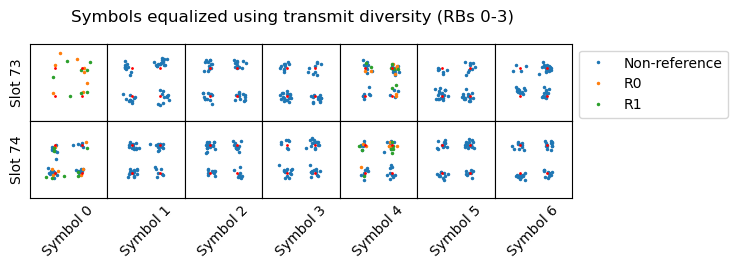

In [107]:
diversity_plot(range(512, 525), slice(0*12, 4*12))

In [108]:
def pdsch_symbols(subframe, rbs, equalization=diversity, do_not_equalize=False, cancel_symbols=None):
    def subc(j):
        s = np.concatenate([[12 * rb + j for j in range(12)] for rb in rbs])
        k = (j - symidx0) % 14
        if ((subframe % 5 == 1 and k in range(5, 7)) # PSS + SSS
            or (subframe % 10 == 1 and k in range(7, 11))):  # PBCH
            # remove subcarriers allocated to PSS, SSS and PBCH
            s = np.array([ss for ss in s if ss not in range(22*12, 28*12)])
        return s

    syms = range(symidx0 + subframe * 14 + pcfich_values[subframe],
                 symidx0 + (subframe + 1) * 14)
    z = np.concatenate([remove_ref_signals(j, symbols[j, no_dc][subc(j)])
                        for j in syms])
    if cancel_symbols is not None:
        z -= cancel_symbols
    r0, r1 = [np.concatenate([remove_ref_signals(j, channel(j)[k][subc(j)])
                              for j in syms])
              for k in range(2)]
    if do_not_equalize:
        return z, r0, r1
    return equalization(z, r0, r1)

def pdsch_descrambled(subframe, rbs, rnti, equalization=diversity, q=0, cancel_symbols=None):
    syms = pdsch_symbols(subframe, rbs, equalization=equalization, cancel_symbols=cancel_symbols)
    softbits = -np.sqrt(2) * syms.astype('complex64').view('float32')
    ns_half = ns_pcfich[subframe] // 2
    scrambling_seq = c_seq(rnti * 2**14 + q * 2**13 + ns_half * 2**9 + pci, softbits.size) 
    return softbits * (1 - 2*scrambling_seq.astype('float'))

In [109]:
sib1_subc = slice(0, 4*12)
sib1_first_subframe = 16
num_sib1 = (symbols.shape[0] - ((sib1_first_subframe + 1) * 14 + symidx0)) // (20 * 14)
sib1_subframes = sib1_first_subframe + 20 * np.arange(num_sib1)
sib1_descrambled = [pdsch_descrambled(k, np.arange(0, 4), 0xffff) for k in sib1_subframes]

In [110]:
def block_interleaver_turbo(x, last_branch=False):
    NC = 32
    NR = (len(x) + NC - 1) // NC
    x = [None] * (NC * NR - len(x)) + x
    # If x has no None's (which happens when 32 divides len(x)), then
    # the transformation to np.array will break tuples as another dimension
    # of the array. We add and remove a None entry just to prevent this.
    x = np.array(x + [None], dtype='object')[:-1].reshape(NR, NC)
    column_permutation = np.array([
        0, 16, 8, 24, 4, 20, 12, 28, 2, 18, 10, 26, 6, 22, 14, 30,
        1, 17, 9, 25, 5, 21, 13, 29, 3, 19, 11, 27, 7, 23, 15, 31
    ])
    if last_branch:
        pi_k = np.array([(column_permutation[k // NR] + NC * (k % NR) + 1) % x.size
                         for k in range(x.size)])
        return x.ravel()[pi_k]
    return x[:, column_permutation].T.ravel()

# Calculations for input->output mapping of the rate matching block for Turbo coding
# D - number of input bits
# E - number of output bits
# rv_idx - redundancy version index
def rate_matching_turbo(D, E, rv_idx):
    rate_matching_input_idx = [[(j, k) for k in range(D)] for j in range(3)]
    interleaved = [block_interleaver_turbo(x, last_branch=j==2)
                   for j, x in enumerate(rate_matching_input_idx)]
    # the following is just used to create an array of the correct size that starts
    # by interleaved[0]
    buffer = np.concatenate(interleaved)
    # interleaved[1] and interleaved[2] must be interleaved into the last 2/3rds of
    # buffer
    buffer[len(interleaved[0]):][::2] = interleaved[1]
    buffer[len(interleaved[0]):][1::2] = interleaved[2]
    rate_matching_output_idx = []
    NR = (D + 31) // 32
    k = NR * (2 * ((len(buffer) + 8 * NR - 1) // (8 * NR)) * rv_idx + 2)
    for j in range(E):
        while True:
            element = buffer[k % len(buffer)]
            k += 1
            if element is not None:
                rate_matching_output_idx.append(element)
                break
    return rate_matching_output_idx

# Collect soft symbols according to rate matching (for soft combining)
def rate_matching_collect_turbo(symbols_and_rv_idxs, D):
    rate_matching_input_idx = [[(j, k) for k in range(D)] for j in range(3)]
    collect = {b: [] for a in rate_matching_input_idx for b in a}
    for symbols, rv_idx in symbols_and_rv_idxs:
        rate_matching_output_idx = rate_matching_turbo(D, symbols.size, rv_idx)
        for j, bit in enumerate(symbols):
            collect[rate_matching_output_idx[j]].append(bit)
    return collect

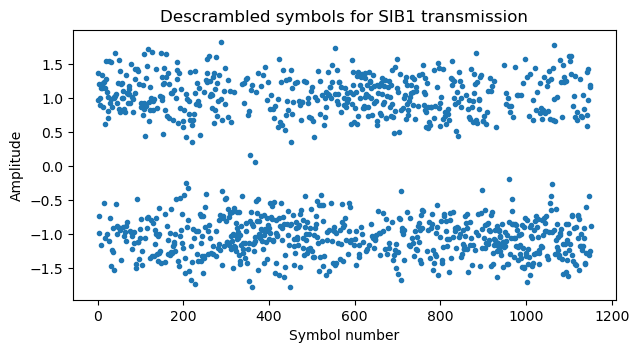

In [111]:
plt.plot(sib1_descrambled[0], '.')
plt.xlabel('Symbol number')
plt.ylabel('Amplitude')
plt.title('Descrambled symbols for SIB1 transmission');

In [112]:
def symbols_to_LLRs(symbols, noise_sigma):
    return -2 * symbols / noise_sigma**2

def turbo_len(transport_size):
    pdsch_crc_len = 24
    turbo_tail = 4
    return transport_size + pdsch_crc_len + turbo_tail

In [113]:
sib1_transport_size = 176
sib1_coding_rate = (sib1_transport_size + 24) / np.array([d.size for d in sib1_descrambled])
sib1_noise_sigma = 0.3
sib1_collected = rate_matching_collect_turbo(
    [(symbols_to_LLRs(sib1_descrambled[0], sib1_noise_sigma), 2),
     (symbols_to_LLRs(sib1_descrambled[1], sib1_noise_sigma), 3)],
    turbo_len(sib1_transport_size))

sib1_coding_rate

array([0.17361111, 0.17361111, 0.17361111, 0.17361111, 0.17361111,
       0.17361111, 0.18939394, 0.18939394, 0.18939394, 0.18939394,
       0.18939394, 0.18939394, 0.18939394, 0.18939394, 0.18939394,
       0.18939394, 0.18939394, 0.18939394, 0.18939394, 0.18939394,
       0.18939394, 0.17361111, 0.17361111, 0.17361111, 0.17361111,
       0.17361111, 0.18939394, 0.18939394, 0.18939394, 0.18939394,
       0.18939394, 0.18939394, 0.18939394, 0.18939394, 0.17361111,
       0.17361111, 0.17361111, 0.17361111, 0.17361111, 0.17361111,
       0.17361111, 0.17361111, 0.17361111, 0.17361111, 0.17361111,
       0.17361111, 0.17361111, 0.17361111, 0.17361111])

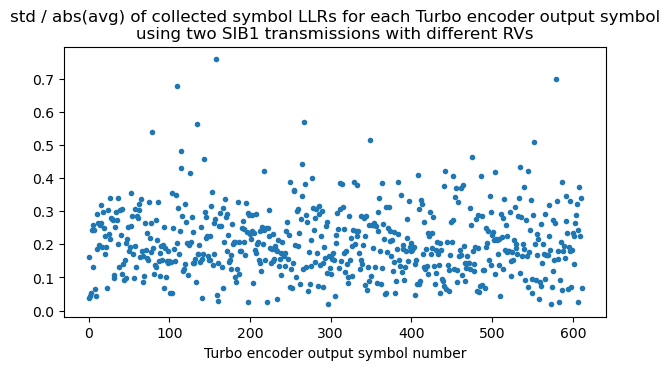

In [114]:
plt.plot([np.std(s) / np.abs(np.average(s)) for s in sib1_collected.values()], '.')
plt.xlabel('Turbo encoder output symbol number')
plt.title('std / abs(avg) of collected symbol LLRs for each Turbo encoder output symbol\nusing two SIB1 transmissions with different RVs');

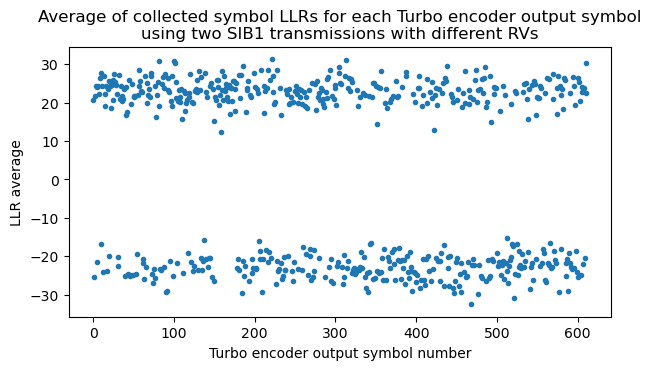

In [115]:
sib1_collected_avg = {k: np.average(v) for k, v in sib1_collected.items()}
plt.plot(sib1_collected_avg.values(), '.')
plt.xlabel('Turbo encoder output symbol number')
plt.ylabel('LLR average')
plt.title('Average of collected symbol LLRs for each Turbo encoder output symbol\nusing two SIB1 transmissions with different RVs');

In [116]:
# Table 5.1.3-3 in TS 36.212
def f1f2_table(K):
    return {
 40: (3, 10),
 48: (7, 12),
 56: (19, 42),
 64: (7, 16),
 72: (7, 18),
 80: (11, 20),
 88: (5, 22),
 96: (11, 24),
 104: (7, 26),
 112: (41, 84),
 120: (103, 90),
 128: (15, 32),
 136: (9, 34),
 144: (17, 108),
 152: (9, 38),
 160: (21, 120),
 168: (101, 84),
 176: (21, 44),
 184: (57, 46),
 192: (23, 48),
 200: (13, 50),
 208: (27, 52),
 216: (11, 36),
 224: (27, 56),
 232: (85, 58),
 240: (29, 60),
 248: (33, 62),
 256: (15, 32),
 264: (17, 198),
 272: (33, 68),
 280: (103, 210),
 288: (19, 36),
 296: (19, 74),
 304: (37, 76),
 312: (19, 78),
 320: (21, 120),
 328: (21, 82),
 336: (115, 84),
 344: (193, 86),
 352: (21, 44),
 360: (133, 90),
 368: (81, 46),
 376: (45, 94),
 384: (23, 48),
 392: (243, 98),
 400: (151, 40),
 408: (155, 102),
 416: (25, 52),
 424: (51, 106),
 432: (47, 72),
 440: (91, 110),
 448: (29, 168),
 456: (29, 114),
 464: (247, 58),
 472: (29, 118),
 480: (89, 180),
 488: (91, 122),
 496: (157, 62),
 504: (55, 84),
 512: (31, 64),
 528: (17, 66),
 544: (35, 68),
 560: (227, 420),
 576: (65, 96),
 592: (19, 74),
 608: (37, 76),
 624: (41, 234),
 640: (39, 80),
 656: (185, 82),
 672: (43, 252),
 688: (21, 86),
 704: (155, 44),
 720: (79, 120),
 736: (139, 92),
 752: (23, 94),
 768: (217, 48),
 784: (25, 98),
 800: (17, 80),
 816: (127, 102),
 832: (25, 52),
 848: (239, 106),
 864: (17, 48),
 880: (137, 110),
 896: (215, 112),
 912: (29, 114),
 928: (15, 58),
 944: (147, 118),
 960: (29, 60),
 976: (59, 122),
 992: (65, 124),
 1008: (55, 84),
 1024: (31, 64),
 1056: (17, 66),
 1088: (171, 204),
 1120: (67, 140),
 1152: (35, 72),
 1184: (19, 74),
 1216: (39, 76),
 1248: (19, 78),
 1280: (199, 240),
 1312: (21, 82),
 1344: (211, 252),
 1376: (21, 86),
 1408: (43, 88),
 1440: (149, 60),
 1472: (45, 92),
 1504: (49, 846),
 1536: (71, 48),
 1568: (13, 28),
 1600: (17, 80),
 1632: (25, 102),
 1664: (183, 104),
 1696: (55, 954),
 1728: (127, 96),
 1760: (27, 110),
 1792: (29, 112),
 1824: (29, 114),
 1856: (57, 116),
 1888: (45, 354),
 1920: (31, 120),
 1952: (59, 610),
 1984: (185, 124),
 2016: (113, 420),
 2048: (31, 64),
 2112: (17, 66),
 2176: (171, 136),
 2240: (209, 420),
 2304: (253, 216),
 2368: (367, 444),
 2432: (265, 456),
 2496: (181, 468),
 2560: (39, 80),
 2624: (27, 164),
 2688: (127, 504),
 2752: (143, 172),
 2816: (43, 88),
 2880: (29, 300),
 2944: (45, 92),
 3008: (157, 188),
 3072: (47, 96),
 3136: (13, 28),
 3200: (111, 240),
 3264: (443, 204),
 3328: (51, 104),
 3392: (51, 212),
 3456: (451, 192),
 3520: (257, 220),
 3584: (57, 336),
 3648: (313, 228),
 3712: (271, 232),
 3776: (179, 236),
 3840: (331, 120),
 3904: (363, 244),
 3968: (375, 248),
 4032: (127, 168),
 4096: (31, 64),
 4160: (33, 130),
 4224: (43, 264),
 4288: (33, 134),
 4352: (477, 408),
 4416: (35, 138),
 4480: (233, 280),
 4544: (357, 142),
 4608: (337, 480),
 4672: (37, 146),
 4736: (71, 444),
 4800: (71, 120),
 4864: (37, 152),
 4928: (39, 462),
 4992: (127, 234),
 5056: (39, 158),
 5120: (39, 80),
 5184: (31, 96),
 5248: (113, 902),
 5312: (41, 166),
 5376: (251, 336),
 5440: (43, 170),
 5504: (21, 86),
 5568: (43, 174),
 5632: (45, 176),
 5696: (45, 178),
 5760: (161, 120),
 5824: (89, 182),
 5888: (323, 184),
 5952: (47, 186),
 6016: (23, 94),
 6080: (47, 190),
 6144: (263, 480)}[K]

def turbo_permutation(K):
    f1, f2 = f1f2_table(K)
    i = np.arange(K)
    return (f1 * i + f2 * i**2) % K

def turbo_permutation_inv(K):
    fwd = list(turbo_permutation(K))
    return np.array([fwd.index(i) for i in range(K)])

In [117]:
def maxstar(a, b):
    result = np.empty_like(a)
    ainf = a == -np.inf
    binf = b == -np.inf
    result[ainf] = b[ainf]
    result[binf] = a[binf]
    noninf = (a != -np.inf) & (b != -np.inf)
    an = a[noninf]
    bn = b[noninf]
    result[noninf] = np.maximum(an, bn) + np.log1p(np.exp(-np.abs(an-bn)))
    return result

def BCJR(Ru, R, Ap):
    T = Ru.size # time steps
    nu = 3 # number of states = 2^nu
    Gamma = np.empty((T, 2**nu, 2**nu))
    Gamma[...] = -np.inf
    A = np.empty((T, 2**nu))
    A[...] = -np.inf
    A[0, 0] = 0
    B = np.empty((T, 2**nu))
    B[...] = -np.inf
    B[-1, 0] = 0
    
    # States are encoded as the concatenation of the
    # bits in the shift register, with the oldest bit
    # in the LSB, so that the shift register is shifted
    # left in each epoch.
    for r in range(2**nu):
        for s in range(2**nu):
            # non-termination trellis
            if r >> 1 == s & (2**(nu-1)-1):
                # S_r to S_s is a trellis edge
                Gamma[:-nu, r, s] = 0
                feedback = (r ^ (r >> 1)) & 1
                # The information bit corresponding to the
                # transition from S_r to S_s
                newbit = (s >> (nu - 1)) ^ feedback
                if newbit == 0:
                    Gamma[:-nu, r, s] += Ap - np.log1p(np.exp(Ap))
                else:
                    Gamma[:-nu, r, s] += -Ap - np.log1p(np.exp(-Ap))
                c0 = newbit
                c1 = (r ^ (r >> 2) ^ (s >> (nu - 1))) & 1                
                if c0 == 0:
                    Gamma[:-nu, r, s] += Ru[:-nu] - np.log1p(np.exp(Ru[:-nu]))
                else:
                    Gamma[:-nu, r, s] += -Ru[:-nu] - np.log1p(np.exp(-Ru[:-nu]))
                if c1 == 0:
                    Gamma[:-nu, r, s] += R[:-nu] - np.log1p(np.exp(R[:-nu]))
                else:
                    Gamma[:-nu, r, s] += -R[:-nu] - np.log1p(np.exp(-R[:-nu]))
            # termination trellis
            if r >> 1 == s:
                # S_r to S_s is a trellis edge
                Gamma[-nu:, r, s] = 0
                feedback = (r ^ (r >> 1)) & 1
                c0 = feedback
                c1 = (r ^ (r >> 2)) & 1
                if c0 == 0:
                    Gamma[-nu:, r, s] += Ru[-nu:] - np.log1p(np.exp(Ru[-nu:]))
                else:
                    Gamma[-nu:, r, s] += -Ru[-nu:] - np.log1p(np.exp(-Ru[-nu:]))
                if c1 == 0:
                    Gamma[-nu:, r, s] += R[-nu:] - np.log1p(np.exp(R[-nu:]))
                else:
                    Gamma[-nu:, r, s] += -R[-nu:] - np.log1p(np.exp(-R[-nu:]))

    # Note: For A, t is numbered from 0 to T-1,
    # while for Gamma and B, it is numbered from 1 to T
    for t in range(1, T):
        for r in range(2**nu):
            A[t, :] = maxstar(A[t, :], A[t-1, r] + Gamma[t-1, r, :])

    for t in range(T-2, -1, -1):
        for s in range(2**nu):
            B[t, :] = maxstar(B[t, :], B[t+1, s] + Gamma[t+1, :, s])
    
    M = A[:, :, np.newaxis] + Gamma + B[:, np.newaxis, :]

    Lp = np.empty_like(Ap)
    Lm = np.empty_like(Ap)
    Lp[:] = -np.inf
    Lm[:] = -np.inf
    for r in range(2**nu):
        for s in range(2**nu):
            # always non-termination trellis
            if r >> 1 == s & (2**(nu-1)-1):
                feedback = (r ^ (r >> 1)) & 1
                newbit = (s >> (nu - 1)) ^ feedback
                if newbit == 1:
                    Lp = maxstar(Lp, M[:-nu, r, s])
                else:
                    Lm = maxstar(Lm, M[:-nu, r, s])
    return Lm - Lp

def turbo_decoder(Ru1, R1, Ru2, R2, num_iterations=10, maxA=512, maxR=512, do_plots=False):
    for R in [Ru1, R1, Ru2, R2]:
        R[:] = np.clip(R, -maxR, maxR)
    K = Ru1.size - 3
    E2 = np.zeros(K)
    for iteration in range(num_iterations):
        A1 = E2[turbo_permutation_inv(K)]
        A1 = np.clip(A1, -maxA, maxA)
        L1 = BCJR(Ru1, R1, A1)
        E1 = L1 - Ru1[:-3] - A1        
        A2 = E1[turbo_permutation(K)]
        A2 = np.clip(A2, -maxA, maxA)
        L2 = BCJR(Ru2, R2, A2)
        E2 = L2 - Ru2[:-3] - A2
        if do_plots:
            fig, axs = plt.subplots(2, 1, sharex=True, sharey=True)
            axs[0].plot(L1, '.')
            axs[1].plot(L2, '.', color='C1')
            axs[0].set_ylabel('L1')
            axs[1].set_ylabel('L2')
            fig.suptitle(f'LTE Turbo decoder iteration {iteration}', y=0.93)
            axs[1].set_xlabel('Message bit')
            plt.subplots_adjust(hspace=0)
    return L2[turbo_permutation_inv(K)]

def LTE_turbo_decoder(collected_LLRs, transport_size, plot_channel_LLRs=False, **kwargs):
    LLRs = np.array([[np.sum(collected_LLRs.get((j, k), [0]))
                      for k in range(turbo_len(transport_size))]
                     for j in range(3)])                      
    if plot_channel_LLRs:
        plt.figure()
        plt.plot(LLRs.ravel(), '.')
        plt.title('LTE Turbo decoder channel LLRs')
    # Section 5.1.3.2.2 in TS 36.212 for trellis termination "shuffling"
    K = turbo_len(transport_size) - 4
    # x
    Ru1 = np.concatenate([LLRs[0, :K], [LLRs[0, K], LLRs[2, K], LLRs[1, K+1]]])
    # z
    R1 = np.concatenate([LLRs[1, :K], [LLRs[1, K], LLRs[0, K+1], LLRs[2, K+1]]])
    # x'
    Ru2 = np.concatenate([LLRs[0, :K][turbo_permutation(K)], [LLRs[0, K+2], LLRs[2, K+2], LLRs[1, K+3]]])
    # z'
    R2 = np.concatenate([LLRs[2, :K], [LLRs[1, K+2], LLRs[0, K+3], LLRs[2, K+3]]])
    return turbo_decoder(Ru1, R1, Ru2, R2, **kwargs)

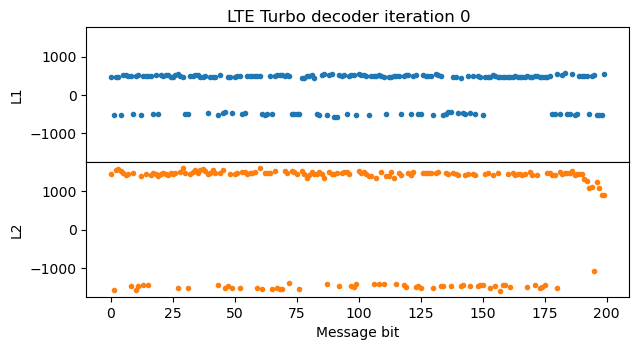

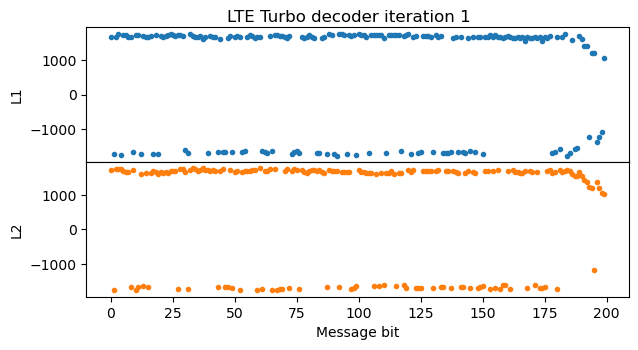

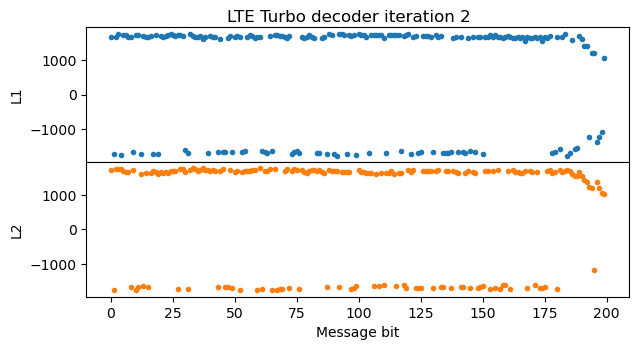

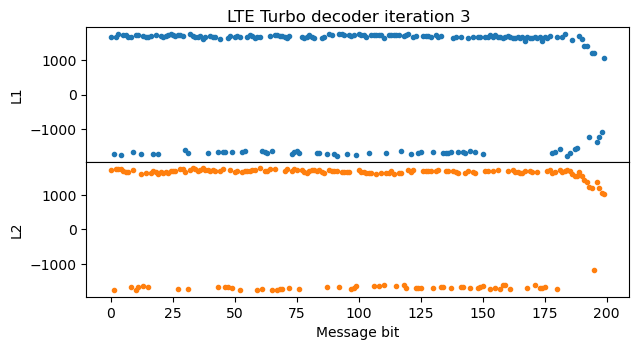

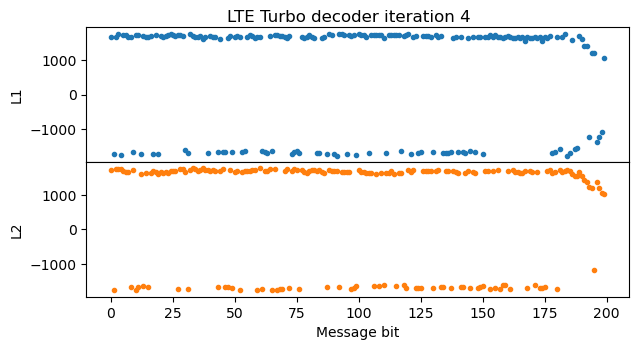

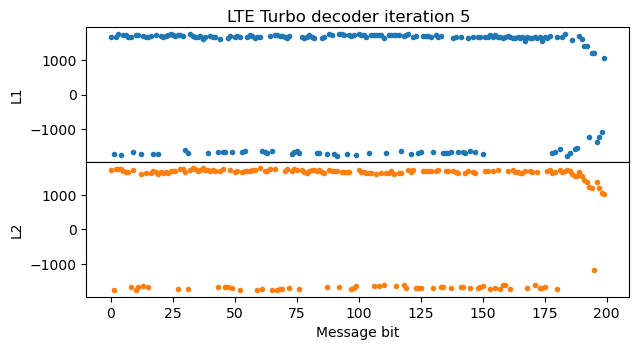

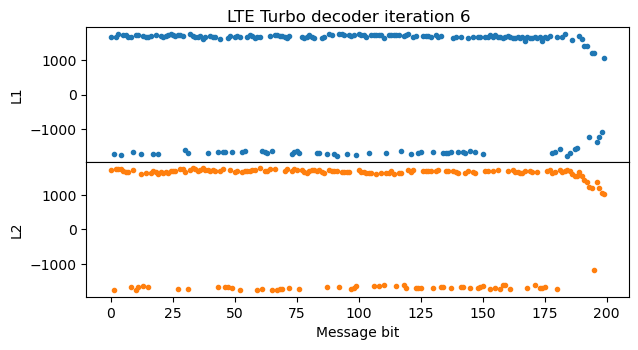

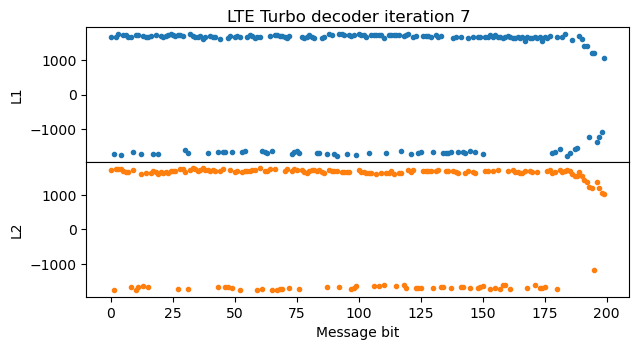

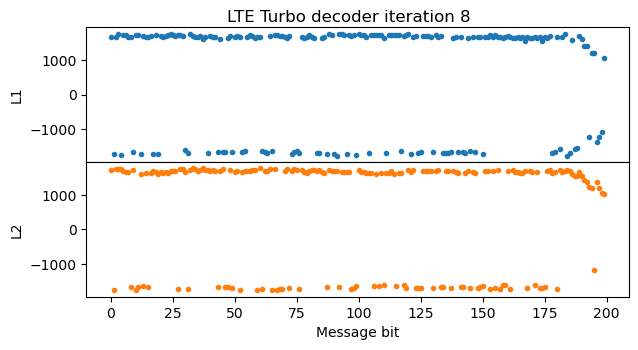

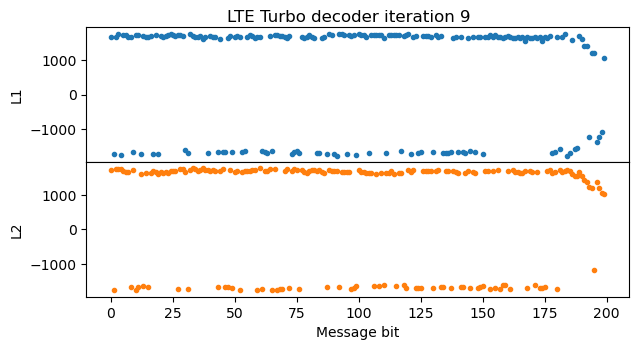

In [118]:
sib1_LLRs = LTE_turbo_decoder(sib1_collected, sib1_transport_size, do_plots=True)

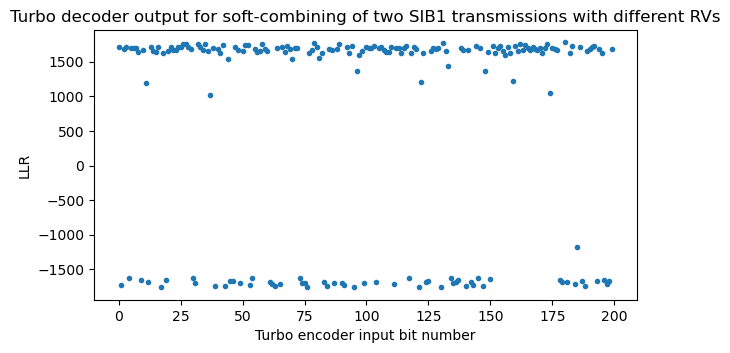

In [119]:
plt.plot(sib1_LLRs, '.')
plt.xlabel('Turbo encoder input bit number')
plt.ylabel('LLR')
plt.title('Turbo decoder output for soft-combining of two SIB1 transmissions with different RVs');

In [120]:
sib1_with_crc24 = bytes(np.packbits(sib1_LLRs < 0))
sib1_with_crc24.hex()

'4848500301164607407819311081044c23cb5200000034d84e'

In [121]:
crc24a_table = [
  0x00000000,0x00864cfb,0x008ad50d,0x000c99f6,0x0093e6e1,0x0015aa1a,0x001933ec,0x009f7f17,
  0x00a18139,0x0027cdc2,0x002b5434,0x00ad18cf,0x003267d8,0x00b42b23,0x00b8b2d5,0x003efe2e,
  0x00c54e89,0x00430272,0x004f9b84,0x00c9d77f,0x0056a868,0x00d0e493,0x00dc7d65,0x005a319e,
  0x0064cfb0,0x00e2834b,0x00ee1abd,0x00685646,0x00f72951,0x007165aa,0x007dfc5c,0x00fbb0a7,
  0x000cd1e9,0x008a9d12,0x008604e4,0x0000481f,0x009f3708,0x00197bf3,0x0015e205,0x0093aefe,
  0x00ad50d0,0x002b1c2b,0x002785dd,0x00a1c926,0x003eb631,0x00b8faca,0x00b4633c,0x00322fc7,
  0x00c99f60,0x004fd39b,0x00434a6d,0x00c50696,0x005a7981,0x00dc357a,0x00d0ac8c,0x0056e077,
  0x00681e59,0x00ee52a2,0x00e2cb54,0x006487af,0x00fbf8b8,0x007db443,0x00712db5,0x00f7614e,
  0x0019a3d2,0x009fef29,0x009376df,0x00153a24,0x008a4533,0x000c09c8,0x0000903e,0x0086dcc5,
  0x00b822eb,0x003e6e10,0x0032f7e6,0x00b4bb1d,0x002bc40a,0x00ad88f1,0x00a11107,0x00275dfc,
  0x00dced5b,0x005aa1a0,0x00563856,0x00d074ad,0x004f0bba,0x00c94741,0x00c5deb7,0x0043924c,
  0x007d6c62,0x00fb2099,0x00f7b96f,0x0071f594,0x00ee8a83,0x0068c678,0x00645f8e,0x00e21375,
  0x0015723b,0x00933ec0,0x009fa736,0x0019ebcd,0x008694da,0x0000d821,0x000c41d7,0x008a0d2c,
  0x00b4f302,0x0032bff9,0x003e260f,0x00b86af4,0x002715e3,0x00a15918,0x00adc0ee,0x002b8c15,
  0x00d03cb2,0x00567049,0x005ae9bf,0x00dca544,0x0043da53,0x00c596a8,0x00c90f5e,0x004f43a5,
  0x0071bd8b,0x00f7f170,0x00fb6886,0x007d247d,0x00e25b6a,0x00641791,0x00688e67,0x00eec29c,
  0x003347a4,0x00b50b5f,0x00b992a9,0x003fde52,0x00a0a145,0x0026edbe,0x002a7448,0x00ac38b3,
  0x0092c69d,0x00148a66,0x00181390,0x009e5f6b,0x0001207c,0x00876c87,0x008bf571,0x000db98a,
  0x00f6092d,0x007045d6,0x007cdc20,0x00fa90db,0x0065efcc,0x00e3a337,0x00ef3ac1,0x0069763a,
  0x00578814,0x00d1c4ef,0x00dd5d19,0x005b11e2,0x00c46ef5,0x0042220e,0x004ebbf8,0x00c8f703,
  0x003f964d,0x00b9dab6,0x00b54340,0x00330fbb,0x00ac70ac,0x002a3c57,0x0026a5a1,0x00a0e95a,
  0x009e1774,0x00185b8f,0x0014c279,0x00928e82,0x000df195,0x008bbd6e,0x00872498,0x00016863,
  0x00fad8c4,0x007c943f,0x00700dc9,0x00f64132,0x00693e25,0x00ef72de,0x00e3eb28,0x0065a7d3,
  0x005b59fd,0x00dd1506,0x00d18cf0,0x0057c00b,0x00c8bf1c,0x004ef3e7,0x00426a11,0x00c426ea,
  0x002ae476,0x00aca88d,0x00a0317b,0x00267d80,0x00b90297,0x003f4e6c,0x0033d79a,0x00b59b61,
  0x008b654f,0x000d29b4,0x0001b042,0x0087fcb9,0x001883ae,0x009ecf55,0x009256a3,0x00141a58,
  0x00efaaff,0x0069e604,0x00657ff2,0x00e33309,0x007c4c1e,0x00fa00e5,0x00f69913,0x0070d5e8,
  0x004e2bc6,0x00c8673d,0x00c4fecb,0x0042b230,0x00ddcd27,0x005b81dc,0x0057182a,0x00d154d1,
  0x0026359f,0x00a07964,0x00ace092,0x002aac69,0x00b5d37e,0x00339f85,0x003f0673,0x00b94a88,
  0x0087b4a6,0x0001f85d,0x000d61ab,0x008b2d50,0x00145247,0x00921ebc,0x009e874a,0x0018cbb1,
  0x00e37b16,0x006537ed,0x0069ae1b,0x00efe2e0,0x00709df7,0x00f6d10c,0x00fa48fa,0x007c0401,
  0x0042fa2f,0x00c4b6d4,0x00c82f22,0x004e63d9,0x00d11cce,0x00575035,0x005bc9c3,0x00dd8538]

def crc24a(data):
    crc = 0
    for d in data:
        tbl_idx = ((crc >> 16) ^ d) & 0xff
        crc = (crc24a_table[tbl_idx] ^ (crc << 8)) & 0xffffff
    return crc & 0xffffff

In [122]:
crc24a(sib1_with_crc24) == 0

True

In [123]:
def decode_transport_block(LLRs_and_rv_idxs, transport_size, **kwargs):
    collected = rate_matching_collect_turbo(LLRs_and_rv_idxs, turbo_len(transport_size))
    LLRs = LTE_turbo_decoder(collected, transport_size, **kwargs)
    with_crc24 = bytes(np.packbits(LLRs < 0))
    if crc24a(with_crc24) != 0:
        return None
    return with_crc24[:-3]

In [124]:
rv_idxs_sequence = [0, 2, 3, 1] # transmission order for BCH redundancy versions
sib1_first_rv = 1 # rv_idx in sequence corresponding to first SIB1 transmission in recording
sib1_decodes = [decode_transport_block([(symbols_to_LLRs(sib1_descrambled[j], sib1_noise_sigma), 
                                         rv_idxs_sequence[(j + sib1_first_rv) % 4])], sib1_transport_size)
                for j in range(num_sib1)]
collections.Counter(sib1_decodes)

Counter({b'HHP\x03\x01\x16F\x07@x\x191\x10\x81\x04L#\xcbR\x00\x00\x00': 49})

In [125]:
sib1_decodes[0].hex()

'4848500301164607407819311081044c23cb52000000'

In [126]:
asn1.decode('BCCH-DL-SCH-Message', sib1_decodes[0])

{'message': ('c1',
  ('systemInformationBlockType1',
   {'cellAccessRelatedInfo': {'plmn-IdentityList': [{'plmn-Identity': {'mcc': [2,
         1,
         4],
        'mnc': [0, 1]},
       'cellReservedForOperatorUse': 'notReserved'}],
     'trackingAreaCode': (b'\x01\x16', 16),
     'cellIdentity': (b'F\x07@p', 28),
     'cellBarred': 'notBarred',
     'intraFreqReselection': 'allowed',
     'csg-Indication': False},
    'cellSelectionInfo': {'q-RxLevMin': -64},
    'freqBandIndicator': 20,
    'schedulingInfoList': [{'si-Periodicity': 'rf16',
      'sib-MappingInfo': ['sibType3']},
     {'si-Periodicity': 'rf32', 'sib-MappingInfo': ['sibType5']},
     {'si-Periodicity': 'rf64', 'sib-MappingInfo': ['sibType6']}],
    'si-WindowLength': 'ms40',
    'systemInfoValueTag': 11,
    'nonCriticalExtension': {'nonCriticalExtension': {'cellSelectionInfo-v920': {'q-QualMin-r9': -18}}}}))}

In [127]:
for j in range(num_sib1):
    store_mac_pdu(sib1_subframes[j], sib1_decodes[j], 0xffff)

## SI-RNTI

Transmissions other than periodic transmission of SIB1.

In [128]:
def sirnti_decode(subframe, rbs, transport_size, noise_sigma=0.5, rv=0):
    descrambled = pdsch_descrambled(subframe, rbs, 0xffff)
    coding_rate = (transport_size + 24) / descrambled.size
    plt.figure(figsize=(4, 2))
    plt.plot(descrambled, '.', markersize=2)
    plt.title(f'SI-RNTI symbols\nsubframe = {subframe}, transport block size = {transport_size}\nRV = {rv}, coding rate = {coding_rate:.3f}')
    plt.xlabel('Symbol number')
    plt.ylabel('Amplitude')
    tb = decode_transport_block([(symbols_to_LLRs(descrambled, noise_sigma), rv)], transport_size)
    store_mac_pdu(subframe, tb, 0xffff)
    return asn1.decode('BCCH-DL-SCH-Message', tb)

{'message': ('c1',
  ('systemInformation',
   {'criticalExtensions': ('systemInformation-r8',
     {'sib-TypeAndInfo': [('sib2',
        {'ac-BarringInfo': {'ac-BarringForEmergency': False},
         'radioResourceConfigCommon': {'rach-ConfigCommon': {'preambleInfo': {'numberOfRA-Preambles': 'n28',
            'preamblesGroupAConfig': {'sizeOfRA-PreamblesGroupA': 'n16',
             'messageSizeGroupA': 'b56',
             'messagePowerOffsetGroupB': 'dB10'}},
           'powerRampingParameters': {'powerRampingStep': 'dB2',
            'preambleInitialReceivedTargetPower': 'dBm-104'},
           'ra-SupervisionInfo': {'preambleTransMax': 'n10',
            'ra-ResponseWindowSize': 'sf10',
            'mac-ContentionResolutionTimer': 'sf64'},
           'maxHARQ-Msg3Tx': 5},
          'bcch-Config': {'modificationPeriodCoeff': 'n4'},
          'pcch-Config': {'defaultPagingCycle': 'rf64', 'nB': 'oneT'},
          'prach-Config': {'rootSequenceIndex': 176,
           'prach-ConfigInfo': 

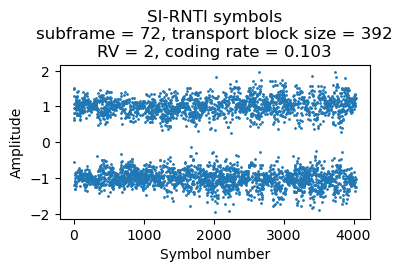

In [129]:
sirnti_decode(72, np.arange(14), 392, rv=2)

{'message': ('c1',
  ('systemInformation',
   {'criticalExtensions': ('systemInformation-r8',
     {'sib-TypeAndInfo': [('sib2',
        {'ac-BarringInfo': {'ac-BarringForEmergency': False},
         'radioResourceConfigCommon': {'rach-ConfigCommon': {'preambleInfo': {'numberOfRA-Preambles': 'n28',
            'preamblesGroupAConfig': {'sizeOfRA-PreamblesGroupA': 'n16',
             'messageSizeGroupA': 'b56',
             'messagePowerOffsetGroupB': 'dB10'}},
           'powerRampingParameters': {'powerRampingStep': 'dB2',
            'preambleInitialReceivedTargetPower': 'dBm-104'},
           'ra-SupervisionInfo': {'preambleTransMax': 'n10',
            'ra-ResponseWindowSize': 'sf10',
            'mac-ContentionResolutionTimer': 'sf64'},
           'maxHARQ-Msg3Tx': 5},
          'bcch-Config': {'modificationPeriodCoeff': 'n4'},
          'pcch-Config': {'defaultPagingCycle': 'rf64', 'nB': 'oneT'},
          'prach-Config': {'rootSequenceIndex': 176,
           'prach-ConfigInfo': 

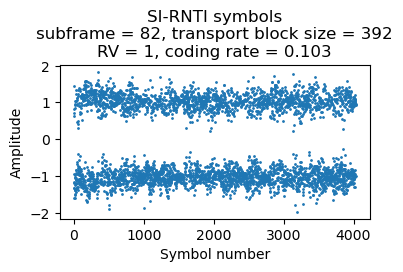

In [130]:
sirnti_decode(82, np.arange(14), 392, rv=1)

{'message': ('c1',
  ('systemInformation',
   {'criticalExtensions': ('systemInformation-r8',
     {'sib-TypeAndInfo': [('sib5',
        {'interFreqCarrierFreqList': [{'dl-CarrierFreq': 1501,
           'q-RxLevMin': -64,
           't-ReselectionEUTRA': 2,
           'threshX-High': 5,
           'threshX-Low': 5,
           'allowedMeasBandwidth': 'mbw100',
           'presenceAntennaPort1': False,
           'cellReselectionPriority': 6,
           'neighCellConfig': (b'@', 2),
           'q-OffsetFreq': 'dB0',
           'q-QualMin-r9': -18},
          {'dl-CarrierFreq': 3250,
           'q-RxLevMin': -64,
           't-ReselectionEUTRA': 2,
           'threshX-High': 8,
           'threshX-Low': 8,
           'allowedMeasBandwidth': 'mbw100',
           'presenceAntennaPort1': False,
           'cellReselectionPriority': 6,
           'neighCellConfig': (b'@', 2),
           'q-OffsetFreq': 'dB0',
           'q-QualMin-r9': -18},
          {'dl-CarrierFreq': 401,
           'q-RxL

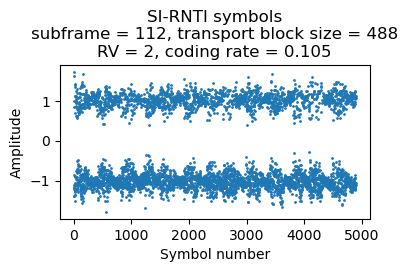

In [131]:
sirnti_decode(112, np.arange(17), 488, rv=2)

{'message': ('c1',
  ('systemInformation',
   {'criticalExtensions': ('systemInformation-r8',
     {'sib-TypeAndInfo': [('sib5',
        {'interFreqCarrierFreqList': [{'dl-CarrierFreq': 1501,
           'q-RxLevMin': -64,
           't-ReselectionEUTRA': 2,
           'threshX-High': 5,
           'threshX-Low': 5,
           'allowedMeasBandwidth': 'mbw100',
           'presenceAntennaPort1': False,
           'cellReselectionPriority': 6,
           'neighCellConfig': (b'@', 2),
           'q-OffsetFreq': 'dB0',
           'q-QualMin-r9': -18},
          {'dl-CarrierFreq': 3250,
           'q-RxLevMin': -64,
           't-ReselectionEUTRA': 2,
           'threshX-High': 8,
           'threshX-Low': 8,
           'allowedMeasBandwidth': 'mbw100',
           'presenceAntennaPort1': False,
           'cellReselectionPriority': 6,
           'neighCellConfig': (b'@', 2),
           'q-OffsetFreq': 'dB0',
           'q-QualMin-r9': -18},
          {'dl-CarrierFreq': 401,
           'q-RxL

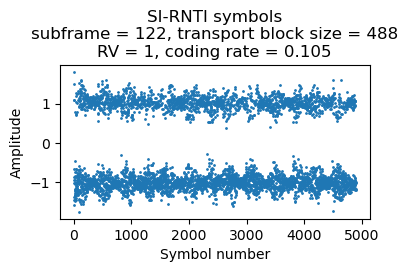

In [132]:
sirnti_decode(122, np.arange(17), 488, rv=1)

{'message': ('c1',
  ('systemInformation',
   {'criticalExtensions': ('systemInformation-r8',
     {'sib-TypeAndInfo': [('sib6',
        {'carrierFreqListUTRA-FDD': [{'carrierFreq': 3062,
           'cellReselectionPriority': 1,
           'threshX-High': 8,
           'threshX-Low': 1,
           'q-RxLevMin': -55,
           'p-MaxUTRA': 24,
           'q-QualMin': -18},
          {'carrierFreq': 10713,
           'cellReselectionPriority': 1,
           'threshX-High': 8,
           'threshX-Low': 1,
           'q-RxLevMin': -55,
           'p-MaxUTRA': 24,
           'q-QualMin': -18}],
         't-ReselectionUTRA': 3})]})}))}

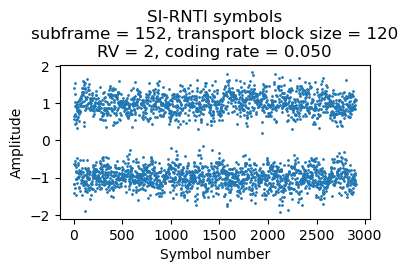

In [133]:
sirnti_decode(152, np.arange(11), 120, rv=2)

{'message': ('c1',
  ('systemInformation',
   {'criticalExtensions': ('systemInformation-r8',
     {'sib-TypeAndInfo': [('sib2',
        {'ac-BarringInfo': {'ac-BarringForEmergency': False},
         'radioResourceConfigCommon': {'rach-ConfigCommon': {'preambleInfo': {'numberOfRA-Preambles': 'n28',
            'preamblesGroupAConfig': {'sizeOfRA-PreamblesGroupA': 'n16',
             'messageSizeGroupA': 'b56',
             'messagePowerOffsetGroupB': 'dB10'}},
           'powerRampingParameters': {'powerRampingStep': 'dB2',
            'preambleInitialReceivedTargetPower': 'dBm-104'},
           'ra-SupervisionInfo': {'preambleTransMax': 'n10',
            'ra-ResponseWindowSize': 'sf10',
            'mac-ContentionResolutionTimer': 'sf64'},
           'maxHARQ-Msg3Tx': 5},
          'bcch-Config': {'modificationPeriodCoeff': 'n4'},
          'pcch-Config': {'defaultPagingCycle': 'rf64', 'nB': 'oneT'},
          'prach-Config': {'rootSequenceIndex': 176,
           'prach-ConfigInfo': 

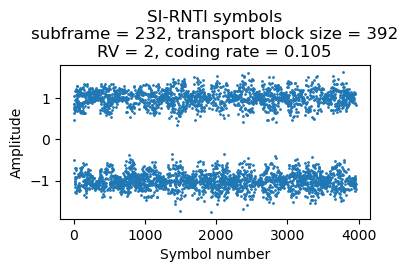

In [134]:
sirnti_decode(232, np.arange(15), 392, rv=2)

{'message': ('c1',
  ('systemInformation',
   {'criticalExtensions': ('systemInformation-r8',
     {'sib-TypeAndInfo': [('sib2',
        {'ac-BarringInfo': {'ac-BarringForEmergency': False},
         'radioResourceConfigCommon': {'rach-ConfigCommon': {'preambleInfo': {'numberOfRA-Preambles': 'n28',
            'preamblesGroupAConfig': {'sizeOfRA-PreamblesGroupA': 'n16',
             'messageSizeGroupA': 'b56',
             'messagePowerOffsetGroupB': 'dB10'}},
           'powerRampingParameters': {'powerRampingStep': 'dB2',
            'preambleInitialReceivedTargetPower': 'dBm-104'},
           'ra-SupervisionInfo': {'preambleTransMax': 'n10',
            'ra-ResponseWindowSize': 'sf10',
            'mac-ContentionResolutionTimer': 'sf64'},
           'maxHARQ-Msg3Tx': 5},
          'bcch-Config': {'modificationPeriodCoeff': 'n4'},
          'pcch-Config': {'defaultPagingCycle': 'rf64', 'nB': 'oneT'},
          'prach-Config': {'rootSequenceIndex': 176,
           'prach-ConfigInfo': 

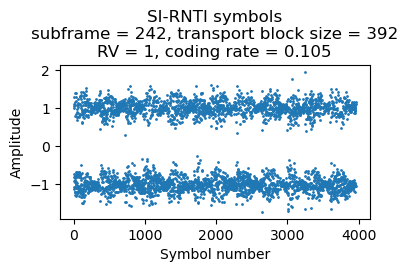

In [135]:
sirnti_decode(242, np.arange(15), 392, rv=1)

{'message': ('c1',
  ('systemInformation',
   {'criticalExtensions': ('systemInformation-r8',
     {'sib-TypeAndInfo': [('sib2',
        {'ac-BarringInfo': {'ac-BarringForEmergency': False},
         'radioResourceConfigCommon': {'rach-ConfigCommon': {'preambleInfo': {'numberOfRA-Preambles': 'n28',
            'preamblesGroupAConfig': {'sizeOfRA-PreamblesGroupA': 'n16',
             'messageSizeGroupA': 'b56',
             'messagePowerOffsetGroupB': 'dB10'}},
           'powerRampingParameters': {'powerRampingStep': 'dB2',
            'preambleInitialReceivedTargetPower': 'dBm-104'},
           'ra-SupervisionInfo': {'preambleTransMax': 'n10',
            'ra-ResponseWindowSize': 'sf10',
            'mac-ContentionResolutionTimer': 'sf64'},
           'maxHARQ-Msg3Tx': 5},
          'bcch-Config': {'modificationPeriodCoeff': 'n4'},
          'pcch-Config': {'defaultPagingCycle': 'rf64', 'nB': 'oneT'},
          'prach-Config': {'rootSequenceIndex': 176,
           'prach-ConfigInfo': 

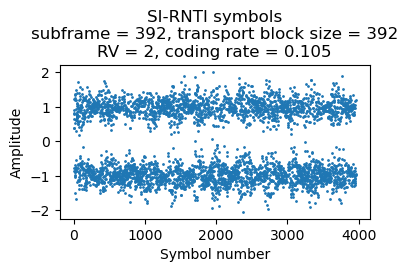

In [136]:
sirnti_decode(392, np.arange(15), 392, rv=2)

{'message': ('c1',
  ('systemInformation',
   {'criticalExtensions': ('systemInformation-r8',
     {'sib-TypeAndInfo': [('sib2',
        {'ac-BarringInfo': {'ac-BarringForEmergency': False},
         'radioResourceConfigCommon': {'rach-ConfigCommon': {'preambleInfo': {'numberOfRA-Preambles': 'n28',
            'preamblesGroupAConfig': {'sizeOfRA-PreamblesGroupA': 'n16',
             'messageSizeGroupA': 'b56',
             'messagePowerOffsetGroupB': 'dB10'}},
           'powerRampingParameters': {'powerRampingStep': 'dB2',
            'preambleInitialReceivedTargetPower': 'dBm-104'},
           'ra-SupervisionInfo': {'preambleTransMax': 'n10',
            'ra-ResponseWindowSize': 'sf10',
            'mac-ContentionResolutionTimer': 'sf64'},
           'maxHARQ-Msg3Tx': 5},
          'bcch-Config': {'modificationPeriodCoeff': 'n4'},
          'pcch-Config': {'defaultPagingCycle': 'rf64', 'nB': 'oneT'},
          'prach-Config': {'rootSequenceIndex': 176,
           'prach-ConfigInfo': 

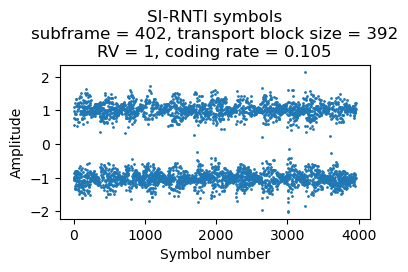

In [137]:
sirnti_decode(402, np.arange(15), 392, rv=1)

{'message': ('c1',
  ('systemInformation',
   {'criticalExtensions': ('systemInformation-r8',
     {'sib-TypeAndInfo': [('sib5',
        {'interFreqCarrierFreqList': [{'dl-CarrierFreq': 1501,
           'q-RxLevMin': -64,
           't-ReselectionEUTRA': 2,
           'threshX-High': 5,
           'threshX-Low': 5,
           'allowedMeasBandwidth': 'mbw100',
           'presenceAntennaPort1': False,
           'cellReselectionPriority': 6,
           'neighCellConfig': (b'@', 2),
           'q-OffsetFreq': 'dB0',
           'q-QualMin-r9': -18},
          {'dl-CarrierFreq': 3250,
           'q-RxLevMin': -64,
           't-ReselectionEUTRA': 2,
           'threshX-High': 8,
           'threshX-Low': 8,
           'allowedMeasBandwidth': 'mbw100',
           'presenceAntennaPort1': False,
           'cellReselectionPriority': 6,
           'neighCellConfig': (b'@', 2),
           'q-OffsetFreq': 'dB0',
           'q-QualMin-r9': -18},
          {'dl-CarrierFreq': 401,
           'q-RxL

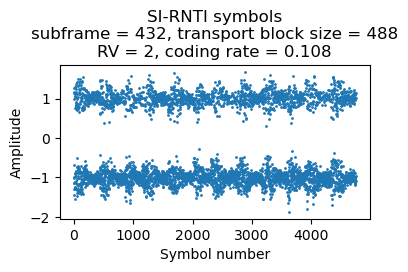

In [138]:
sirnti_decode(432, np.arange(18), 488, rv=2)

{'message': ('c1',
  ('systemInformation',
   {'criticalExtensions': ('systemInformation-r8',
     {'sib-TypeAndInfo': [('sib5',
        {'interFreqCarrierFreqList': [{'dl-CarrierFreq': 1501,
           'q-RxLevMin': -64,
           't-ReselectionEUTRA': 2,
           'threshX-High': 5,
           'threshX-Low': 5,
           'allowedMeasBandwidth': 'mbw100',
           'presenceAntennaPort1': False,
           'cellReselectionPriority': 6,
           'neighCellConfig': (b'@', 2),
           'q-OffsetFreq': 'dB0',
           'q-QualMin-r9': -18},
          {'dl-CarrierFreq': 3250,
           'q-RxLevMin': -64,
           't-ReselectionEUTRA': 2,
           'threshX-High': 8,
           'threshX-Low': 8,
           'allowedMeasBandwidth': 'mbw100',
           'presenceAntennaPort1': False,
           'cellReselectionPriority': 6,
           'neighCellConfig': (b'@', 2),
           'q-OffsetFreq': 'dB0',
           'q-QualMin-r9': -18},
          {'dl-CarrierFreq': 401,
           'q-RxL

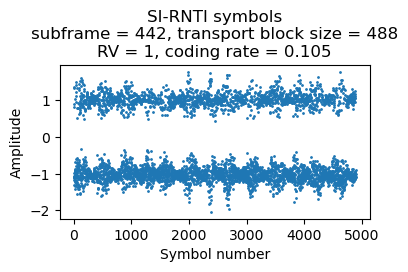

In [139]:
sirnti_decode(442, np.arange(17), 488, rv=1)

## P-RNTI

In [140]:
def prnti_decode(subframe, rbs, transport_size, noise_sigma=0.5):
    descrambled = pdsch_descrambled(subframe, rbs, 0xfffe)
    coding_rate = (transport_size + 24) / descrambled.size
    plt.figure(figsize=(4, 2))
    plt.plot(descrambled, '.', markersize=2)
    plt.title(f'P-RNTI symbols\nsubframe = {subframe}, transport block size = {transport_size}\ncoding rate = {coding_rate:.3f}')
    plt.xlabel('Symbol number')
    plt.ylabel('Amplitude')
    tb = decode_transport_block([(symbols_to_LLRs(descrambled, noise_sigma), 0)], transport_size)
    store_mac_pdu(subframe, tb, 0xfffe)
    return asn1.decode('PCCH-Message', tb)

{'message': ('c1',
  ('paging',
   {'pagingRecordList': [{'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xd0', 8), 'm-TMSI': (b'\xca\xd1\xb2J', 32)}),
      'cn-Domain': 'ps'},
     {'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xc8', 8), 'm-TMSI': (b'\xfdO\xb9R', 32)}),
      'cn-Domain': 'ps'},
     {'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xc8', 8), 'm-TMSI': (b'\xdb7\x08q', 32)}),
      'cn-Domain': 'ps'}]}))}

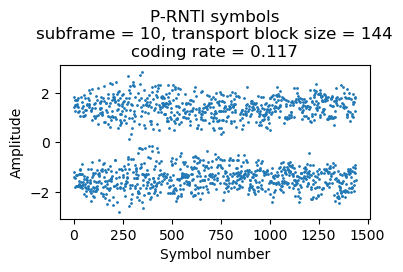

In [141]:
prnti_decode(10, np.arange(0, 5), 144)

{'message': ('c1',
  ('paging',
   {'pagingRecordList': [{'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xd0', 8), 'm-TMSI': (b'\xc8\xf1F\xb6', 32)}),
      'cn-Domain': 'ps'},
     {'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xe8', 8), 'm-TMSI': (b'\xf9\x8b\xbc\xbc', 32)}),
      'cn-Domain': 'ps'}]}))}

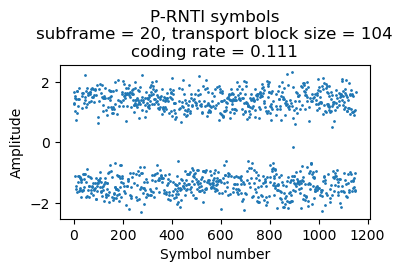

In [142]:
prnti_decode(20, np.arange(0, 4), 104)

{'message': ('c1',
  ('paging',
   {'pagingRecordList': [{'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xb0', 8), 'm-TMSI': (b'\xd1F\xef~', 32)}),
      'cn-Domain': 'ps'}]}))}

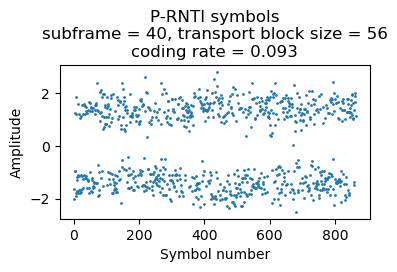

In [143]:
prnti_decode(40, np.arange(0, 3), 56)

{'message': ('c1',
  ('paging',
   {'pagingRecordList': [{'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xc8', 8), 'm-TMSI': (b'\xcb(\xb5[', 32)}),
      'cn-Domain': 'ps'}]}))}

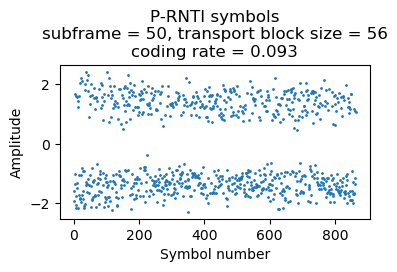

In [144]:
prnti_decode(50, np.arange(0, 3), 56)

{'message': ('c1',
  ('paging',
   {'pagingRecordList': [{'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xb0', 8), 'm-TMSI': (b'\xfa$\x0f\xc8', 32)}),
      'cn-Domain': 'ps'}]}))}

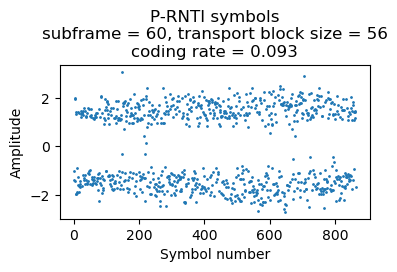

In [145]:
prnti_decode(60, np.arange(0, 3), 56)

{'message': ('c1',
  ('paging',
   {'pagingRecordList': [{'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xc0', 8), 'm-TMSI': (b'\xf1\x85\\\x8b', 32)}),
      'cn-Domain': 'ps'}]}))}

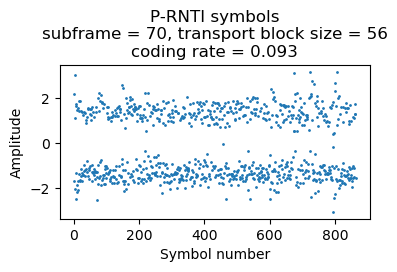

In [146]:
prnti_decode(70, np.arange(0, 3), 56)

{'message': ('c1',
  ('paging',
   {'pagingRecordList': [{'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xa8', 8), 'm-TMSI': (b'\xe1\x14\xc9k', 32)}),
      'cn-Domain': 'ps'}]}))}

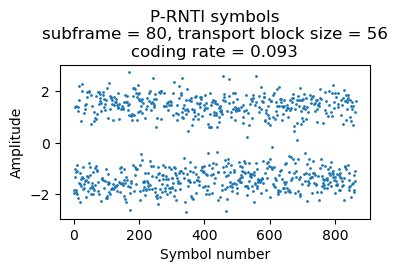

In [147]:
prnti_decode(80, np.arange(0, 3), 56)

{'message': ('c1',
  ('paging',
   {'pagingRecordList': [{'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xd0', 8), 'm-TMSI': (b'\xd6\xac_\x88', 32)}),
      'cn-Domain': 'ps'}]}))}

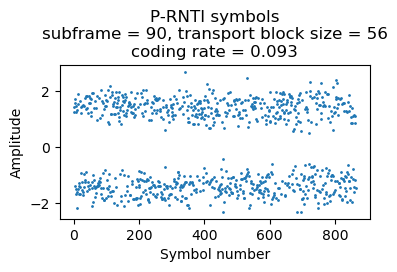

In [148]:
prnti_decode(90, np.arange(0, 3), 56)

{'message': ('c1',
  ('paging',
   {'pagingRecordList': [{'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xc0', 8), 'm-TMSI': (b'\xfe\x86\xc6}', 32)}),
      'cn-Domain': 'ps'}]}))}

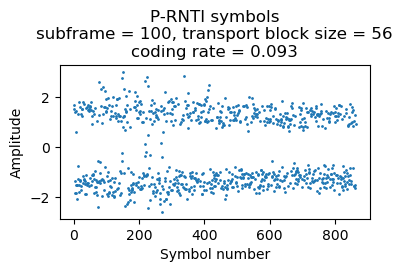

In [149]:
prnti_decode(100, np.arange(0, 3), 56)

{'message': ('c1',
  ('paging',
   {'pagingRecordList': [{'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xa8', 8), 'm-TMSI': (b'\xd7\x0b\xd0\xd9', 32)}),
      'cn-Domain': 'ps'}]}))}

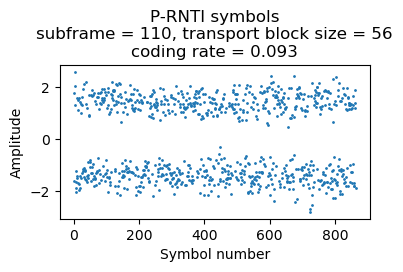

In [150]:
prnti_decode(110, np.arange(0, 3), 56)

{'message': ('c1',
  ('paging',
   {'pagingRecordList': [{'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xc8', 8), 'm-TMSI': (b'\xfeVh\xf4', 32)}),
      'cn-Domain': 'ps'}]}))}

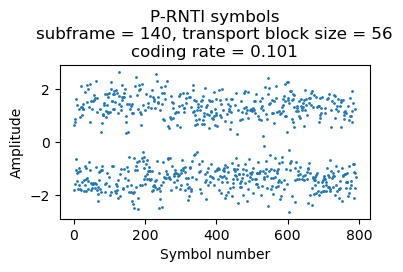

In [151]:
prnti_decode(140, np.arange(0, 3), 56)

{'message': ('c1',
  ('paging',
   {'pagingRecordList': [{'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xc0', 8), 'm-TMSI': (b'\xce\x12\xc42', 32)}),
      'cn-Domain': 'ps'}]}))}

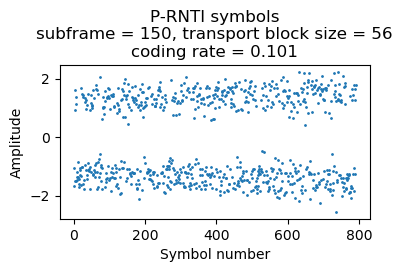

In [152]:
prnti_decode(150, np.arange(0, 3), 56)

{'message': ('c1',
  ('paging',
   {'pagingRecordList': [{'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xc8', 8), 'm-TMSI': (b'\xf1\x0f\x1d\xf8', 32)}),
      'cn-Domain': 'ps'},
     {'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xa8', 8), 'm-TMSI': (b'\xe2E\x0b^', 32)}),
      'cn-Domain': 'ps'}]}))}

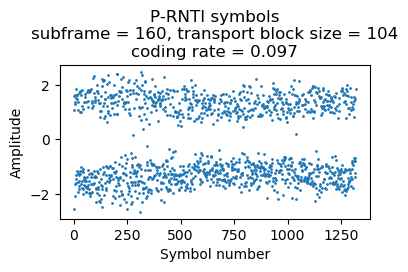

In [153]:
prnti_decode(160, np.arange(0, 5), 104)

{'message': ('c1',
  ('paging',
   {'pagingRecordList': [{'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xa8', 8), 'm-TMSI': (b'\xc1\x1b\x90\x85', 32)}),
      'cn-Domain': 'ps'},
     {'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xb0', 8), 'm-TMSI': (b'\xff\x18\xe1\x88', 32)}),
      'cn-Domain': 'ps'}]}))}

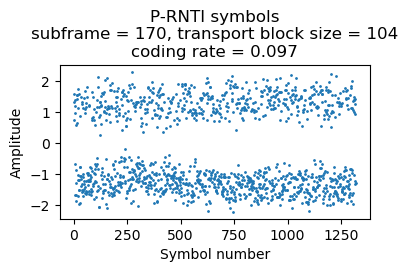

In [154]:
prnti_decode(170, np.arange(0, 5), 104)

{'message': ('c1',
  ('paging',
   {'pagingRecordList': [{'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xb8', 8), 'm-TMSI': (b'\xcel\xe8o', 32)}),
      'cn-Domain': 'ps'},
     {'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xc8', 8), 'm-TMSI': (b'\xed;\xd3\\', 32)}),
      'cn-Domain': 'ps'},
     {'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xb8', 8), 'm-TMSI': (b'\xef\x08\x818', 32)}),
      'cn-Domain': 'ps'}]}))}

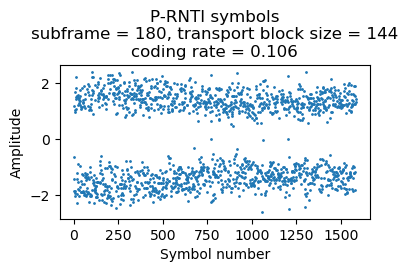

In [155]:
prnti_decode(180, np.arange(0, 6), 144)

{'message': ('c1',
  ('paging',
   {'pagingRecordList': [{'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xd0', 8), 'm-TMSI': (b'\xc8\x88\x00\xf6', 32)}),
      'cn-Domain': 'ps'}]}))}

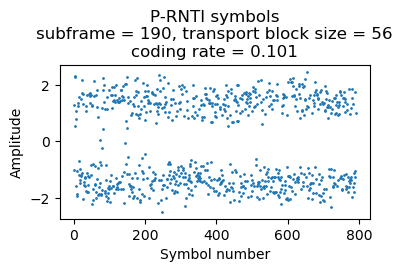

In [156]:
prnti_decode(190, np.arange(0, 3), 56)

{'message': ('c1',
  ('paging',
   {'pagingRecordList': [{'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xa8', 8), 'm-TMSI': (b'\xfb\x0e\xfe\x9b', 32)}),
      'cn-Domain': 'ps'}]}))}

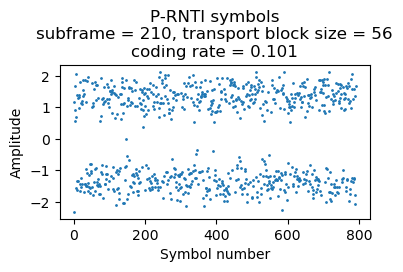

In [157]:
prnti_decode(210, np.arange(0, 3), 56)

{'message': ('c1',
  ('paging',
   {'pagingRecordList': [{'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xd0', 8), 'm-TMSI': (b'\xc4\x92%\xe2', 32)}),
      'cn-Domain': 'ps'},
     {'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xd0', 8), 'm-TMSI': (b'\xf5\x95\x08\xb9', 32)}),
      'cn-Domain': 'ps'},
     {'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xd0', 8), 'm-TMSI': (b'\xfa\xe9\xf7\n', 32)}),
      'cn-Domain': 'ps'}]}))}

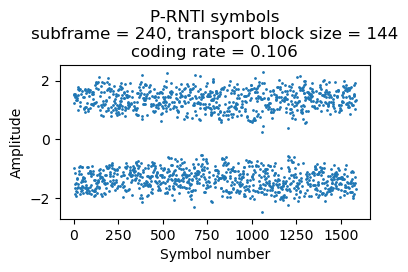

In [158]:
prnti_decode(240, np.arange(0, 6), 144)

{'message': ('c1',
  ('paging',
   {'pagingRecordList': [{'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xb8', 8), 'm-TMSI': (b'\xe9Sv\xad', 32)}),
      'cn-Domain': 'ps'},
     {'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xc0', 8), 'm-TMSI': (b'\xff\x80\x1b\xe9', 32)}),
      'cn-Domain': 'ps'}]}))}

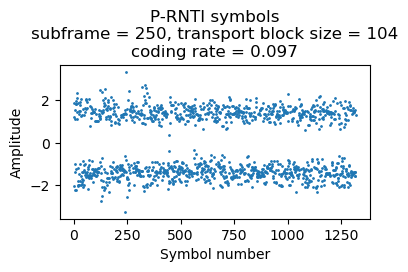

In [159]:
prnti_decode(250, np.arange(0, 5), 104)

{'message': ('c1',
  ('paging',
   {'pagingRecordList': [{'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xc8', 8), 'm-TMSI': (b'\xe33\x05]', 32)}),
      'cn-Domain': 'ps'},
     {'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xb0', 8), 'm-TMSI': (b'\xcb8\xb4\xb0', 32)}),
      'cn-Domain': 'ps'}]}))}

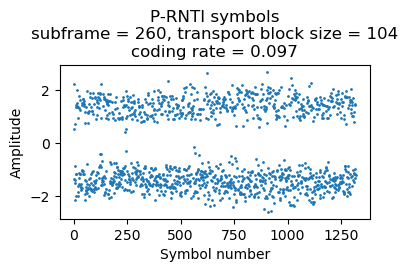

In [160]:
prnti_decode(260, np.arange(0, 5), 104)

{'message': ('c1',
  ('paging',
   {'pagingRecordList': [{'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xe8', 8), 'm-TMSI': (b'\xf6\xe6\xa6\x8e', 32)}),
      'cn-Domain': 'ps'}]}))}

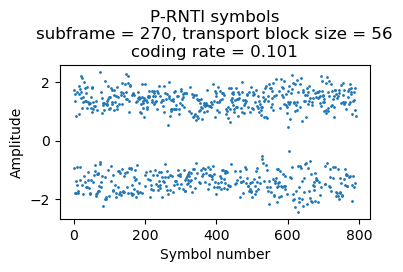

In [161]:
prnti_decode(270, np.arange(0, 3), 56)

{'message': ('c1',
  ('paging',
   {'pagingRecordList': [{'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xd0', 8), 'm-TMSI': (b'\xc2\xfd\xd5\xff', 32)}),
      'cn-Domain': 'ps'}]}))}

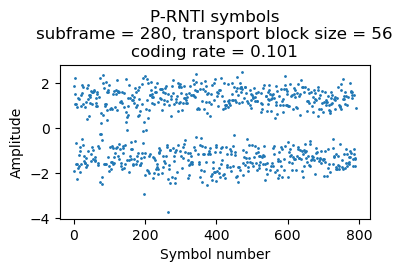

In [162]:
prnti_decode(280, np.arange(0, 3), 56)

{'message': ('c1',
  ('paging',
   {'pagingRecordList': [{'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xd0', 8), 'm-TMSI': (b'\xc9\xf2"P', 32)}),
      'cn-Domain': 'ps'}]}))}

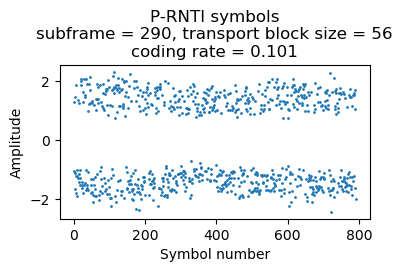

In [163]:
prnti_decode(290, np.arange(0, 3), 56)

{'message': ('c1',
  ('paging',
   {'pagingRecordList': [{'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xb0', 8), 'm-TMSI': (b'\xd4^\x9c$', 32)}),
      'cn-Domain': 'ps'}]}))}

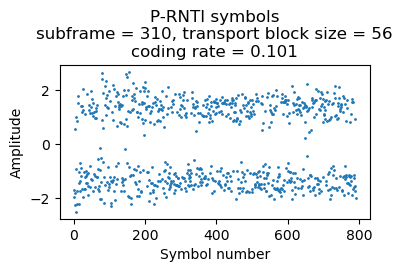

In [164]:
prnti_decode(310, np.arange(0, 3), 56)

{'message': ('c1',
  ('paging',
   {'pagingRecordList': [{'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xb8', 8), 'm-TMSI': (b'\xf3dF\xa0', 32)}),
      'cn-Domain': 'ps'},
     {'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xc0', 8), 'm-TMSI': (b'\xc4\x1eN{', 32)}),
      'cn-Domain': 'ps'},
     {'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xc0', 8), 'm-TMSI': (b'\xda\x1a\xa5\x0b', 32)}),
      'cn-Domain': 'ps'},
     {'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xc8', 8), 'm-TMSI': (b'\xfd\x0b\x94\x02', 32)}),
      'cn-Domain': 'ps'}]}))}

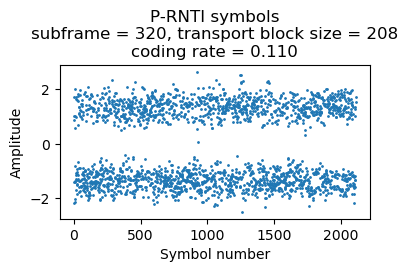

In [165]:
prnti_decode(320, np.arange(0, 8), 208)

{'message': ('c1',
  ('paging',
   {'pagingRecordList': [{'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xa8', 8), 'm-TMSI': (b'\xcc/\x15\r', 32)}),
      'cn-Domain': 'ps'}]}))}

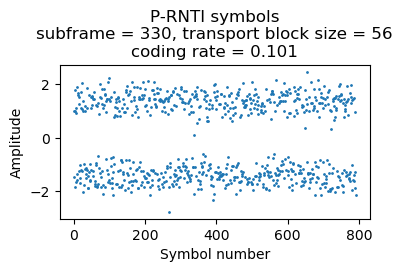

In [166]:
prnti_decode(330, np.arange(0, 3), 56)

{'message': ('c1',
  ('paging',
   {'pagingRecordList': [{'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xa8', 8), 'm-TMSI': (b'\xe5\n\xfc\xf8', 32)}),
      'cn-Domain': 'ps'},
     {'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xd0', 8), 'm-TMSI': (b'\xda\xa4\xe6\x85', 32)}),
      'cn-Domain': 'ps'},
     {'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xc0', 8), 'm-TMSI': (b'\xd3\x0e2*', 32)}),
      'cn-Domain': 'ps'},
     {'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xc8', 8), 'm-TMSI': (b'\xd6\x0c\xf6D', 32)}),
      'cn-Domain': 'ps'}]}))}

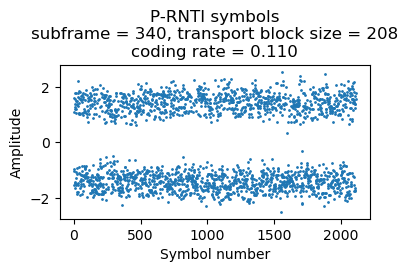

In [167]:
prnti_decode(340, np.arange(0, 8), 208)

{'message': ('c1',
  ('paging',
   {'pagingRecordList': [{'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xb0', 8), 'm-TMSI': (b'\xe0"F[', 32)}),
      'cn-Domain': 'ps'},
     {'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xb8', 8), 'm-TMSI': (b'\xe7\x17\x8f\x14', 32)}),
      'cn-Domain': 'ps'}]}))}

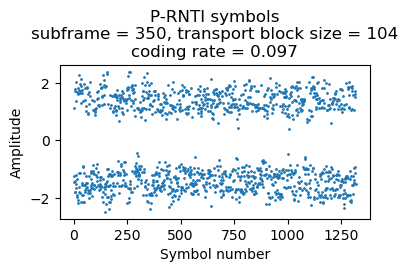

In [168]:
prnti_decode(350, np.arange(0, 5), 104)

{'message': ('c1',
  ('paging',
   {'pagingRecordList': [{'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xc8', 8), 'm-TMSI': (b'\xc6\x18W\x07', 32)}),
      'cn-Domain': 'ps'}]}))}

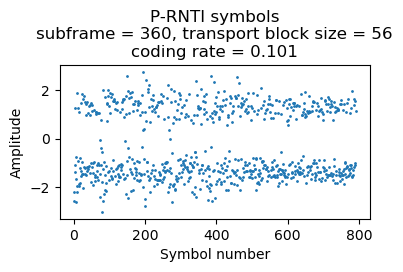

In [169]:
prnti_decode(360, np.arange(0, 3), 56)

{'message': ('c1',
  ('paging',
   {'pagingRecordList': [{'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xa8', 8), 'm-TMSI': (b'\xf4Q\t\xe9', 32)}),
      'cn-Domain': 'ps'}]}))}

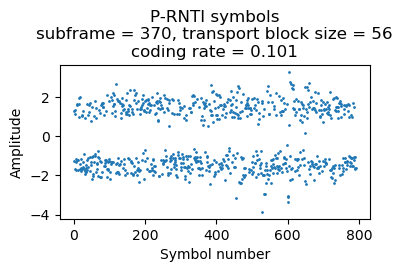

In [170]:
prnti_decode(370, np.arange(0, 3), 56)

{'message': ('c1',
  ('paging',
   {'pagingRecordList': [{'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xc0', 8), 'm-TMSI': (b'\xfa\x8e\xb9\xc3', 32)}),
      'cn-Domain': 'ps'}]}))}

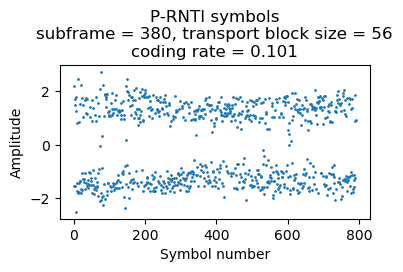

In [171]:
prnti_decode(380, np.arange(0, 3), 56)

{'message': ('c1',
  ('paging',
   {'pagingRecordList': [{'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xc8', 8), 'm-TMSI': (b'\xe7I71', 32)}),
      'cn-Domain': 'ps'},
     {'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xc8', 8), 'm-TMSI': (b'\xdcz\xd8\x8d', 32)}),
      'cn-Domain': 'ps'},
     {'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xb0', 8), 'm-TMSI': (b'\xda"\x80\'', 32)}),
      'cn-Domain': 'ps'}]}))}

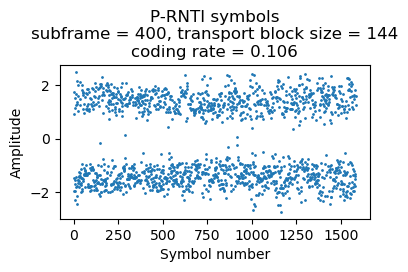

In [172]:
prnti_decode(400, np.arange(0, 6), 144)

{'message': ('c1',
  ('paging',
   {'pagingRecordList': [{'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xa8', 8), 'm-TMSI': (b'\xe6F\x01\xdd', 32)}),
      'cn-Domain': 'ps'}]}))}

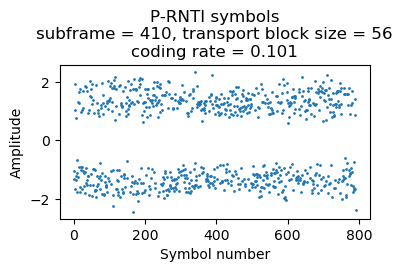

In [173]:
prnti_decode(410, np.arange(0, 3), 56)

{'message': ('c1',
  ('paging',
   {'pagingRecordList': [{'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xc8', 8), 'm-TMSI': (b'\xe3m\xb7\xa7', 32)}),
      'cn-Domain': 'ps'},
     {'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xa8', 8), 'm-TMSI': (b'\xd3!\x92\xb3', 32)}),
      'cn-Domain': 'ps'}]}))}

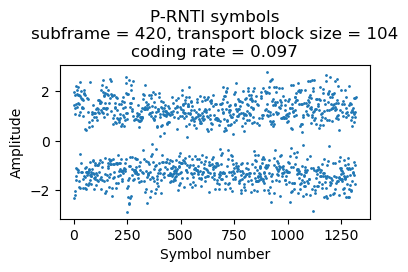

In [174]:
prnti_decode(420, np.arange(0, 5), 104)

{'message': ('c1',
  ('paging',
   {'pagingRecordList': [{'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xa8', 8), 'm-TMSI': (b'\xdf.\xb6B', 32)}),
      'cn-Domain': 'ps'}]}))}

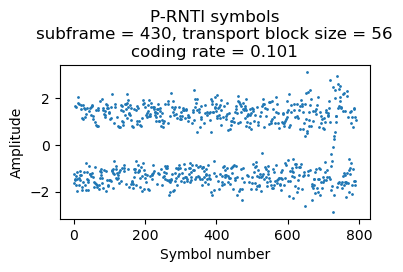

In [175]:
prnti_decode(430, np.arange(0, 3), 56)

{'message': ('c1',
  ('paging',
   {'pagingRecordList': [{'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xb0', 8), 'm-TMSI': (b'\xc84aL', 32)}),
      'cn-Domain': 'ps'}]}))}

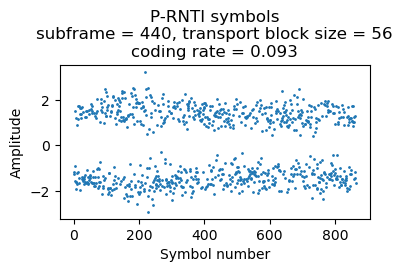

In [176]:
prnti_decode(440, np.arange(0, 3), 56)

{'message': ('c1',
  ('paging',
   {'pagingRecordList': [{'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xb0', 8), 'm-TMSI': (b'\xdb\x11\x8e\xad', 32)}),
      'cn-Domain': 'ps'},
     {'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xe8', 8), 'm-TMSI': (b'\xe4\xe6\xa8l', 32)}),
      'cn-Domain': 'ps'},
     {'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xb0', 8), 'm-TMSI': (b'\xeak\xb2\xb4', 32)}),
      'cn-Domain': 'ps'},
     {'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xa8', 8), 'm-TMSI': (b'\xe4K\x1f\xa8', 32)}),
      'cn-Domain': 'ps'}]}))}

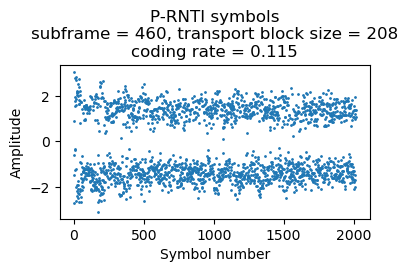

In [177]:
prnti_decode(460, np.arange(0, 7), 208)

{'message': ('c1',
  ('paging',
   {'pagingRecordList': [{'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xd0', 8), 'm-TMSI': (b'\xf3\xdb\xb8J', 32)}),
      'cn-Domain': 'ps'},
     {'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xe8', 8), 'm-TMSI': (b'\xfe\xa5\xca\r', 32)}),
      'cn-Domain': 'ps'},
     {'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xc0', 8), 'm-TMSI': (b'\xd4\x8d\xe2\x05', 32)}),
      'cn-Domain': 'ps'},
     {'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xc0', 8), 'm-TMSI': (b'\xfa\x0b\x82\xa8', 32)}),
      'cn-Domain': 'ps'},
     {'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xe8', 8), 'm-TMSI': (b'\xe9\xe6H6', 32)}),
      'cn-Domain': 'ps'}]}))}

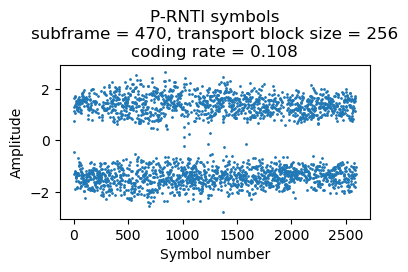

In [178]:
prnti_decode(470, np.arange(0, 9), 256)

{'message': ('c1',
  ('paging',
   {'pagingRecordList': [{'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xe8', 8), 'm-TMSI': (b'\xc5\xf1\xcf\n', 32)}),
      'cn-Domain': 'ps'},
     {'ue-Identity': ('s-TMSI',
       {'mmec': (b'\xd0', 8), 'm-TMSI': (b'\xf8\x8axo', 32)}),
      'cn-Domain': 'ps'}]}))}

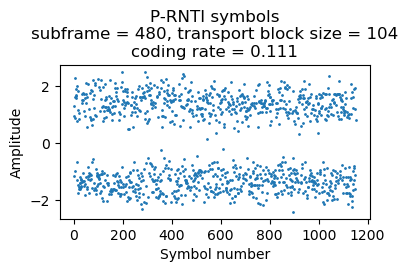

In [179]:
prnti_decode(480, np.arange(0, 4), 104)

## C-RNTI

In [180]:
def crnti_decode(subframe, rbs, rnti, transport_size, rv=0, noise_sigma=0.1, equalization=tm4, q=0, 
                 cancel_symbols=None, **kwargs):
    descrambled = pdsch_descrambled(subframe, rbs, rnti, equalization, q=q, cancel_symbols=cancel_symbols)
    coding_rate = (transport_size + 24) / descrambled.size
    plt.figure(figsize=(4, 2))
    plt.plot(descrambled, '.', markersize=2)
    if np.max(np.abs(descrambled) > 3):
        plt.ylim((-3, 3))
    plt.title(f'C-RNTI 0x{rnti:04x} symbols\nsubframe = {subframe}, transport block size = {transport_size}\n'
              f'RV = {rv}, coding rate = {coding_rate:.3f}'
              + (f', q = {q}' if q != 0 else ''))
    plt.xlabel('Symbol number')
    plt.ylabel('Amplitude')
    tb = decode_transport_block([(symbols_to_LLRs(descrambled, noise_sigma), rv)], transport_size, **kwargs)
    if tb is None:
        warnings.warn('Decoding failure')
        return
    store_mac_pdu(subframe, tb, rnti)
    return tb

'25271f00f985f1ae4e9dea164ad9052323091221050e5a80dc6dbb5d63cbced8b56dbe4262102125504385c71d4b2a45457482aeeb'

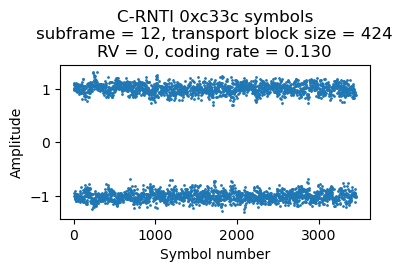

In [181]:
crnti_decode(12, np.arange(36, 48), 0xc33c, 424).hex()

'25271f00fa85f24d8a7b2bb1aff04b465725ca5cd7b2d7cc918652763d3b7b86531b8156167064244f2e41d2e783444de972786707'

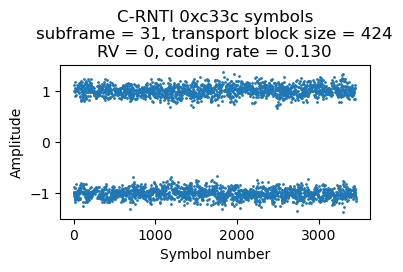

In [182]:
crnti_decode(31, np.arange(36, 48), 0xc33c, 424).hex()

'23809d1f9beffd84ccb6b188ea9b91aaaf56a2749299174bff9fad9731da6460511c81b89706d7cc443a30a2b67df3aec74f90800173d804b8c335b232132689c4fa782df4bcb07392007fa670f033d11fd65fcbc59f2b8618c2a6d46a7e32fe12e1aaad1c3b074eaeeb8a5787a23a46daaed229f146a5fa4f7bcde3cc3e1cbafdb3f1f331f183d40c3c4f1bb5aeb933ba2673ea4e3f264d132d1495ce551d630f'

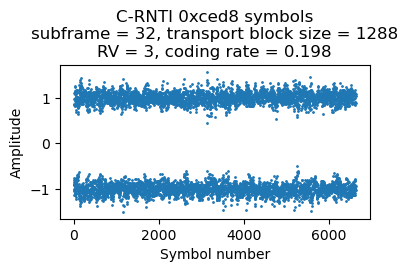

In [183]:
crnti_decode(32, np.concatenate((np.arange(0, 9), np.arange(36, 50))), 0xced8, 1288, rv=3).hex()

'25271f00fb85f39c4efede692337315a730ecc6668ca933a99b8eabce5927d26b743ac070012c6ae76ddb9a85ec9d5f812c0014c3a'

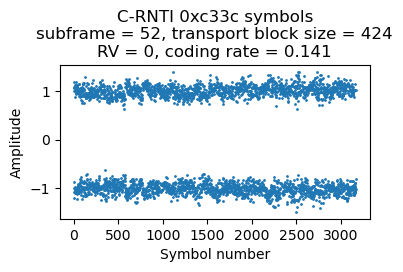

In [184]:
crnti_decode(52, np.arange(36, 48), 0xc33c, 424).hex()

'25271f00fc85f43047fe18b6aa3bb73dfbdba2ac5fd9605cc839d6b22d036a66bd9e86249430d80926ecf8d3eafcb947c94468'

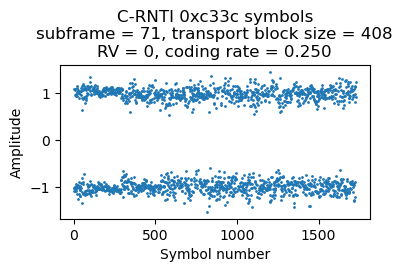

In [185]:
crnti_decode(71, np.arange(39, 45), 0xc33c, 408).hex()

'25271f00fd85f510d51cb7e88699bb4ac33795ae101dd08d41ed29285fdfe9283354efd4d5d12308fd422335ed11508f03645b1ba2'

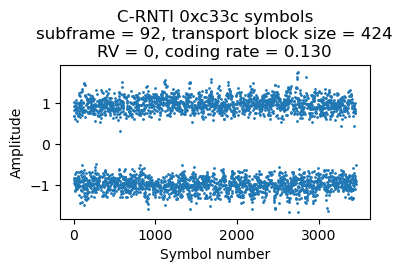

In [186]:
crnti_decode(92, np.arange(36, 48), 0xc33c, 424).hex()

'25271f00fe85f64579399350f6f240b4123e341782013ce8a4b264aef8ec54fcdaa2973460d5386dee4acf2ed060116cc6f4640f62'

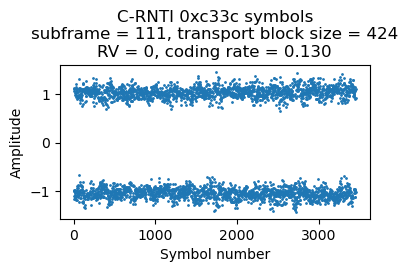

In [187]:
crnti_decode(111, np.arange(36, 48), 0xc33c, 424).hex()

'21021f076085b1'

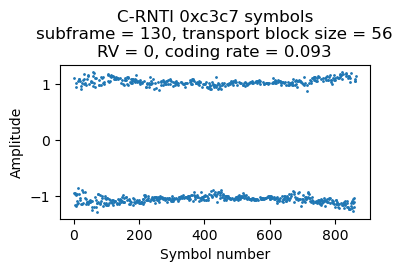

In [188]:
crnti_decode(130, np.arange(36, 39), 0xc3c7, 56, equalization=functools.partial(tm4, precoding=1)).hex()

'25271f00ff85f7d2bfd5701e44a8a0c8d32f1227673d5ddbd8b1f963c32489f91db1dfc8fbdf153c029e82dc80361946d2cfcc4815'

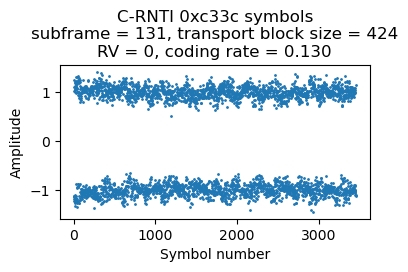

In [189]:
crnti_decode(131, np.arange(36, 48), 0xc33c, 424).hex()

'25271f010085f83003568e993c873e4cc4cb5e46b8ea49a9f881e994f2a881ce36d2efbdf1f4fd4a3e1cad5fade9aa'

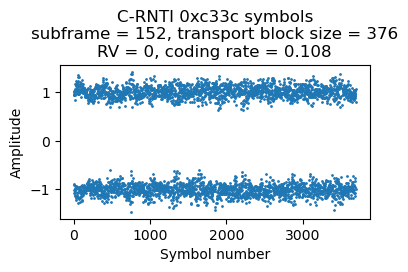

In [190]:
crnti_decode(152, np.concatenate((np.arange(12, 15), np.arange(39, 50))), 0xc33c, 376).hex()

'25271f010185f947a2fa969674c68b4837921cbd9ae5d192a75b6b06057fd86dd5f8ae1c4bcab886025b1aa58d608e69c015ddadb4'

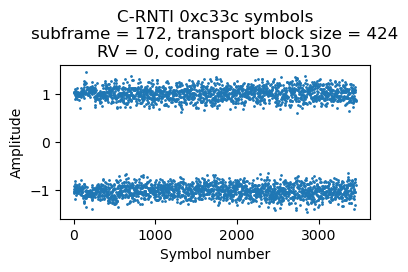

In [191]:
crnti_decode(172, np.arange(36, 48), 0xc33c, 424).hex()

'25271f010285fa6746139d0d729eb49fcb8ef2488e9042dc8fcad046ec951f2b766085f7380f4563b2f76e6c212d9ae996a684661d'

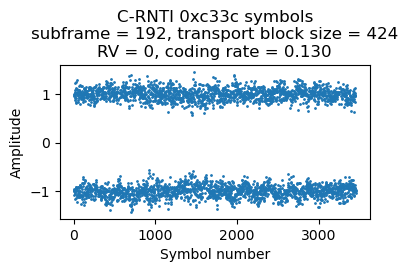

In [192]:
crnti_decode(192, np.arange(36, 48), 0xc33c, 424).hex()

'25271f010385fb945a98e74f43fd6d0e5cdde8d571dfe70e8cd59e45ddc95613dc152a20299f28b79dad6c19d00d799cd59c0dc915'

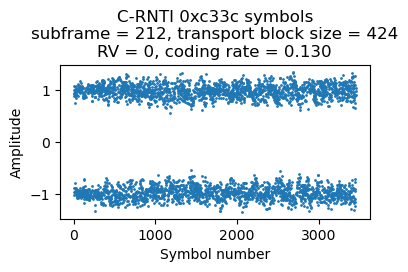

In [193]:
crnti_decode(212, np.arange(36, 48), 0xc33c, 424).hex()

'3d1f1e00cd80bc'

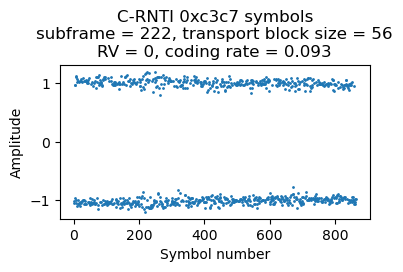

In [194]:
crnti_decode(222, np.arange(36, 39), 0xc3c7, 56).hex()

'25271f010485fc2eea030103c757da01fa18335e3b4d0d83745540d1ebc1ba2a4bc6c96cc66b905b10f4f69c0a5bbaf6fd6b00'

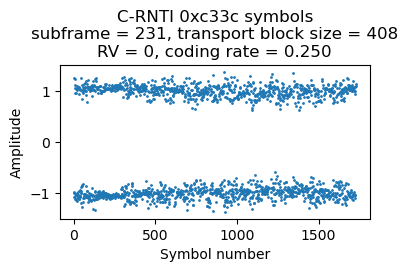

In [195]:
crnti_decode(231, np.arange(39, 45), 0xc33c, 408).hex()

'23551f9bf5e0418f441cdd1da756b7ababba8cc808024d10101495519505b65852cf201c0a2b4f43ea2a7b2ff883d2790f4c5dca1cae719a8334ce6e03575c5a2e59cde660e0b3c233b9770c63a4fd5fce91ddad47f5fc7a2a'

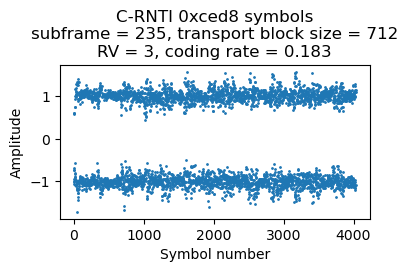

In [196]:
crnti_decode(235, np.concatenate((np.arange(3), np.arange(39, 50))), 0xced8, 712,
             rv=3, equalization=functools.partial(tm4, precoding=1)).hex()

'25271f010585fd3b8806301aa835128226088572b91dacbbc9e749d1cd833d24eef68e89b64f79085fd4f2749e9b37b1cc8cfb5808'

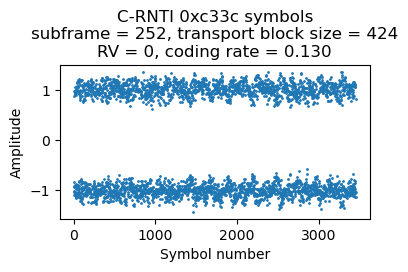

In [197]:
crnti_decode(252, np.arange(36, 48), 0xc33c, 424).hex()

'25271f010685fe4f2c8b3af2e3389642de6a51f0272e3fb57e6fa97760a1d32fb5b9804017bc4210b78674d5d31e64deaadb3631a1'

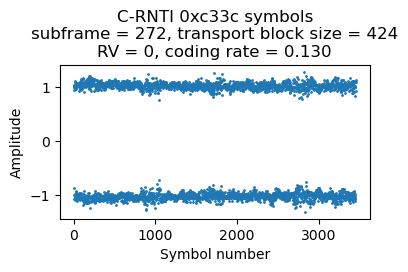

In [198]:
crnti_decode(272, np.arange(36, 48), 0xc33c, 424).hex()

'2380a91f980d9a22a675f7d3714e2243f4913a3815a14a467ccb62b3c9973a3710e5f6d8ca144bf156f0fdfd6160bff75c2a08b4294d8433bfadb1b3f07cde6429bf0a250f2148639e82e75ad2b2e1695ac575129bfb3db4bc0a856f35240f52e238bd6ae2a115e5bd76d95924204b2cbebb478867afb33876303243c9f9aa05785cf733e60eef5045cee273b5cd9ce3ee2211aa4b87f13869231114d3e9f123c628739a0174a222f4251d7d95'

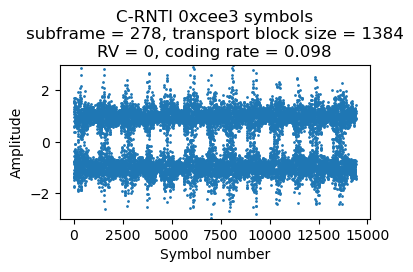

In [199]:
crnti_decode(278, np.arange(50), 0xcee3, 1384, equalization=functools.partial(tm4, precoding=2)).hex()

'2380a91f980f35bf10e52b0ca9a2b97bc1c550ea27dc30e6ff5179013d8bbcce4be72855185dcc98bc5e9ce3f1c9bcb628bca19da41a4b142f9a31a047f8688601b24231ea3e9778cfd792944c3ef431ae357660454de01eb295b429d4b44a363515dffcfc8f9d31586480424fef9ec9170ef124a6536e1bd98822838b6b3a3f9ffbfbdbb34ae6b5d5dbdc030a535d4f82888072fcfdbf9b178106f590f5d939e10a96ca208977b2799aa394e7'

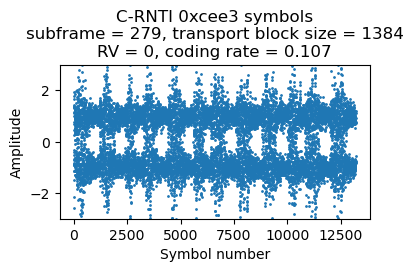

In [200]:
crnti_decode(279, np.arange(50), 0xcee3, 1384, equalization=functools.partial(tm4, precoding=2)).hex()

'23731fb0122518878d0770b0098e35f9dbc855a226298090d094d47bba478162c48d94ebf8d14f35b0075b75d239d387ba71c7bf2bf76ebd5448ded9ac4821ef178a50da7b61f53c42abfd6622fc8ae5423b4b830195012ea2879cc26852647e637ec2df119676adae43fba1d0a2788ecab307e77a784be2e26af945e706b9b584'

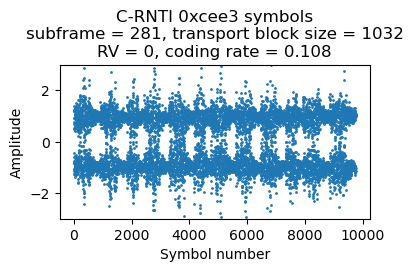

In [201]:
crnti_decode(281, np.concatenate((np.arange(24), np.arange(36, 50))), 0xcee3, 1032, equalization=functools.partial(tm4, precoding=2)).hex()

'23731fb014a1ce896a3f35e6ecae47dca9663d49af12805ec1e9f0f74ca29e15f530737545233ef44ac394c4e7b4ca5aa0f67a88bc85375c86ecf272ca92a535e4fd7e1dbc5214690086908700e3907eb51321bce3dadfa0cb7acbc75bb2364316d54e01e5e2c7219510798cfea9954159a574182727749a17e67298a36f328ec9'

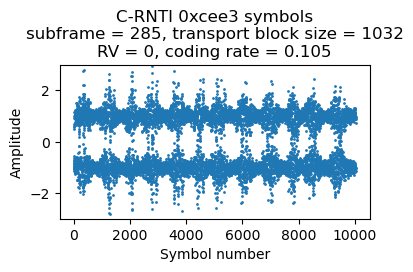

In [202]:
crnti_decode(285, np.concatenate((np.arange(24), np.arange(36, 50))), 0xcee3, 1032, equalization=functools.partial(tm4, precoding=2)).hex()

'25271f010785ffadebe87561901954e3ba73d06b623c9539fa86cd5aa67a937c48792fccf4c7dfcc15457754f726a0789bd4c7a8f5'

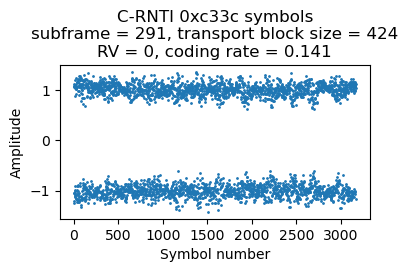

In [203]:
crnti_decode(291, np.arange(36, 48), 0xc33c, 424).hex()

'25271f010886001a4e7dcaad7cb9e04ab112a3713d143b2756c0dd00286da3b4cc87a81b6a9c86c05dd7b448babcb8af2157e2b5a3'

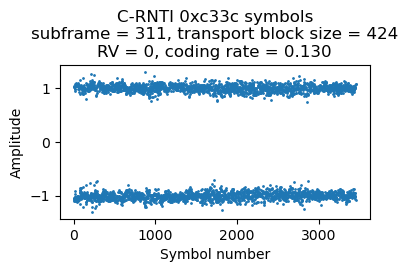

In [204]:
crnti_decode(311, np.arange(36, 48), 0xc33c, 424).hex()

'25271f0109860195bf273f3961e4e7eecb60efddfd90bf3852fa328c7956fe95223fda8432ff9db995eb2b91b1cce8a112c4e97877'

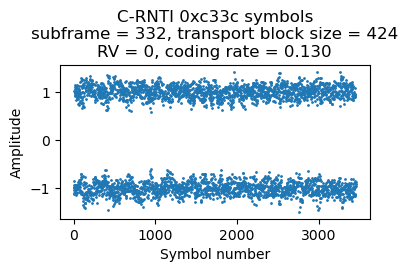

In [205]:
crnti_decode(332, np.arange(36, 48), 0xc33c, 424).hex()

'25271f010a860272e64715b6889924c090329f3182f6461c47a2a3d2aed2126642fee488c378d2e36e12d5b9316f704dd5cd5f252e'

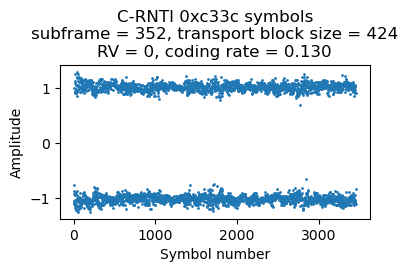

In [206]:
crnti_decode(352, np.arange(36, 48), 0xc33c, 424).hex()

'21021f076422fe'

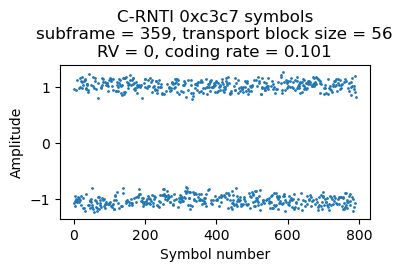

In [207]:
crnti_decode(359, np.arange(36, 39), 0xc3c7, 56).hex()

'25271f010b8603a6227405d598ce60a77c1e1325fa67bcc8ccecbc4524ba6b759d395b20266c6e15b688be48df15404c2a57cc6b62'

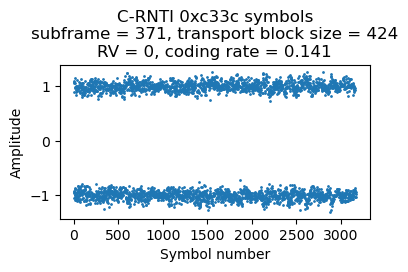

In [208]:
crnti_decode(371, np.arange(36, 48), 0xc33c, 424).hex()

'25271f010c860478e7583a865eb8b59cae71c6656dc52e3952f1ba8dbab034126c441c40cd635b2971b64ac752073d1b7efabf4f92'

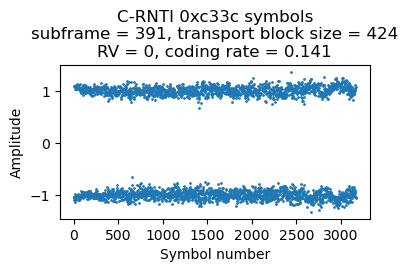

In [209]:
crnti_decode(391, np.arange(36, 48), 0xc33c, 424).hex()

'25271f010d8605e838c72e8e33bafcaf4b5e7fbf39d9b569bc56c3d9ea0fe492b574846eb20f45c29d130b2febc7f19317c1be3d53'

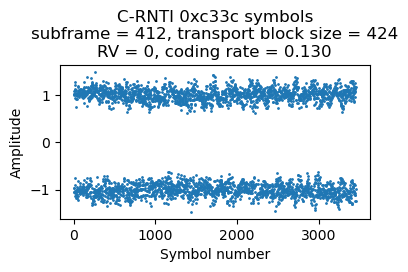

In [210]:
crnti_decode(412, np.arange(36, 48), 0xc33c, 424).hex()

'25271f010e86067c050c17fb460ab7b63bed9dd6599dd943d026c527c2c8c11297988a69cb4e52d1f39e82eaee9ba32302df1bf327'

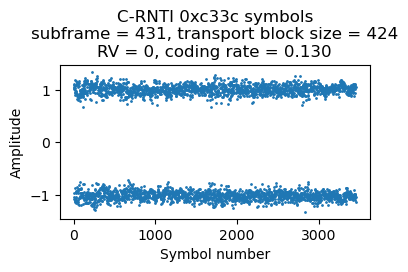

In [211]:
crnti_decode(431, np.arange(36, 48), 0xc33c, 424).hex()

'25271f010f8607b5e8c723a60549fad5b7e03fd51ce4f7712b772ad6a616a4ec8fa21ba20a54a8b0bdbc1caf1bd3853c5e660e2eab'

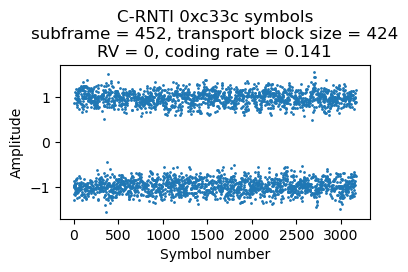

In [212]:
crnti_decode(452, np.arange(36, 48), 0xc33c, 424).hex()

'25271f01108608c3491a5c839a721cd671d0801e315b020dfaced1b21700cc5ff18e2b9184f406a5cb82fc6b1d49caff8f1a6f6479'

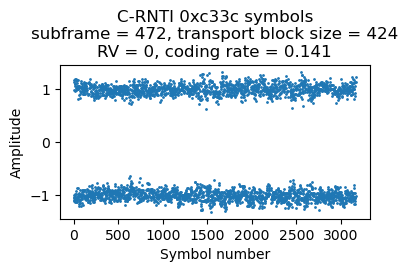

In [213]:
crnti_decode(472, np.arange(36, 48), 0xc33c, 424).hex()

### QAM64 PDSCH

In [214]:
qam64_constellation = np.array([
    3 + 1j*3, 3 + 1j*1, 1 + 1j*3, 1 + 1j*1, 3 + 1j*5, 3 + 1j*7, 1 + 1j*5, 1 + 1j*7,
    5 + 1j*3, 5 + 1j*1, 7 + 1j*3, 7 + 1j*1, 5 + 1j*5, 5 + 1j*7, 7 + 1j*5, 7 + 1j*7,
    3 - 1j*3, 3 - 1j*1, 1 - 1j*3, 1 - 1j*1, 3 - 1j*5, 3 - 1j*7, 1 - 1j*5, 1 - 1j*7,
    5 - 1j*3, 5 - 1j*1, 7 - 1j*3, 7 - 1j*1, 5 - 1j*5, 5 - 1j*7, 7 - 1j*5, 7 - 1j*7,
    -3 + 1j*3, -3 + 1j*1, -1 + 1j*3, -1 + 1j*1, -3 + 1j*5, -3 + 1j*7, -1 + 1j*5, -1 + 1j*7,
    -5 + 1j*3, -5 + 1j*1, -7 + 1j*3, -7 + 1j*1, -5 + 1j*5, -5 + 1j*7, -7 + 1j*5, -7 + 1j*7,
    -3 - 1j*3, -3 - 1j*1, -1 - 1j*3, -1 - 1j*1, -3 - 1j*5, -3 - 1j*7, -1 - 1j*5, -1 - 1j*7,
    -5 - 1j*3, -5 - 1j*1, -7 - 1j*3, -7 - 1j*1, -5 - 1j*5, -5 - 1j*7, -7 - 1j*5, -7 - 1j*7]) / np.sqrt(42)

def llr_demod(symbols, noise_sigma, constellation):
    dists = -np.abs(symbols - constellation[:, np.newaxis]) / (2 * noise_sigma**2)
    bits_per_symbol = round(np.log2(len(constellation)))
    llrs = np.empty((symbols.size, bits_per_symbol))
    for j in range(bits_per_symbol):
        is_one = np.where((np.arange(len(constellation)) >> (bits_per_symbol - 1 - j)) & 1)[0]
        llrs[:, j] = (
            functools.reduce(maxss, (dists[k] for k in range(len(constellation)) if (k >> (bits_per_symbol - 1 - j)) & 1 == 0))
            - functools.reduce(maxss, (dists[k] for k in range(len(constellation)) if (k >> (bits_per_symbol - 1 - j)) & 1 == 1)))
    return llrs.ravel()

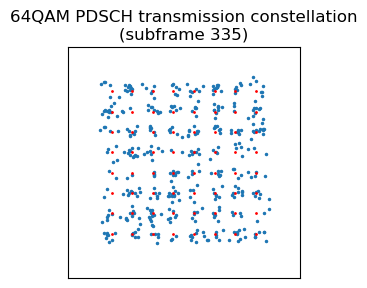

In [215]:
qam64_subframe = 335
qam64_syms = pdsch_symbols(qam64_subframe, np.arange(36, 39), equalization=functools.partial(tm4, precoding=1))
plt.figure(figsize=(3, 3))
plt.plot(qam64_syms.real, qam64_syms.imag, '.', markersize=3, color='C0')
plt.plot(qam64_constellation.real, qam64_constellation.imag, '.', markersize=2, color='red')
plt.xlim((-1.75, 1.75))
plt.ylim((-1.75, 1.75))
plt.xticks([])
plt.yticks([])
plt.title(f'64QAM PDSCH transmission constellation\n(subframe {qam64_subframe})');

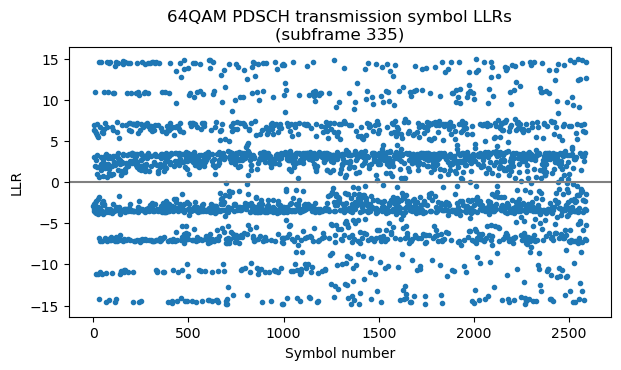

In [216]:
qam64_llrs = llr_demod(qam64_syms, 0.2, qam64_constellation)
plt.plot(qam64_llrs, '.')
plt.axhline(y=0, color='grey')
plt.title(f'64QAM PDSCH transmission symbol LLRs\n(subframe {qam64_subframe})')
plt.xlabel('Symbol number')
plt.ylabel('LLR');

In [217]:
qam64_rnti = 0xcee3
qam64_q = 0
ns_half = ns_pcfich[qam64_subframe] // 2
scrambling_seq = c_seq(qam64_rnti * 2**14 + qam64_q * 2**13 + ns_half * 2**9 + pci, qam64_llrs.size) 
qam64_descrambled = qam64_llrs * (1 - 2*scrambling_seq.astype('float'))

'2380bd1f983f1d1a56cde6a03f2800120f91e2598b09b5154e16820525c062e9444eeaa618d8a3d97f0a6f62886aa52e7aa4f936e2f04267495073bc03ffaf6c90928b4c8207fc19128bc9f183377a42a1aaece0ad33c8a02fc1978004d4fca5045f0f1c1fd0bf5860ba0d0baa3e34ad897f9056dd0a90c662ff0a46800d3e4ad77ca2058796252c95437ceb4f99c182e04d09f5345e65e23fca77cb011903ce5eb5c44c36871c01e6b3a00385cb07a5ff8587d6569081e28fd4477a60b353712b'

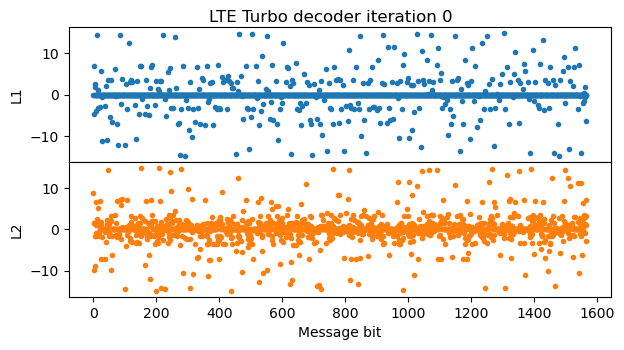

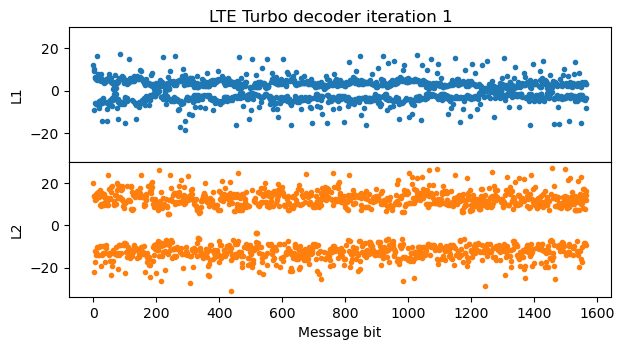

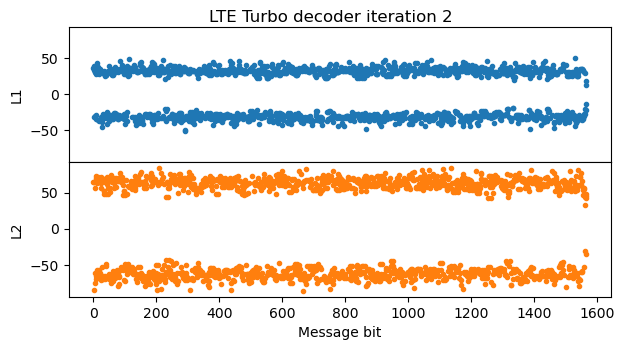

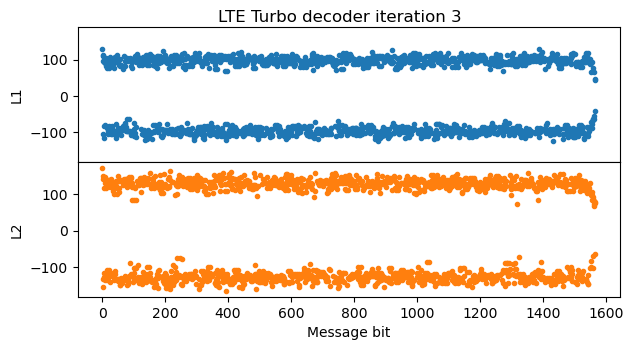

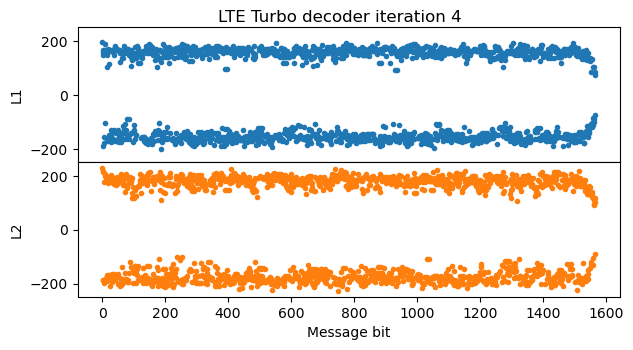

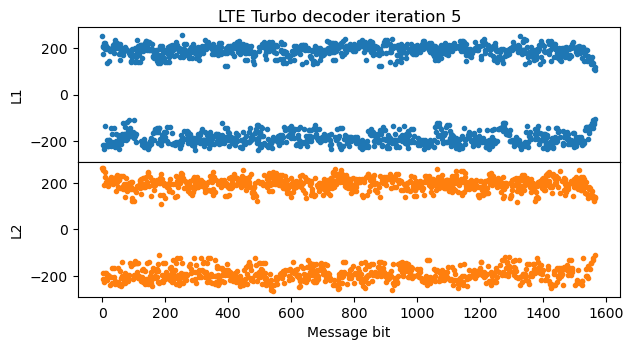

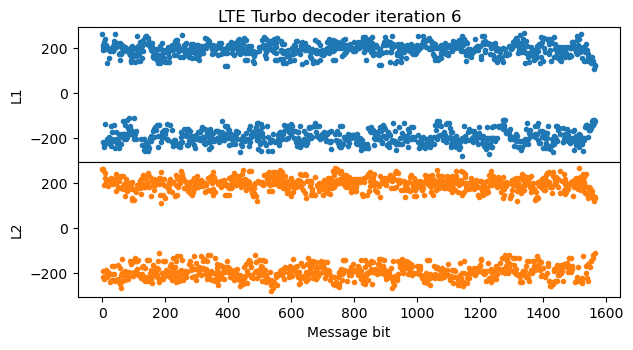

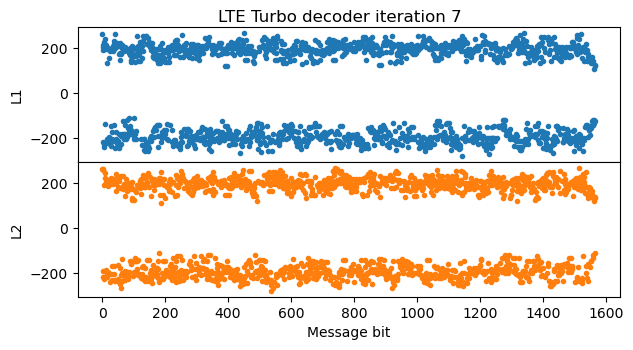

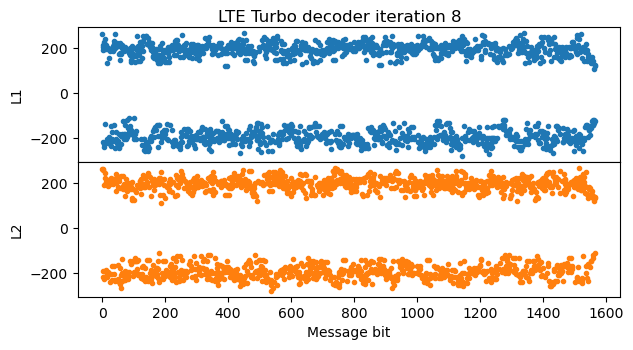

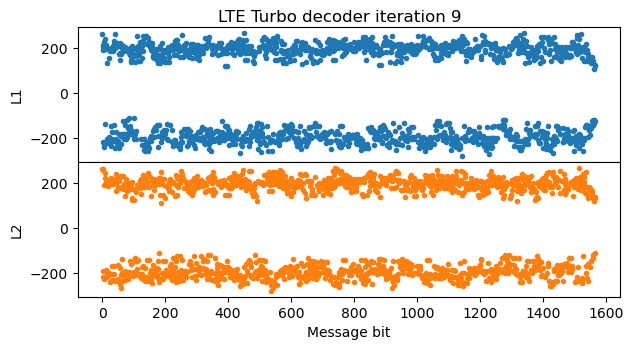

In [218]:
qam64_tbs = 1544
qam64_tb = decode_transport_block([(qam64_descrambled, 2)], qam64_tbs, do_plots=True)
store_mac_pdu(qam64_subframe, qam64_tb, qam64_rnti)
qam64_tb.hex()

In [219]:
qam64_coding_rate = (qam64_tbs + 24) / qam64_llrs.size
qam64_coding_rate

0.6049382716049383

## Two-codeword TM4 PDSCH (decoded with a single antenna)

'23809d1f9beffd84ccb6b188ea9b91aaaf56a2749299174bff9fad9731da6460511c81b89706d7cc443a30a2b67df3aec74f90800173d804b8c335b232132689c4fa782df4bcb07392007fa670f033d11fd65fcbc59f2b8618c2a6d46a7e32fe12e1aaad1c3b074eaeeb8a5787a23a46daaed229f146a5fa4f7bcde3cc3e1cbafdb3f1f331f183d40c3c4f1bb5aeb933ba2673ea4e3f264d132d1495ce551d630f'

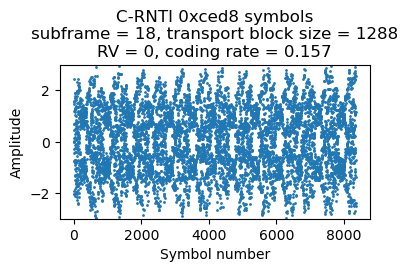

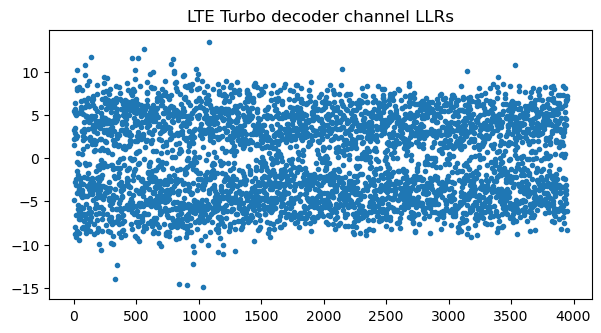

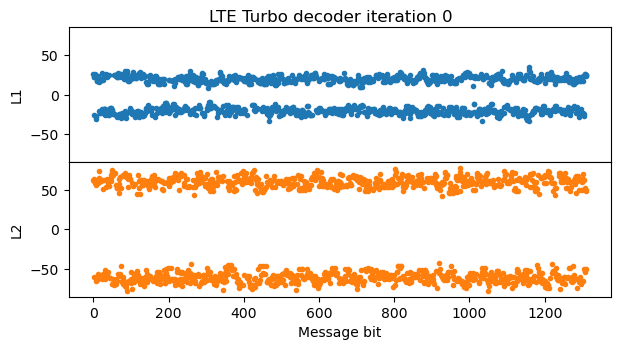

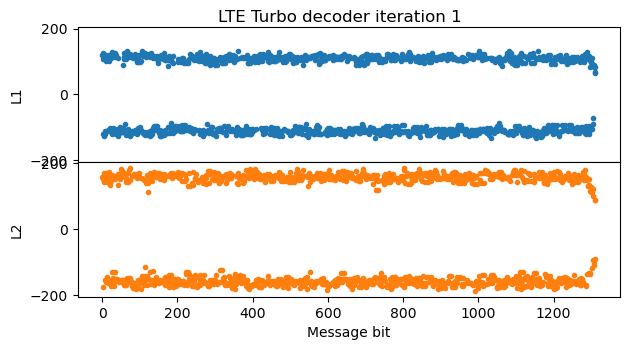

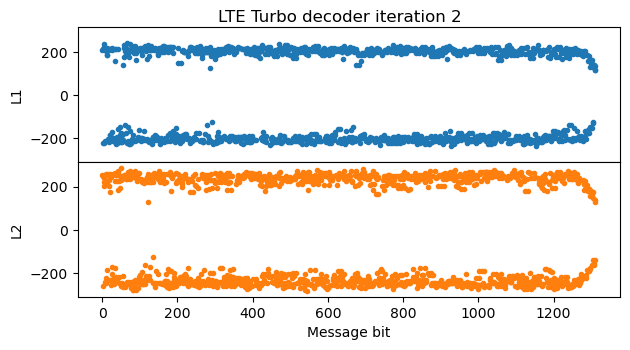

...

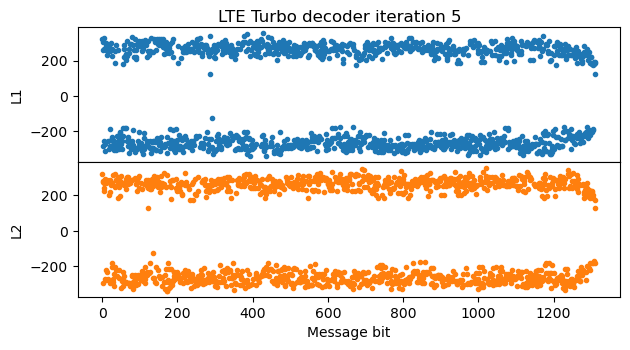

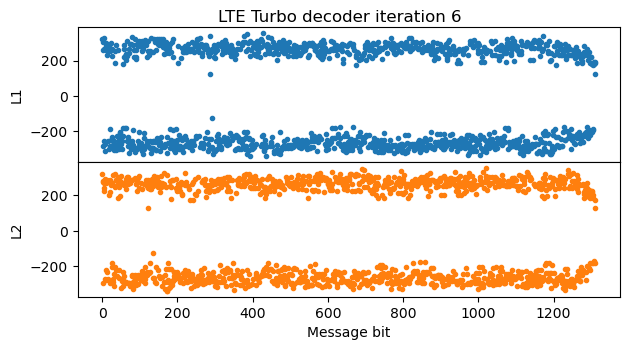

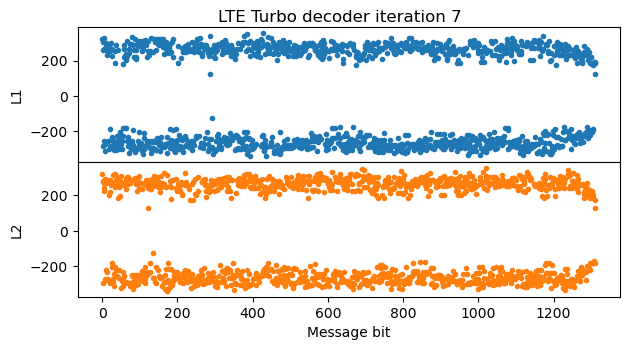

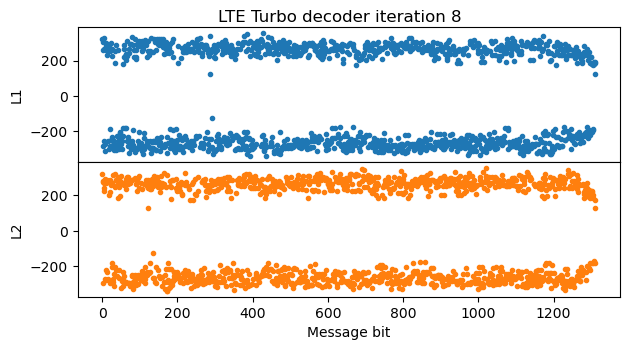

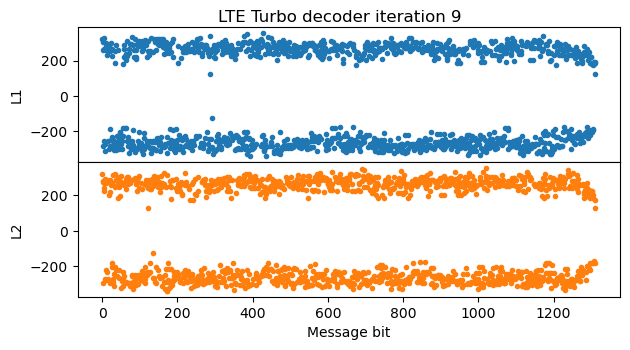

In [220]:
codeword0 = crnti_decode(18, np.concatenate((np.arange(15), np.arange(36, 50))), 0xced8, 1288,
                         equalization=functools.partial(tm4, precoding=1, scale=np.sqrt(2)), noise_sigma=1, q=0,
                         plot_channel_LLRs=True, do_plots=True)
codeword0.hex()

/tmp/ipykernel_633585/2157787648.py:16: UserWarning: Decoding failure
  warnings.warn('Decoding failure')


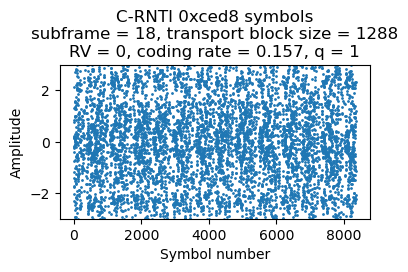

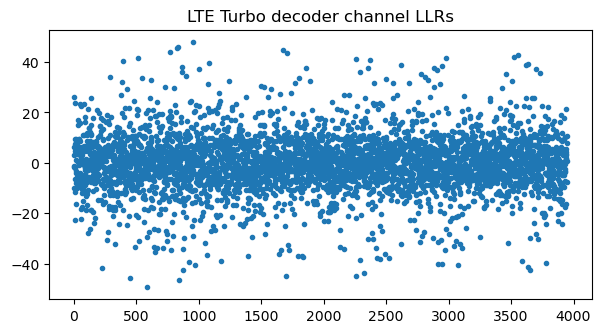

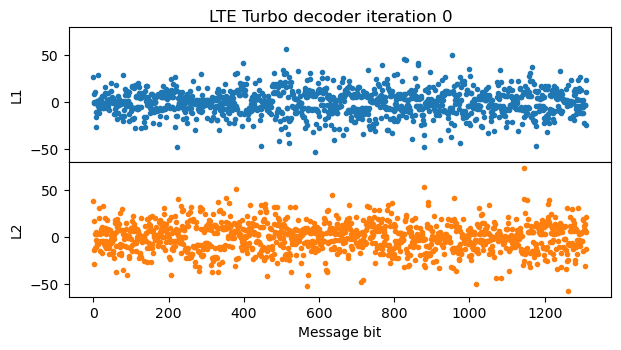

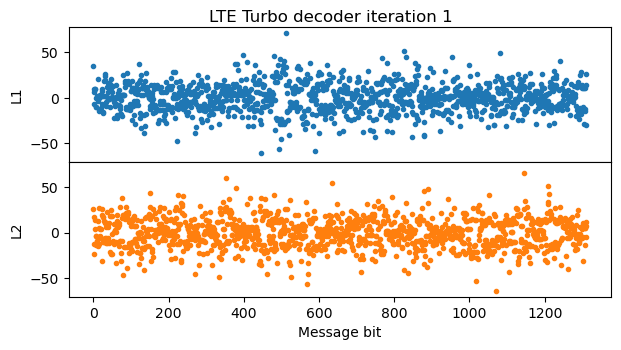

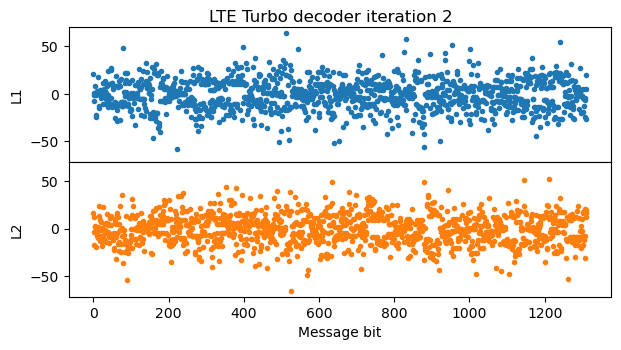

...

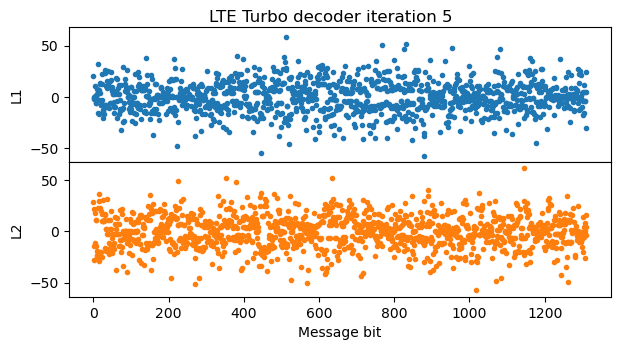

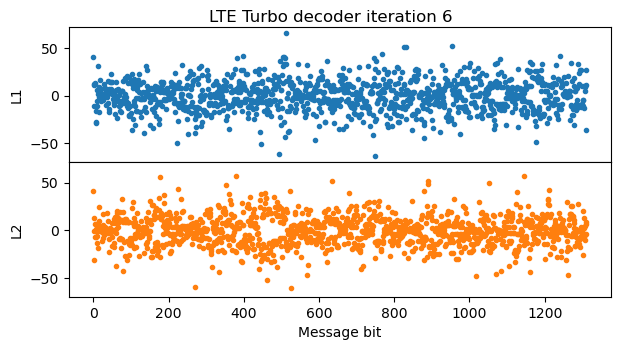

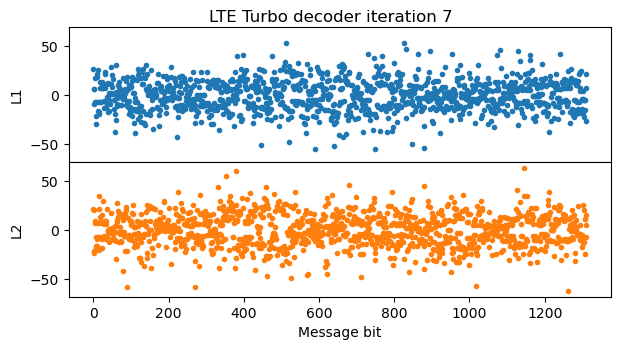

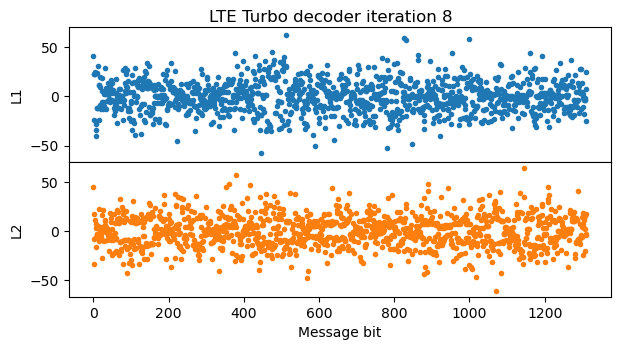

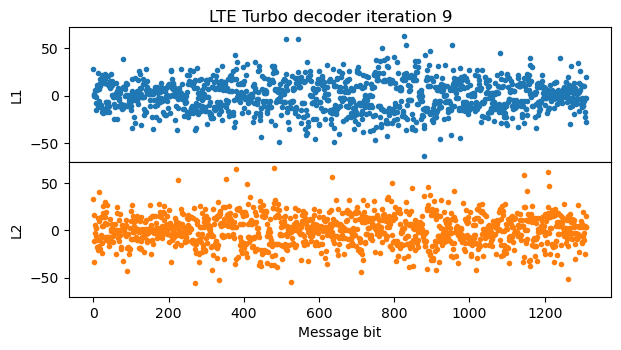

In [221]:
crnti_decode(18, np.concatenate((np.arange(15), np.arange(36, 50))), 0xced8, 1288,
             equalization=functools.partial(tm4, precoding=2, scale=np.sqrt(2)), noise_sigma=1, q=1,
             plot_channel_LLRs=True, do_plots=True)

In [222]:
def turbo_encode(message):
    message = np.frombuffer(message, 'uint8')
    crc = crc24a(message)
    message = np.concatenate((message, np.array([crc >> 16, (crc >> 8) & 0xff, crc & 0xff], 'uint8')))
    assert crc24a(message) == 0
    message = np.unpackbits(message)
    message_perm = message[turbo_permutation(message.size)]
    reg0 = 0
    reg1 = 0
    d0 = np.empty(message.size + 4, 'uint8')
    d0[:message.size] = message
    d1 = np.empty_like(d0)
    d2 = np.empty_like(d0)
    for j in range(message.size):
        fb0 = (reg0 ^ (reg0 >> 1)) & 1
        fb1 = (reg1 ^ (reg1 >> 1)) & 1
        in0 = fb0 ^ message[j]
        in1 = fb1 ^ message_perm[j]
        d1[j] = (in0 ^ reg0 ^ (reg0 >> 2)) & 1
        d2[j] = (in1 ^ reg1 ^ (reg1 >> 2)) & 1
        reg0 = (in0 << 2) | (reg0 >> 1)
        reg1 = (in1 << 2) | (reg1 >> 1)
    # trellis termination
    x = np.empty(3, 'uint8')
    z = np.empty_like(x)
    xprime = np.empty_like(x)
    zprime = np.empty_like(x)
    for j in range(3):
        fb0 = (reg0 ^ (reg0 >> 1)) & 1
        fb1 = (reg1 ^ (reg1 >> 1)) & 1
        x[j] = fb0
        xprime[j] = fb1
        z[j] = (reg0 ^ (reg0 >> 2)) & 1
        zprime[j] = (reg1 ^ (reg1 >> 2)) & 1
        reg0 >>= 1
        reg1 >>= 1
    d0[message.size] = x[0]
    d1[message.size] = z[0]
    d2[message.size] = x[1]
    d0[message.size + 1] = z[1]
    d1[message.size + 1] = x[2]
    d2[message.size + 1] = z[2]
    d0[message.size + 2] = xprime[0]
    d1[message.size + 2] = zprime[0]
    d2[message.size + 2] = xprime[1]
    d0[message.size + 3] = zprime[1]
    d1[message.size + 3] = xprime[2]
    d2[message.size + 3] = zprime[2]
    return d0, d1, d2

def rate_match(turbo_output, E, rv_idx=0):
    return np.array([turbo_output[k[0]][k[1]] for k in
                     rate_matching_turbo(turbo_output[0].size, E, 0)])

qam16_constellation = np.array([1 + 1j, 1 + 3j, 3 + 1j, 3 + 3j,
                                1 - 1j, 1 - 3j, 3 - 1j, 3 - 3j,
                                -1 + 1j, -1 + 3j, -3 + 1j, -3 + 3j,
                                -1 - 1j, -1 - 3j, -3 - 1j, -3 - 3j]) / np.sqrt(10)

qpsk_constellation = np.array([1 + 1j, 1 - 1j, -1 + 1j, -1 - 1j]) / np.sqrt(2)

def pdsch_encode(message, subframe, rbs, rnti, rv_idx=0, q=0, constellation='QPSK'):
    bps = {'QPSK': 2, '16QAM': 4, '64QAM': 6}[constellation]
    const = {'QPSK': qpsk_constellation, '16QAM': qam16_constellation, '64QAM': qam64_constellation}[constellation]
    turbo_output = turbo_encode(message)
    E = bps * pdsch_symbols(subframe, rbs).size
    syms = rate_match(turbo_output, E, rv_idx=rv_idx)
    ns_half = ns_pcfich[subframe] // 2
    syms ^= c_seq(rnti * 2**14 + q * 2**13 + ns_half * 2**9 + pci, E)
    return const[np.packbits(syms.reshape(-1, bps), axis=1).ravel() >> (8 - bps)]

'2380881fb7f002f0b47ce92773f0fc9782d009f0b27f0270c8c4123b8492afdd6c72a9775f7117fd51c6dbf117e8de850c9dd935e9a7ba8f7b46edb1b811ddd03b80a43d0bbe8bdb96eb54cf81852df717d02560459c17d92f82c27a8c4d112c1133978be3cdd78d30d7b1e6697fec4d52be4234d09fd3b4586ad7d787b1e7309e1c4729f774471355af801b691dde97202c6b60f0967af0d35bcd482aaa6d8cb5'

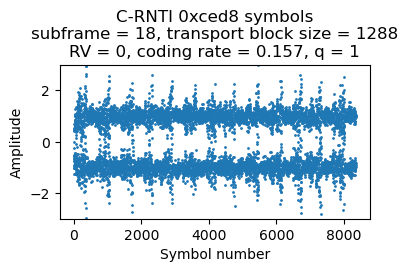

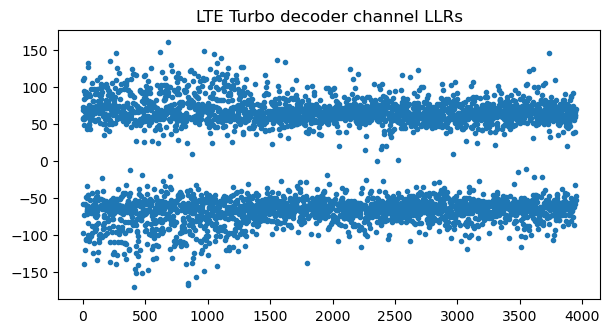

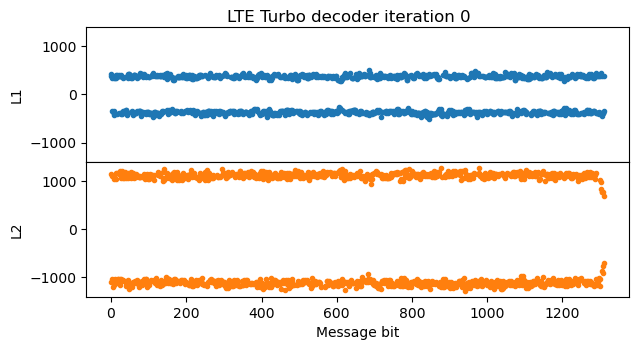

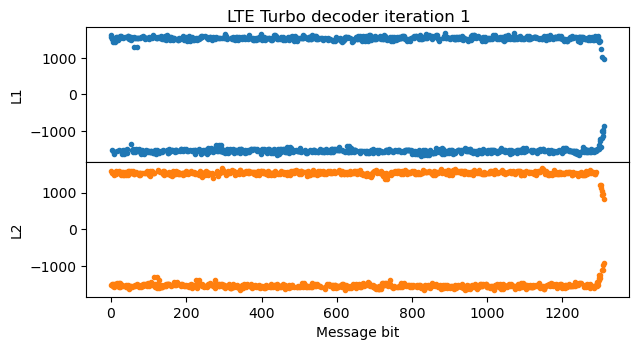

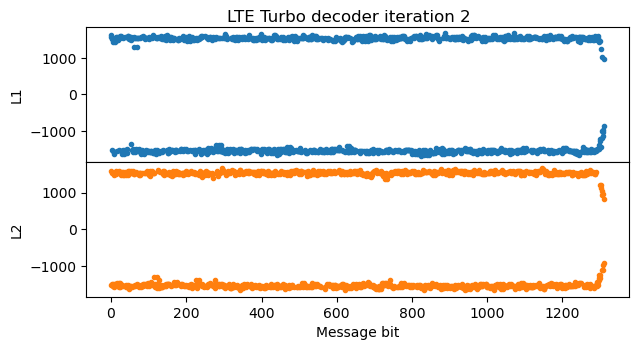

...

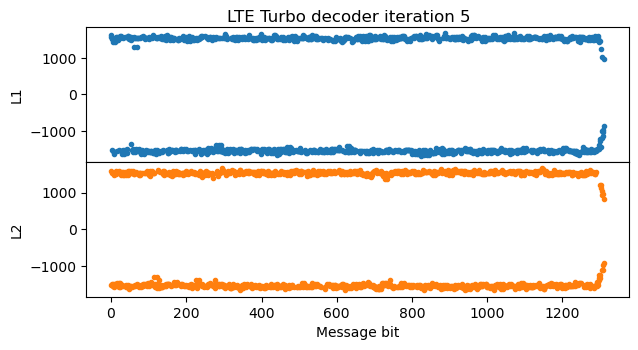

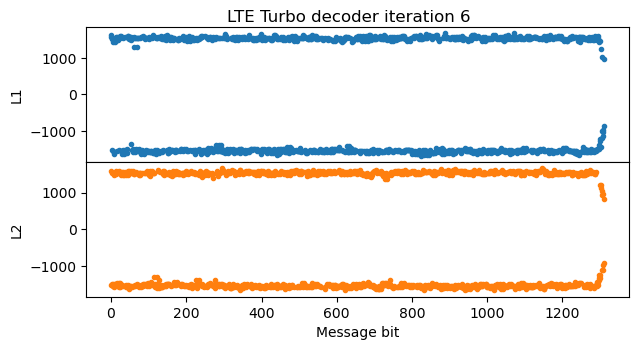

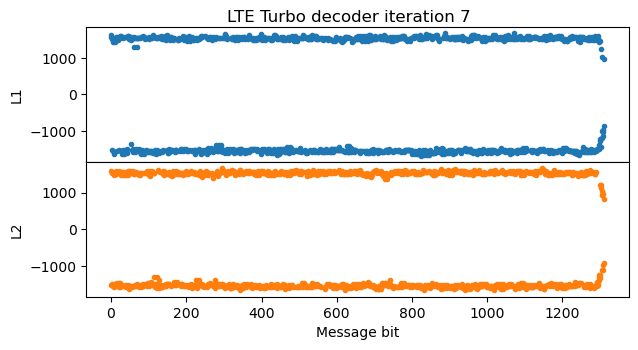

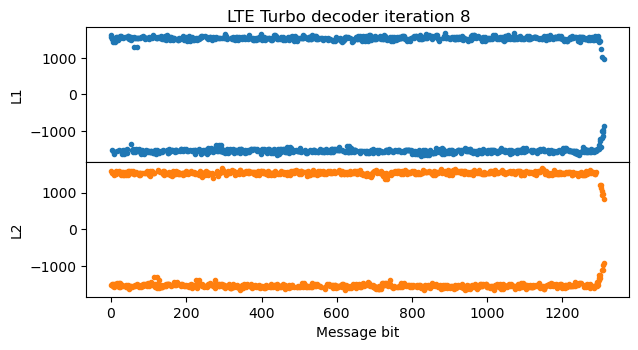

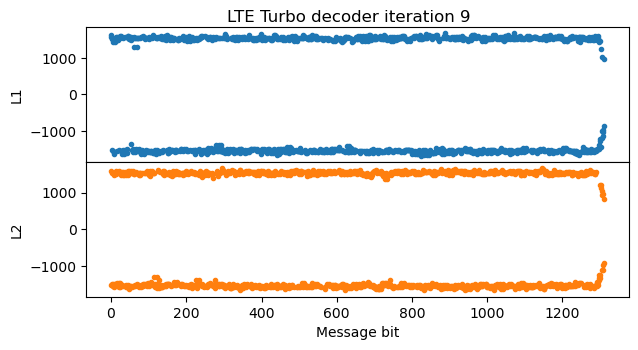

In [223]:
syms_codeword0 = pdsch_encode(codeword0, 18, np.concatenate((np.arange(15), np.arange(36, 50))), 0xced8)
_, syms_r0, syms_r1 = pdsch_symbols(18, np.concatenate((np.arange(15), np.arange(36, 50))), do_not_equalize=True)
codeword0_channel = syms_codeword0 * (syms_r0 + syms_r1) / np.sqrt(2)

crnti_decode(18, np.concatenate((np.arange(15), np.arange(36, 50))), 0xced8, 1288,
             equalization=functools.partial(tm4, precoding=2, scale=np.sqrt(2)), noise_sigma=0.25, q=1,
             plot_channel_LLRs=True, do_plots=True, cancel_symbols=codeword0_channel).hex()

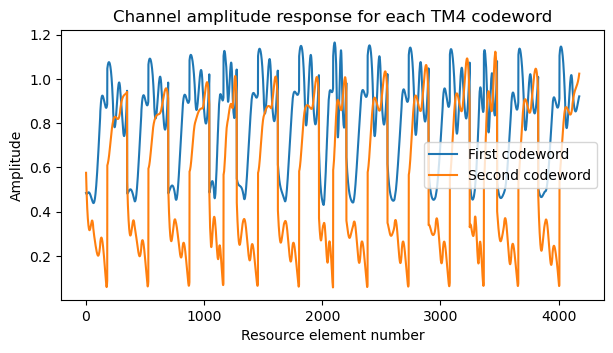

In [224]:
plt.plot(np.abs(syms_r0 + syms_r1), label='First codeword')
plt.plot(np.abs(syms_r0 - syms_r1), label='Second codeword')
plt.legend()
plt.title('Channel amplitude response for each TM4 codeword')
plt.xlabel('Resource element number')
plt.ylabel('Amplitude');

'23551f9bf5e0418f441cdd1da756b7ababba8cc808024d10101495519505b65852cf201c0a2b4f43ea2a7b2ff883d2790f4c5dca1cae719a8334ce6e03575c5a2e59cde660e0b3c233b9770c63a4fd5fce91ddad47f5fc7a2a'

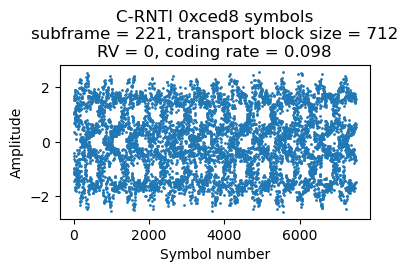

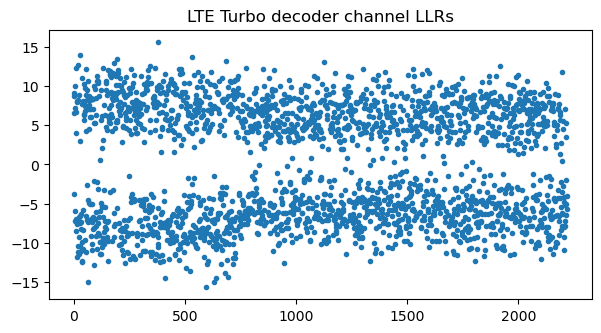

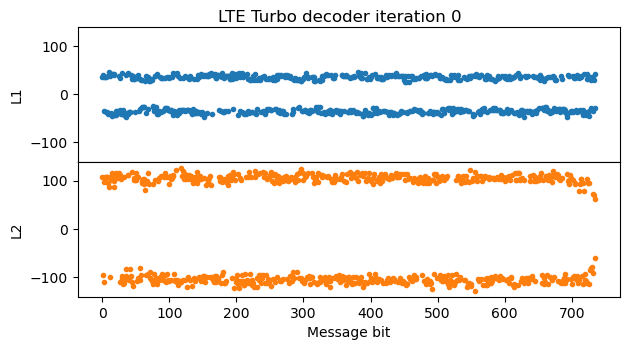

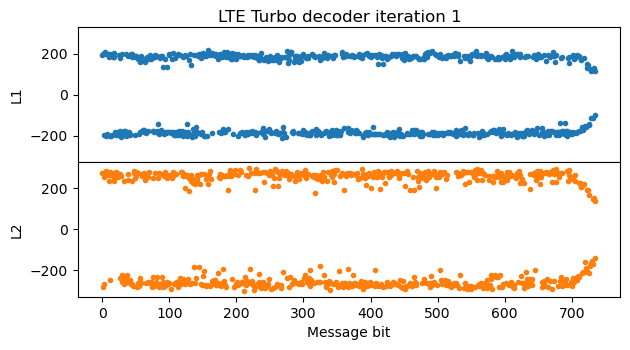

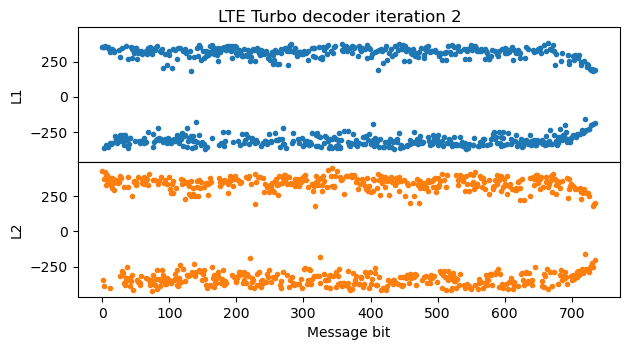

...

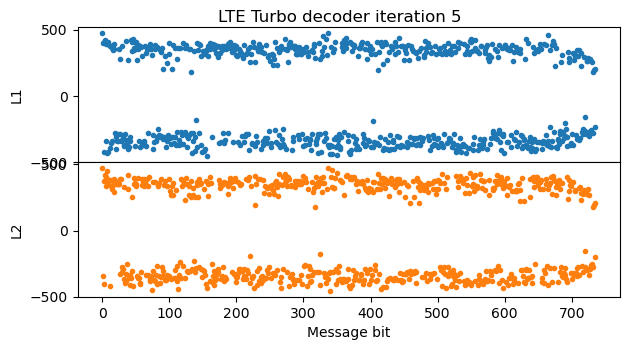

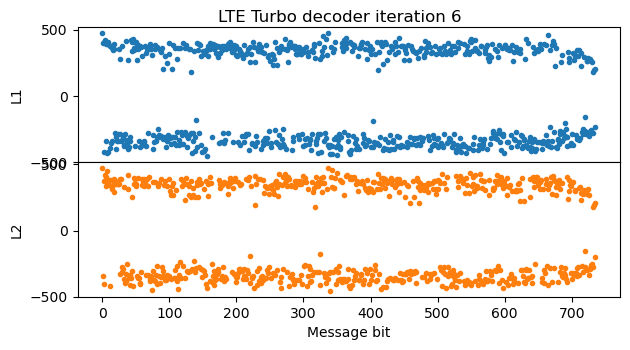

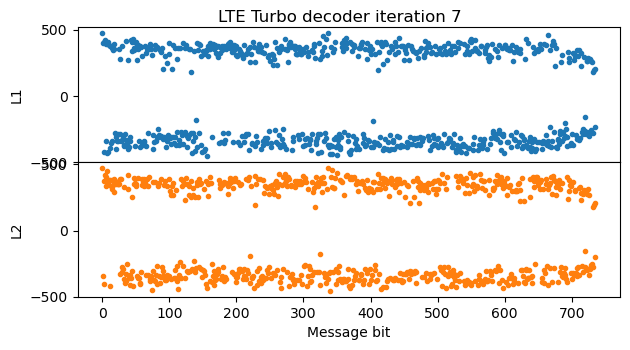

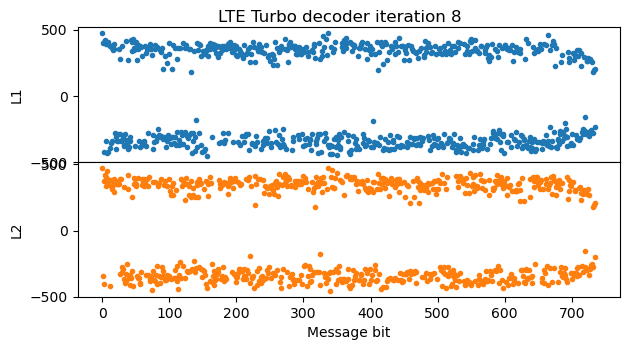

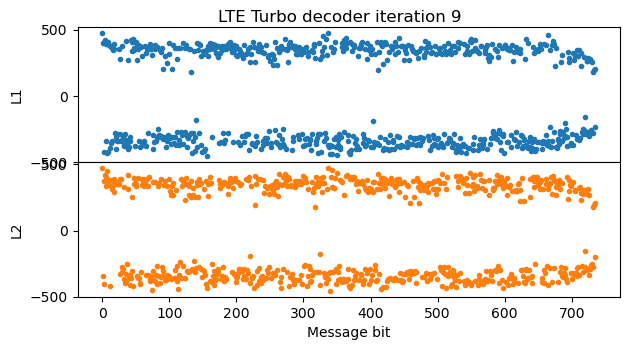

In [225]:
codeword0 = crnti_decode(221, np.concatenate((np.arange(12), np.arange(36, 50))), 0xced8, 712,
                         equalization=functools.partial(tm4, precoding=3, scale=np.sqrt(2)), noise_sigma=1, q=0,
                         plot_channel_LLRs=True, do_plots=True)
codeword0.hex()

/tmp/ipykernel_633585/2157787648.py:16: UserWarning: Decoding failure
  warnings.warn('Decoding failure')


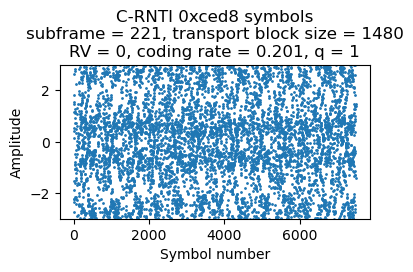

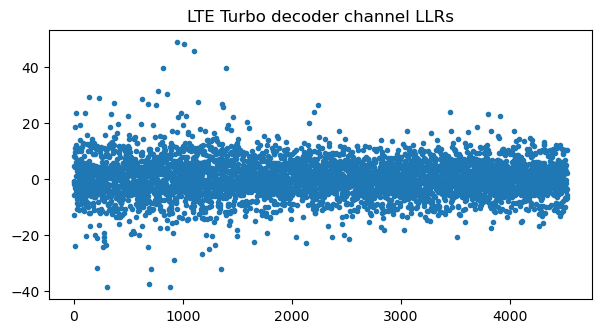

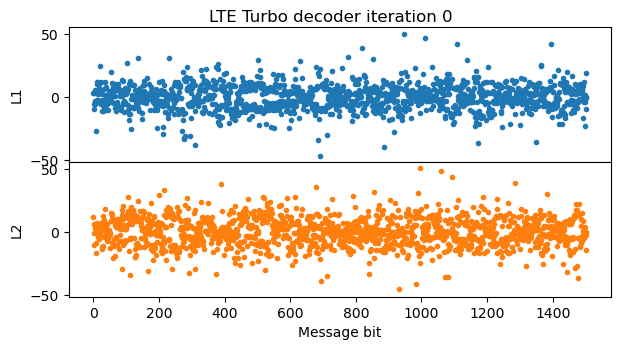

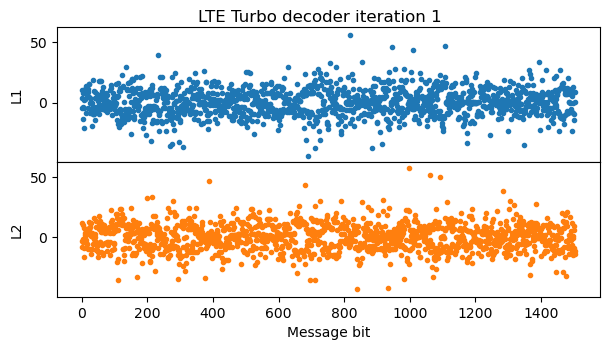

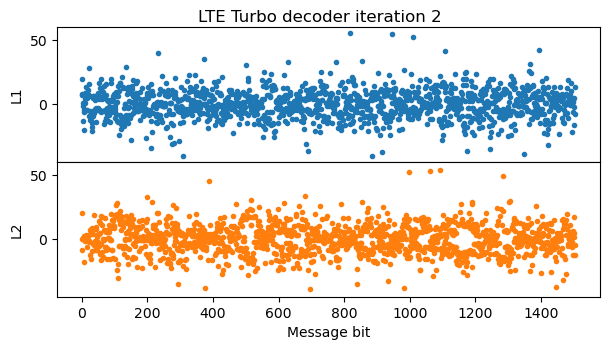

...

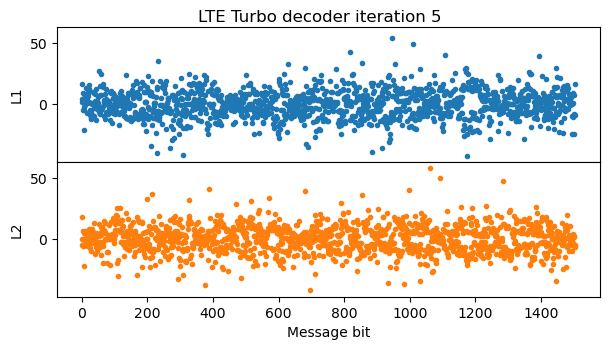

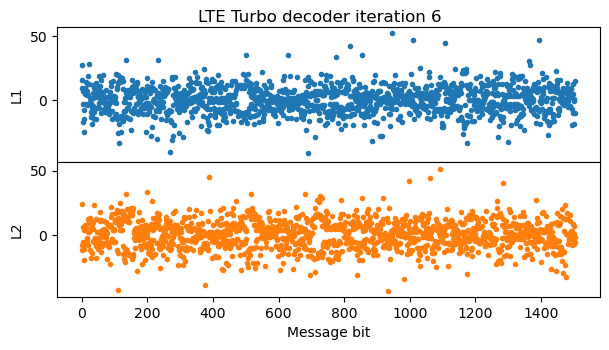

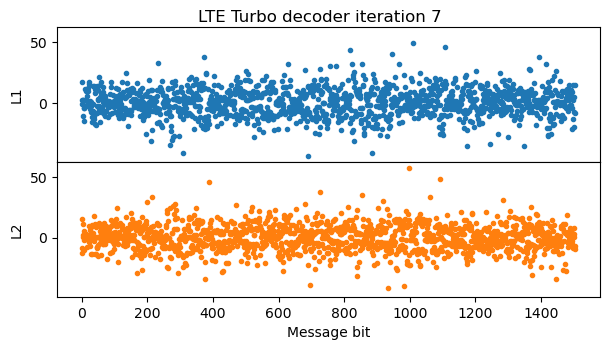

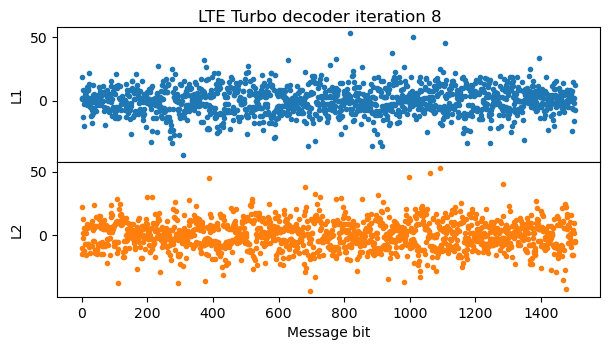

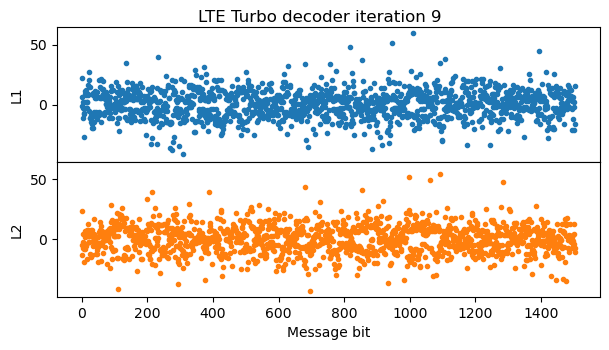

In [226]:
crnti_decode(221, np.concatenate((np.arange(12), np.arange(36, 50))), 0xced8, 1480,
             equalization=functools.partial(tm4, precoding=4, scale=np.sqrt(2)), noise_sigma=1, q=1,
             plot_channel_LLRs=True, do_plots=True)

'2380921fb7f603902acdca244f265926ed49db05ca168b3f776d1c75750d938dac26d68074b43eff4a53946871342a87b56c536c78cfbdc6581b0eae8f29eac60f8f7ea94ab7a3c15351eff944c08a2ff21b3abd3e079e1120a0fe4b0f1f9a5e180bef6f352f278988b6d8dc136f2cb137ec068dc69f85923d50b2d440b9616b8e0c64048bc0c0287aee83fd32614e3f269ed71e40c88ff9a7d7192bb047b9efb8ba186d83fb5f3b643060654c762fc8b27a713910238cfde0'

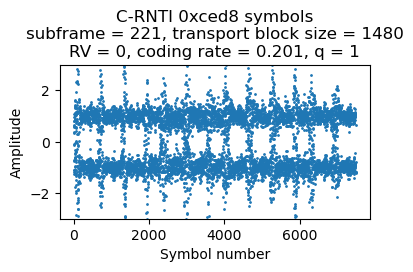

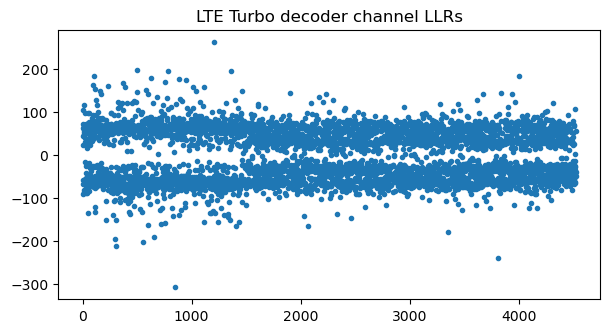

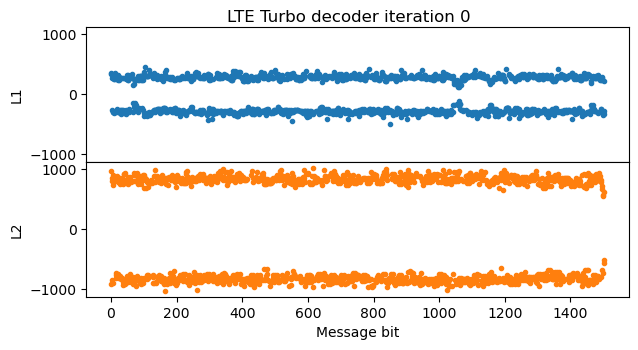

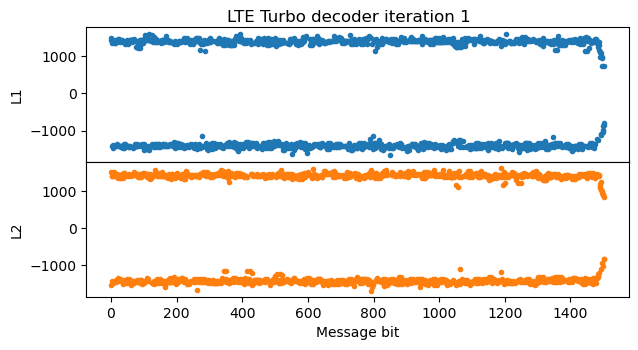

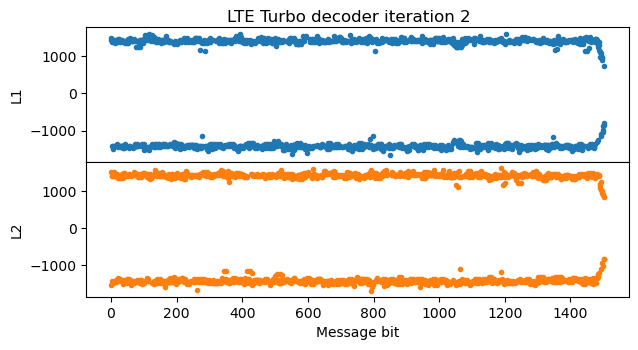

...

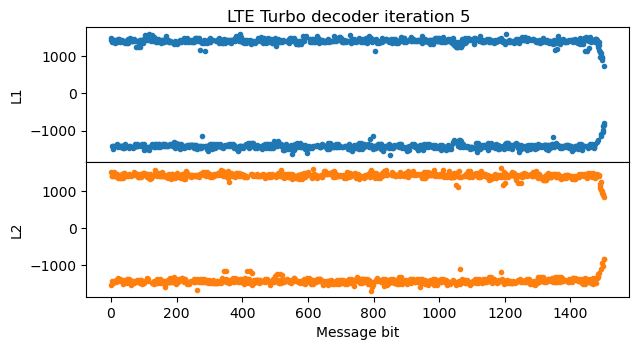

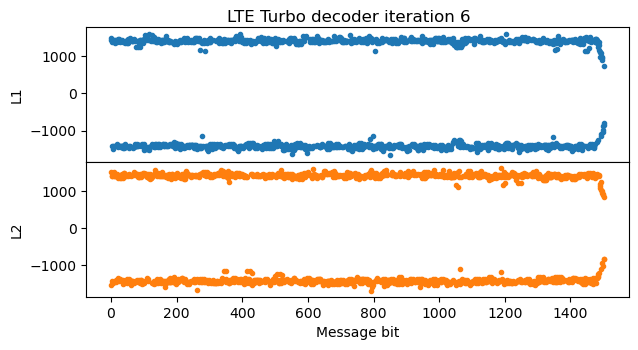

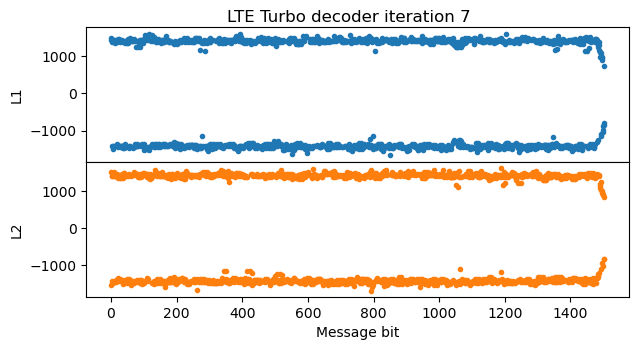

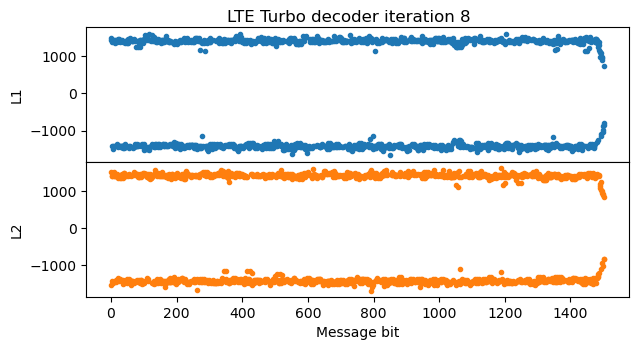

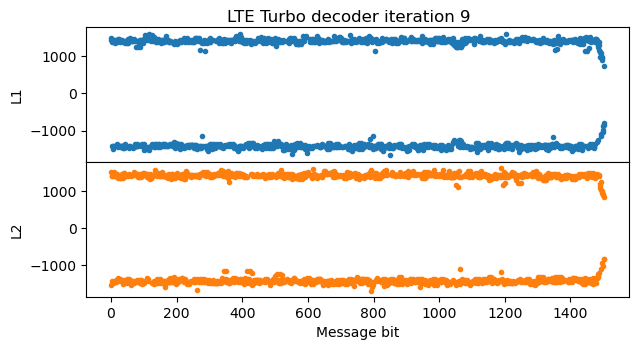

In [227]:
syms_codeword0 = pdsch_encode(codeword0, 221, np.concatenate((np.arange(12), np.arange(36, 50))), 0xced8)
_, syms_r0, syms_r1 = pdsch_symbols(221, np.concatenate((np.arange(12), np.arange(36, 50))), do_not_equalize=True)
codeword0_channel = syms_codeword0 * (syms_r0 + 1j*syms_r1) / np.sqrt(2)

crnti_decode(221, np.concatenate((np.arange(12), np.arange(36, 50))), 0xced8, 1480,
             equalization=functools.partial(tm4, precoding=4, scale=np.sqrt(2)), noise_sigma=0.25, q=1,
             plot_channel_LLRs=True, do_plots=True, cancel_symbols=codeword0_channel).hex()

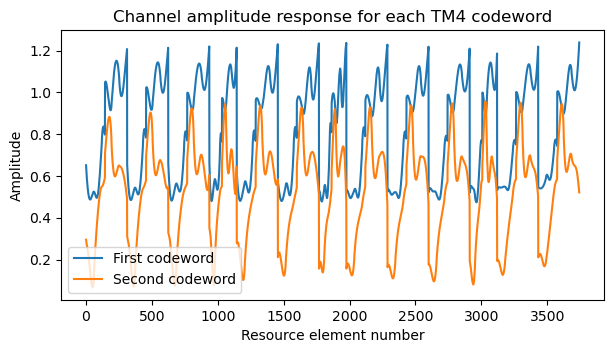

In [228]:
plt.plot(np.abs(syms_r0 + 1j*syms_r1), label='First codeword')
plt.plot(np.abs(syms_r0 - 1j*syms_r1), label='Second codeword')
plt.legend()
plt.title('Channel amplitude response for each TM4 codeword')
plt.xlabel('Resource element number')
plt.ylabel('Amplitude');

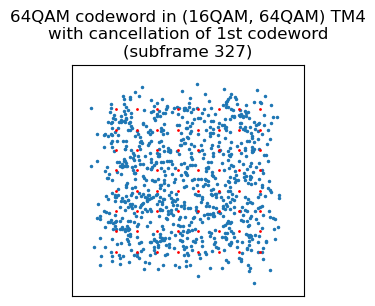

In [229]:
syms_codeword0 = pdsch_encode(qam64_tb, 327, np.arange(36, 42), 0xcee3, constellation='16QAM')
_, syms_r0, syms_r1 = pdsch_symbols(327, np.arange(36, 42), do_not_equalize=True)
codeword0_channel = syms_codeword0 * (syms_r0 + syms_r1) / np.sqrt(2)

syms_codeword1 = pdsch_symbols(327, np.arange(36, 42), equalization=functools.partial(tm4, precoding=2, scale=np.sqrt(2)),
                               cancel_symbols=codeword0_channel)
plt.figure(figsize=(3, 3))
plt.plot(syms_codeword1.real, syms_codeword1.imag, '.', markersize=3, color='C0')
plt.plot(qam64_constellation.real, qam64_constellation.imag, '.', markersize=2, color='red')
plt.xlim((-1.75, 1.75))
plt.ylim((-1.75, 1.75))
plt.xticks([])
plt.yticks([])
plt.title(f'64QAM codeword in (16QAM, 64QAM) TM4\nwith cancellation of 1st codeword\n(subframe 327)');

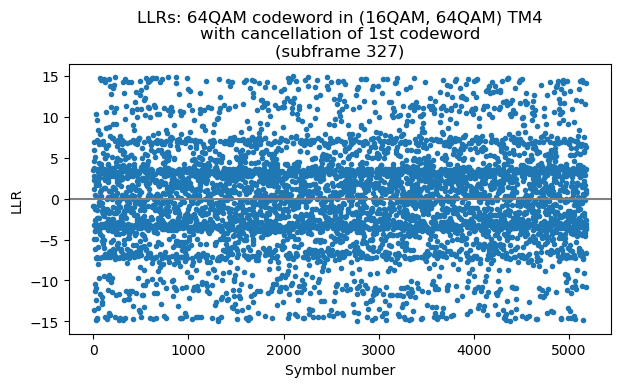

In [230]:
qam64_llrs = llr_demod(syms_codeword1, 0.2, qam64_constellation)
plt.plot(qam64_llrs, '.')
plt.axhline(y=0, color='grey')
plt.title(f'LLRs: 64QAM codeword in (16QAM, 64QAM) TM4\nwith cancellation of 1st codeword\n(subframe 327)')
plt.xlabel('Symbol number')
plt.ylabel('LLR');

'2380e61f984018f77568b834e7195869427249991992e6464852e3f6a69a216ea98b7f43a5af79f991fa1409705ea80bebd2e49baeb75c9758bdc45192f08ea40ac76620aa8961493c4823f47a9eb484d8e090751cb0e988a8d505daca51b9727f3c3ce669e64e5d2a8bbcb480a1d3c425b37e0bce66fe0a057324ce42a3bcf04b0ec82ef93fde90746af6c75b32174f5353868b42fe7651a35c0373831d3e1c6181fa6dfd6c218b33d3f74d3d9817e3b3238e974abf4a4bd421244e57a5fd2d06c7893cd010e4b2a23cfbe2a4a9ac28d5ec24c5a55c08f7cf53305ecca170e71c2261fbe101520c7048a806b92cf81dc9'

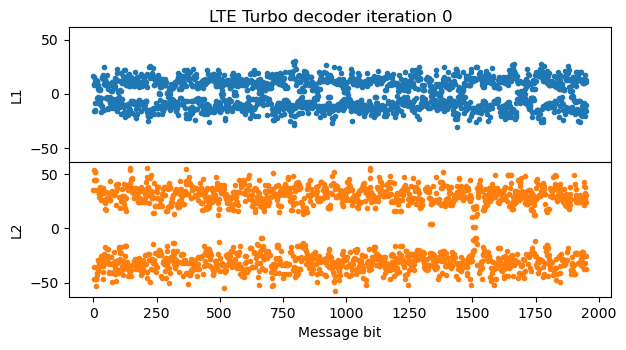

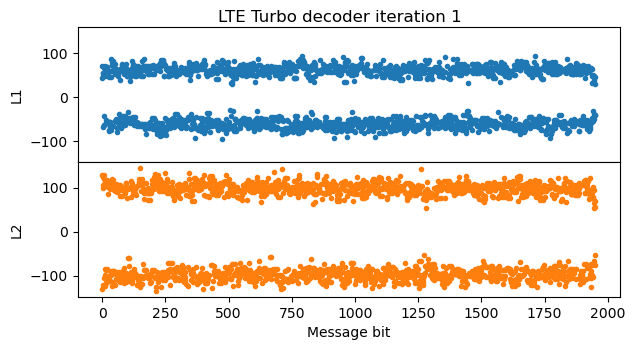

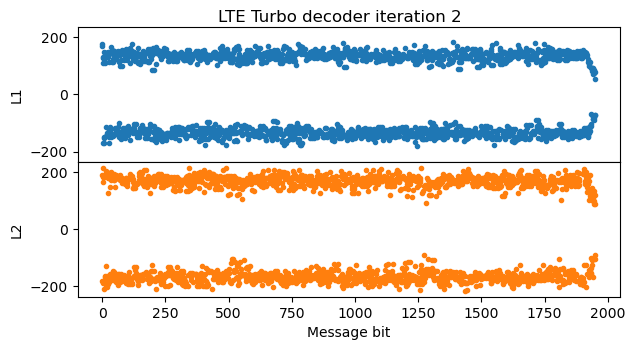

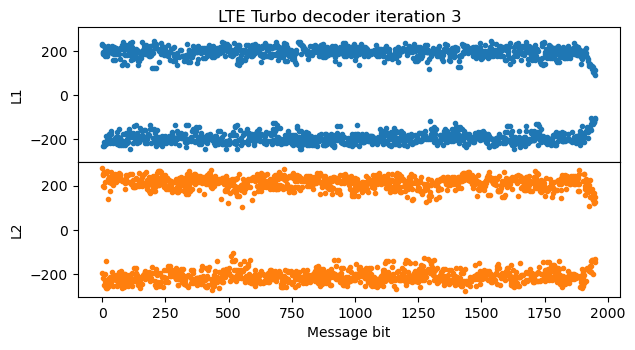

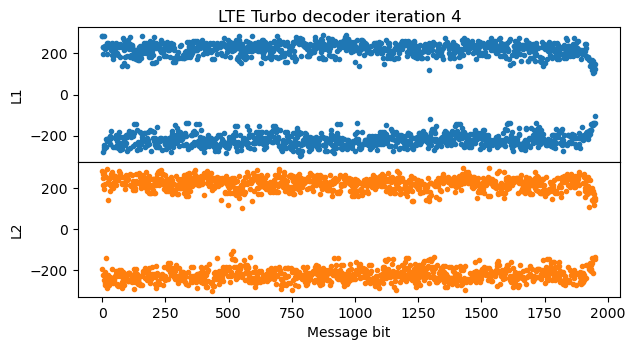

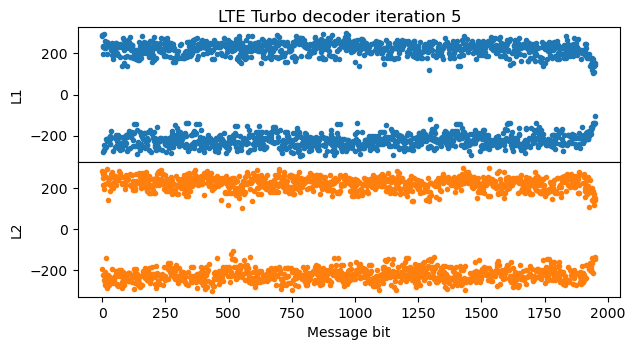

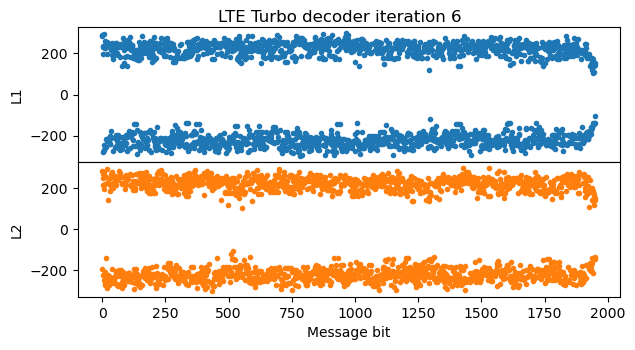

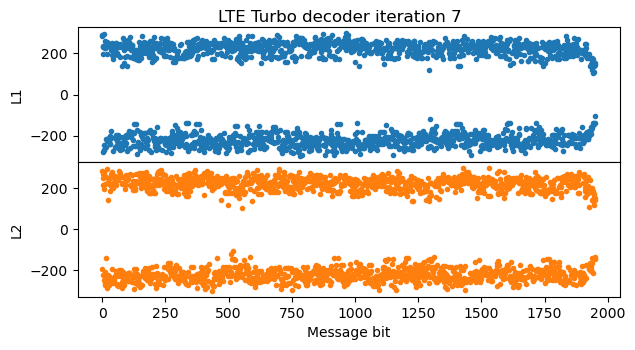

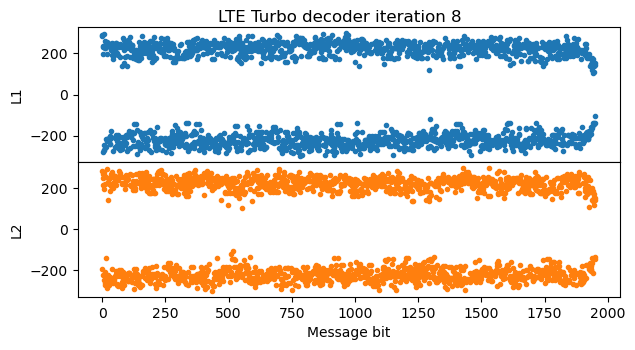

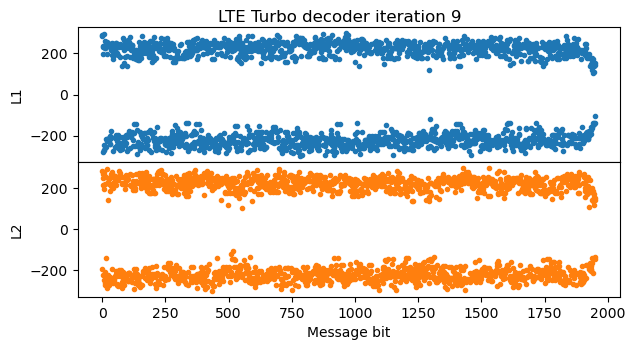

In [231]:
ns_half = ns_pcfich[327] // 2
scrambling_seq = c_seq(qam64_rnti * 2**14 + 1 * 2**13 + ns_half * 2**9 + pci, qam64_llrs.size) 
qam64_descrambled = qam64_llrs * (1 - 2*scrambling_seq.astype('float'))

codeword1_tb = decode_transport_block([(qam64_descrambled, 0)], 1928, do_plots=True)
codeword1_tb.hex()

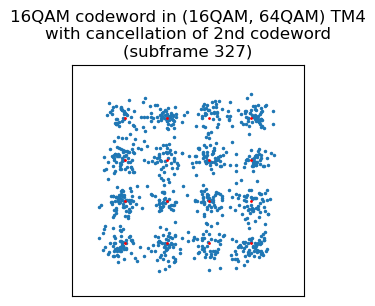

In [232]:
syms_codeword1_reencode = pdsch_encode(codeword1_tb, 327, np.arange(36, 42), 0xcee3, constellation='64QAM', q=1)
codeword1_channel = syms_codeword1_reencode * (syms_r0 - syms_r1) / np.sqrt(2)

syms_codeword0_noisy = pdsch_symbols(327, np.arange(36, 42), equalization=functools.partial(tm4, precoding=1, scale=np.sqrt(2)),
                                     cancel_symbols=codeword1_channel)
plt.figure(figsize=(3, 3))
plt.plot(syms_codeword0_noisy.real, syms_codeword0_noisy.imag, '.', markersize=3, color='C0')
plt.plot(qam16_constellation.real, qam16_constellation.imag, '.', markersize=2, color='red')
plt.xlim((-1.75, 1.75))
plt.ylim((-1.75, 1.75))
plt.xticks([])
plt.yticks([])
plt.title(f'16QAM codeword in (16QAM, 64QAM) TM4\nwith cancellation of 2nd codeword\n(subframe 327)');

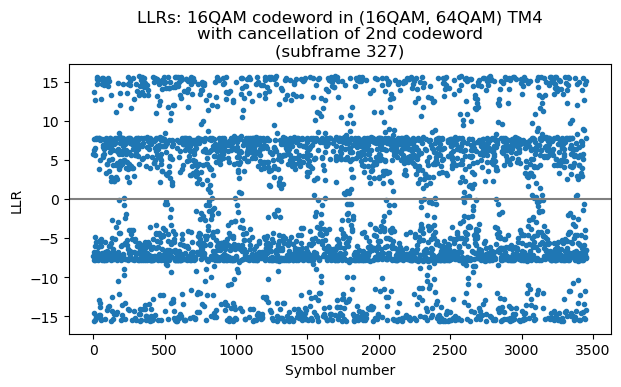

In [233]:
qam16_llrs = llr_demod(syms_codeword0_noisy, 0.2, qam16_constellation)
plt.plot(qam16_llrs, '.')
plt.axhline(y=0, color='grey')
plt.title(f'LLRs: 16QAM codeword in (16QAM, 64QAM) TM4\nwith cancellation of 2nd codeword\n(subframe 327)')
plt.xlabel('Symbol number')
plt.ylabel('LLR');

'2380bd1f983f1d1a56cde6a03f2800120f91e2598b09b5154e16820525c062e9444eeaa618d8a3d97f0a6f62886aa52e7aa4f936e2f04267495073bc03ffaf6c90928b4c8207fc19128bc9f183377a42a1aaece0ad33c8a02fc1978004d4fca5045f0f1c1fd0bf5860ba0d0baa3e34ad897f9056dd0a90c662ff0a46800d3e4ad77ca2058796252c95437ceb4f99c182e04d09f5345e65e23fca77cb011903ce5eb5c44c36871c01e6b3a00385cb07a5ff8587d6569081e28fd4477a60b353712b'

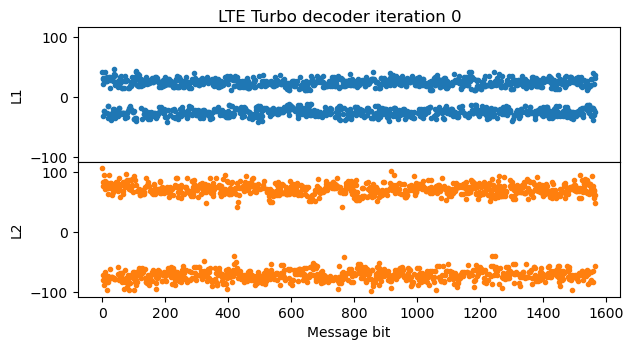

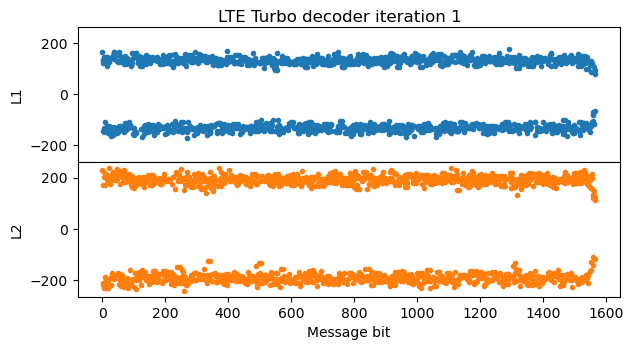

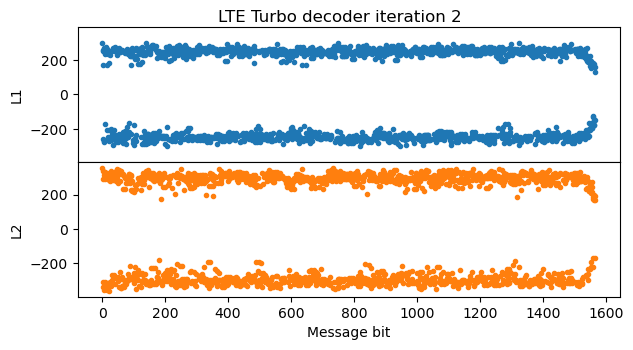

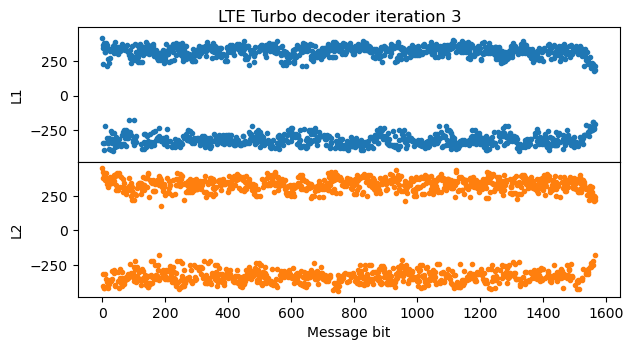

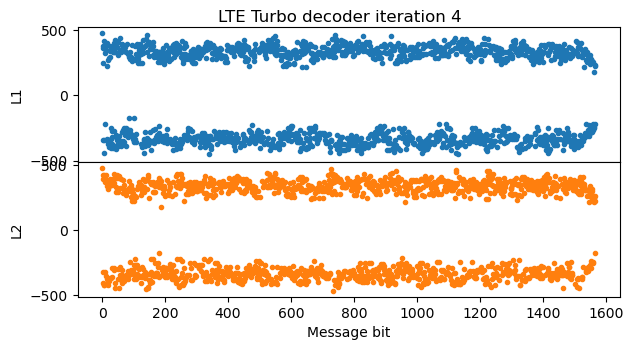

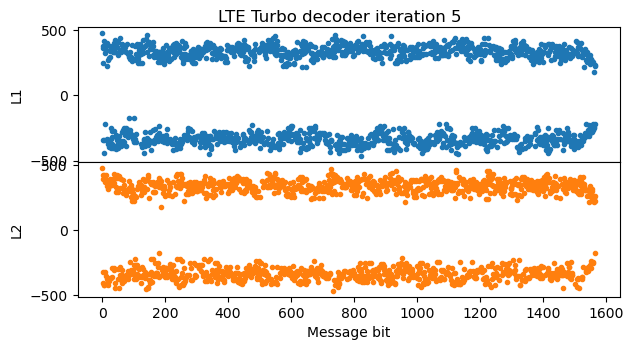

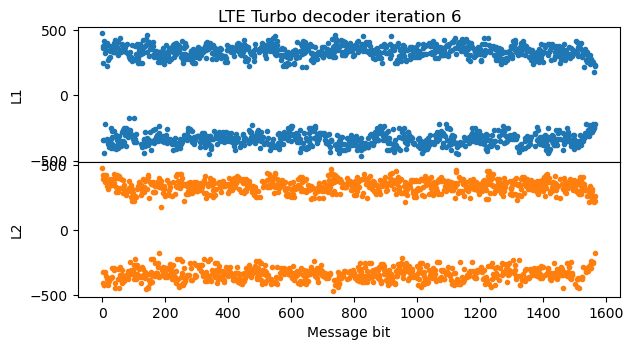

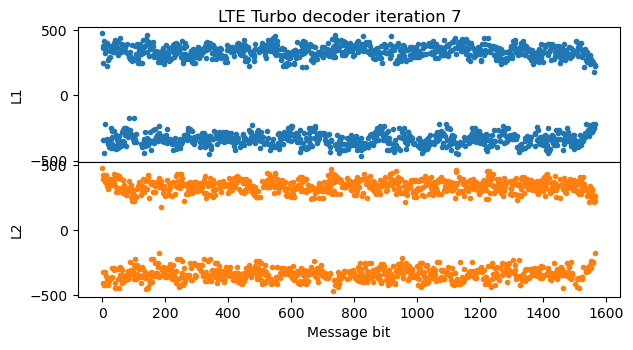

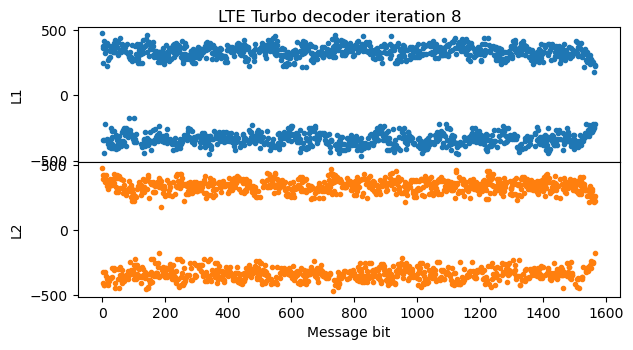

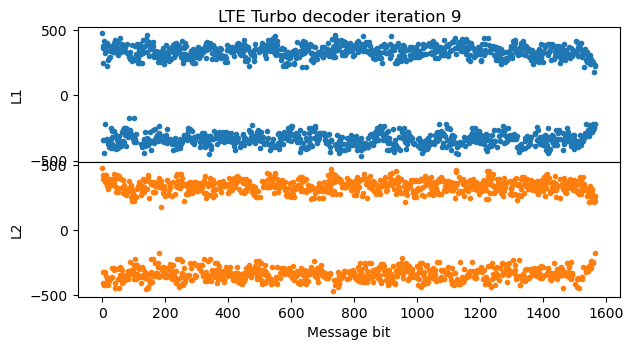

In [234]:
scrambling_seq = c_seq(qam64_rnti * 2**14 + 0 * 2**13 + ns_half * 2**9 + pci, qam16_llrs.size) 
qam16_descrambled = qam16_llrs * (1 - 2*scrambling_seq.astype('float'))
codeword0_tb = decode_transport_block([(qam16_descrambled, 0)], 1544, do_plots=True)
store_mac_pdu(327, codeword0_tb, qam64_rnti)
store_mac_pdu(327, codeword1_tb, qam64_rnti)
codeword0_tb.hex()

## PCAP output for wireshark

In [235]:
wireshark_udp_packets.sort(key=lambda packet: packet.time)
scapy.utils.wrpcap('lte-downlink.pcap', wireshark_udp_packets)